<a href="https://colab.research.google.com/github/CristinaMarsh/Learning_/blob/main/uncertainty/uncertainty_deep_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Aleatoric Uncertainty

## Generate Fake Regression Dataset with one Feature

#### Train set


This is a heteroscedastic dataset (variance changes for samples). 

In the following we want to estimate the variance based on the training data (conditioned on the inputs).

In [1]:
# coding by my self

from scipy import stats
import matplotlib.pyplot as plt
from matplotlib.pyplot import scatter, figure

import math
import numpy as np

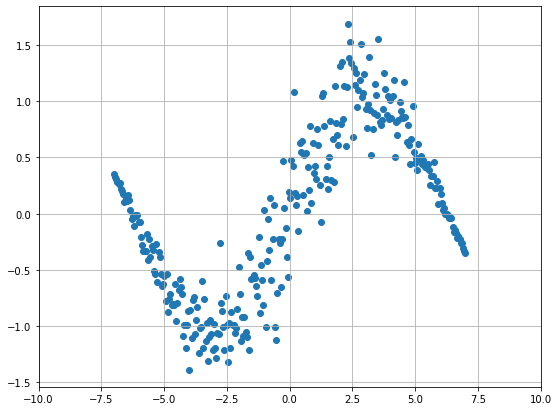

In [2]:
plt.figure(figsize=(9,7))

plt.xlim([-10,10])
start = -7
end = 7
n = 300

def sample_dataset(start, end, n):
    x = np.linspace(start, end, n)
    sample_mean = [math.sin(i/2) for i in x]
    sample_var = [((abs(start)+abs(end))/2 - abs(i))/16 for i in x]
    y = stats.norm(sample_mean, sample_var).rvs()
    return x, y

x_train, y_train = sample_dataset(start,end,n)
scatter(x_train,y_train)
plt.grid()

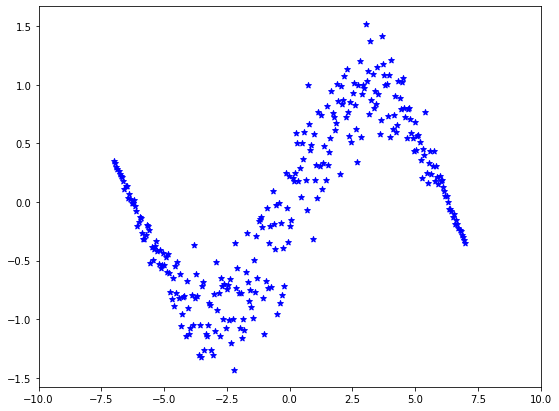

In [3]:
from scipy import stats
import matplotlib.pyplot as plt
from matplotlib.pyplot import scatter, figure
import math
import numpy as np
figure(figsize=(9, 7))

# Same range for all plots
plt.xlim([-10, 10])
start = -7
end = 7
n = 300

def sample_dataset(start, end, n):
    x = np.linspace(start, end, n)
    sample_mean = [math.sin(i/2) for i in x]
    sample_var = [((abs(start)+abs(end))/2 - abs(i))/16 for i in x]
    y = stats.norm(sample_mean, sample_var).rvs()
    return x, y

x_train, y_train = sample_dataset(start, end, n)
scatter(x_train, y_train, c="blue", marker="*")

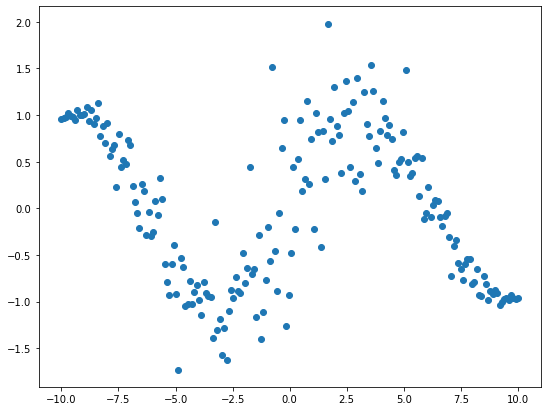

In [4]:
# 换一个分布
figure(figsize=(9, 7))
# Not exactely the same distribution, but works for now

x_test,y_test = sample_dataset(-10,10,200)
scatter(x_test,y_test)

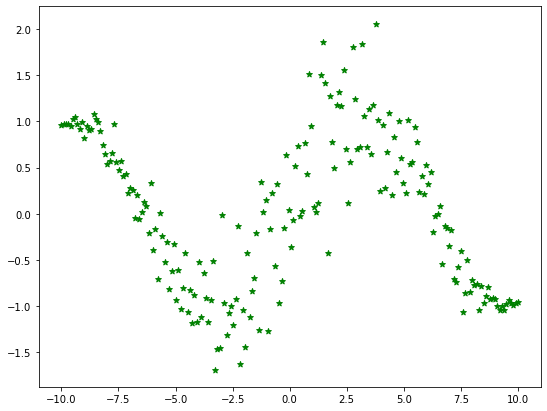

In [ ]:
figure(figsize=(9, 7))
# Not exactely the same distribution, but works for now
x_test, y_test = sample_dataset(-10, 10, 200)
scatter(x_test, y_test, c="green", marker="*")

In [ ]:
x_train.shape

(300,)

Put data into Tensor Datasets

In [5]:
#ON MY OWN
import torch
from torch.utils.data import TensorDataset, DataLoader

batch_size = 16

#Train
tensor_x = torch.Tensor(x_train).unsqueeze(1) #搞到(300,1)
tensor_y = torch.Tensor(y_train).unsqueeze(1)
train_dataset = TensorDataset(tensor_x,tensor_y)
train_loader = DataLoader(train_dataset,batch_size=batch_size,shuffle=True)


In [6]:
import torch
from torch.utils.data import TensorDataset, DataLoader

batch_size = 16

# Train
tensor_x = torch.Tensor(x_train).unsqueeze(1)
tensor_y = torch.Tensor(y_train).unsqueeze(1)
train_dataset = TensorDataset(tensor_x, tensor_y)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Test
tensor_x_test = torch.Tensor(x_test).unsqueeze(1)
tensor_y_test = torch.Tensor(y_test).unsqueeze(1)
test_dataset = TensorDataset(tensor_x_test, tensor_y_test)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

## Maximum likelihood Estimation

### Simple Neural Network that predicts mean and variance
- We output variance here, because our loss function expects var = sigma**2 (instead of just sigma)
- We could also use just one Linear output layer with 2 neurons

In [ ]:
# 用两个输出代替一个输出，以表示不确定性，i.e., predict mean and variance

from numpy.ma.core import outer
from sys import stderr
import torch.nn as nn
import torch.nn.functional as F

class SimpleNet(nn.Module):
    def __init__(self):
        super(SimpleNet, self).__init__()
        hidden_size = 64

        # We only have 1 input feature
        self.fc1 = nn.Linear(1, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.mu = nn.Linear(hidden_size, 1)
        self.var = nn.Linear(hidden_size, 1)

    def forward(self,x):
      h = torch.tanh(self.fc1(x))
      h = torch.tanh(self.fc2(h))
      mu = self.mu(h)
      var = torch.exp(self.var(h))
      return mu,var

net = SimpleNet()
print(net)
print("Params:", sum(p.numel() for p in net.parameters() if p.requires_grad))

SimpleNet(
  (fc1): Linear(in_features=1, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (mu): Linear(in_features=64, out_features=1, bias=True)
  (var): Linear(in_features=64, out_features=1, bias=True)
)
Params: 4418


In [ ]:
from numpy.ma.core import outer
from sys import stderr
import torch.nn as nn
import torch.nn.functional as F

class SimpleNet(nn.Module):
    def __init__(self):
        super(SimpleNet, self).__init__()
        hidden_size = 64

        # We only have 1 input feature
        self.fc1 = nn.Linear(1, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.mu = nn.Linear(hidden_size, 1)
        self.var = nn.Linear(hidden_size, 1)

    def forward(self, x):
        h = torch.tanh(self.fc1(x))
        h = torch.tanh(self.fc2(h))
        mu = self.mu(h)
        # Exponential activation to enforce positive var
        var = torch.exp(self.var(h))
        return mu, var

net = SimpleNet()
print(net)
print("Params:", sum(p.numel() for p in net.parameters() if p.requires_grad))

SimpleNet(
  (fc1): Linear(in_features=1, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (mu): Linear(in_features=64, out_features=1, bias=True)
  (var): Linear(in_features=64, out_features=1, bias=True)
)
Params: 4418


In [ ]:
import pandas as pd 
import seaborn as sns
sns.set(rc={'figure.figsize':(9, 7)})

def make_plot(model):
    # Get predictions
    mu, var = model(tensor_x_test)
    mu, sigma = mu.detach().numpy(), var.detach().numpy()**(1/2)

    # ~ 95% conf. interval (see https://en.wikipedia.org/wiki/1.96)
    y_vals = [mu, mu+2*sigma, mu-2*sigma]
    dfs = []

    # Create DF from predictions
    for i in range(3):
        data = {
              "x": list(tensor_x_test.squeeze().numpy()),
              "y": list(y_vals[i].squeeze())
        }
        temp = pd.DataFrame.from_dict(data)
        dfs.append(temp)
    df = pd.concat(dfs).reset_index()

    # Plot predictions with confidence
    sns_plot = sns.lineplot(data=df, x="x", y="y")

    # Highligh training range
    plt.axvline(x=start)
    plt.axvline(x=end)

    # Plot test data on top
    scatter(x_test, y_test, c="green", marker="*", alpha=0.5)
    plt.show()

### Train

- There are different variants for the loss. We will simply use the in pytorch already implemented [Gaussian Negative Log Likelihood](https://pytorch.org/docs/stable/generated/torch.nn.GaussianNLLLoss.html)
- The standard NLL Loss is only suited for classification problems
- [Implementation details here](https://towardsdatascience.com/knowing-known-unknowns-with-deep-neural-networks-caac1c4c1f5d)
- Another approach is to sample from the Gaussian distribution that is defined by mju/sigma and use MSE
- If we train too long it starts to overfit on the train data


GAUSSIANNLLLOSS


CLASS 
`torch.nn.GaussianNLLLoss ( $*, f u l l=F a l$ se, eps $=1 e-06$, reduction= 'mean ' ) [SOURCE]`
Gaussian negative log likelihood loss.
The targets are treated as samples from Gaussian distributions with expectations and variances predicted by the
neural network. For a target tensor modelled as having Gaussian distribution with a tensor of expectations input
and a tensor of positive variances var the loss is:
CLASS torch.nn.GaussianNLLLoss ( $*$, full=False, eps=1e-O6, reduction= ' mean ' ) [SOURCE]
Gaussian negative log likelihood loss.
The targets are treated as samples from Gaussian distributions with expectations and variances predicted by the
neural network. For a target tensor modelled as having Gaussian distribution with a tensor of expectations input
and a tensor of positive variances var the loss is:
loss $=\frac{1}{2}\left(\log \left(\max (\right.\right.$ var, eps) $)+\frac{(\text { input }-\text { target })^{2}}{\text { max (var, eps) })}+$ const.
where eps is used for stability. By default, the constant term of the loss function is omitted unless full is True. If
var is not the same size as input (due to a homoscedastic assumption), it must either have a final dimension of 1
or have one fewer dimension (with all other sizes being the same) for correct broadcasting.
$\operatorname{loss}=\frac{1}{2}\left(\log (\max (\operatorname{var}\right.$, eps $\left.))+\frac{(\text { input }-\text { target })^{2}}{\max (\text { var }, \text { eps })}\right)+$ const.
where eps is used for stability. By default, the constant term of the loss function is omitted unless full is True. If
var is not the same size as input (due to a homoscedastic assumption), it must either have a final dimension of 1
or have one fewer dimension (with all other sizes being the same) for correct broadcasting.

Epoch 0 | batch train loss: -1.5129995346069336 | test loss: 0.15817901492118835


KeyboardInterrupt: ignored

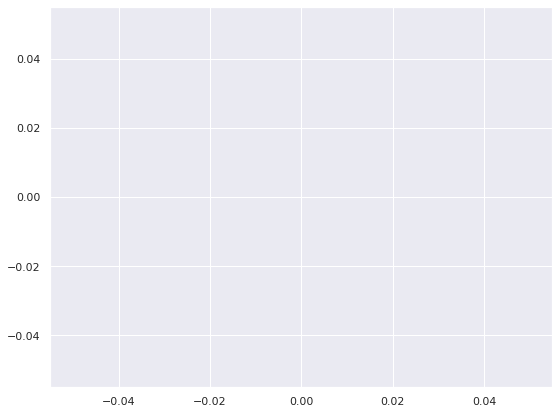

In [ ]:
#write by myself
import torch.optim as optim
import torch.nn.functional as f
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

criterion = torch,nn.GaussianNLLLoss(eps=1e-2) #error  should be 1e-02
optimizer = optim.Adam(net.parameters(),lr=0.001)

criterion = torch.nn.GaussianNLLLoss(eps=1e-02) #right
optimizer = optim.Adam(net.parameters(), lr=0.001)


net.train()
net.to(device)

for epoch in range(150):
  for batch in train_loader:
    x = batch[0].to(device)
    y = batch[1].to(device)
    optimizer.zero_grad() #
    mu, var = net(x)
    loss = criterion(mu, y, var)
    loss.backward()
    optimizer.step()
  if epoch % 10 == 0:
    all_test_losses = []
    #test loop 
    for batch in test_loader:
      x = batch[0].to(device)
      y = batch[1].to(device)
      mu, var = net(x)
      all_test_losses.append(criterion(mu,y,var).item())
    test_loss = sum(all_test_losses)/len(all_test_losses)
    print(f'Epoch {epoch} | batch train loss: {loss} | test loss: {test_loss}')
    make_plot(net)

Epoch 0 | batch train loss: 0.0645533874630928 | test loss: 0.31614208221435547


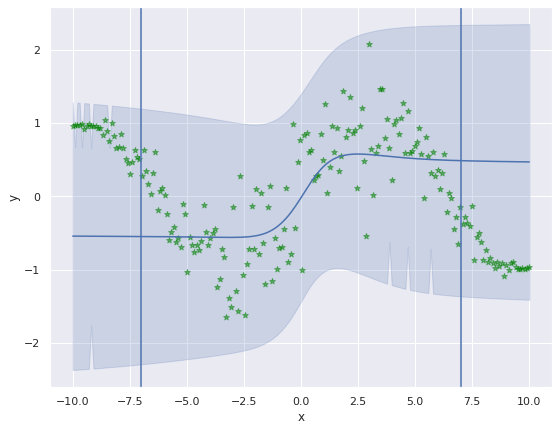

Epoch 10 | batch train loss: -0.43008556962013245 | test loss: 0.19797400671702164


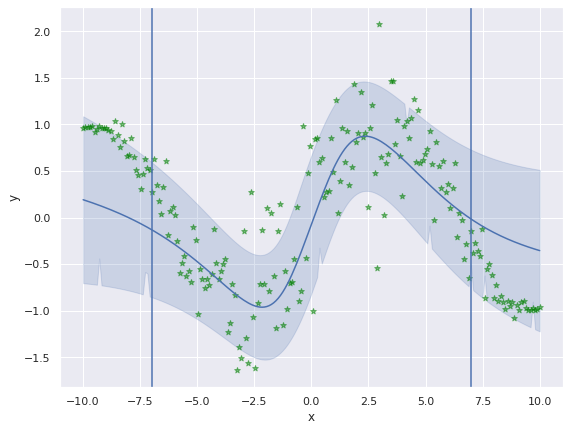

Epoch 20 | batch train loss: -0.9955361485481262 | test loss: 0.2687906657273953


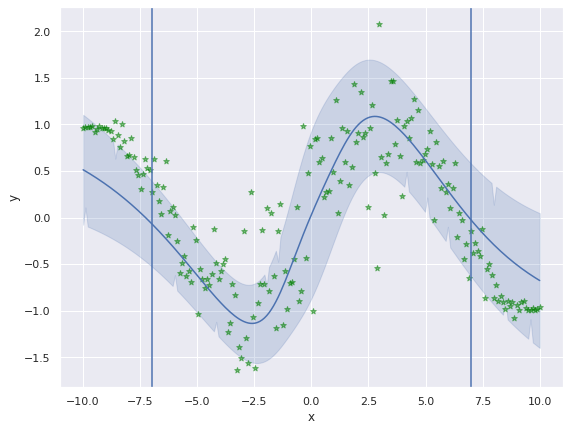

Epoch 30 | batch train loss: -0.4346461296081543 | test loss: 0.3052158378637754


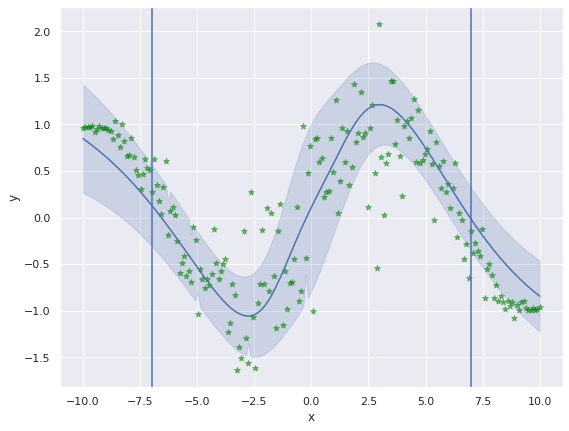

Epoch 40 | batch train loss: -1.096426010131836 | test loss: -0.0731357502249571


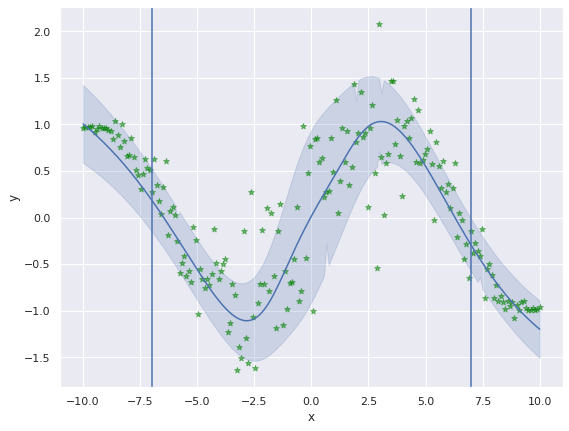

Epoch 50 | batch train loss: -1.2182475328445435 | test loss: -0.2249900412101012


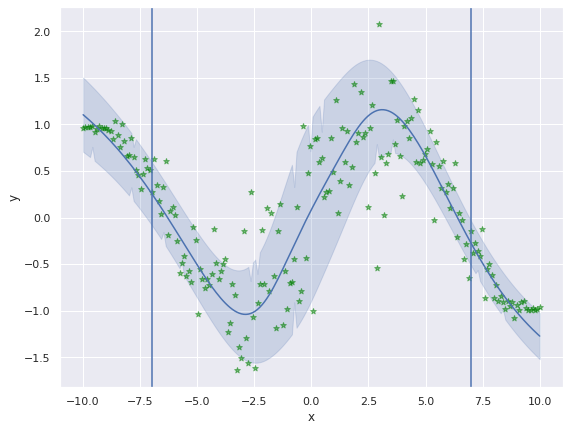

Epoch 60 | batch train loss: -0.9565700888633728 | test loss: -0.005076347635342524


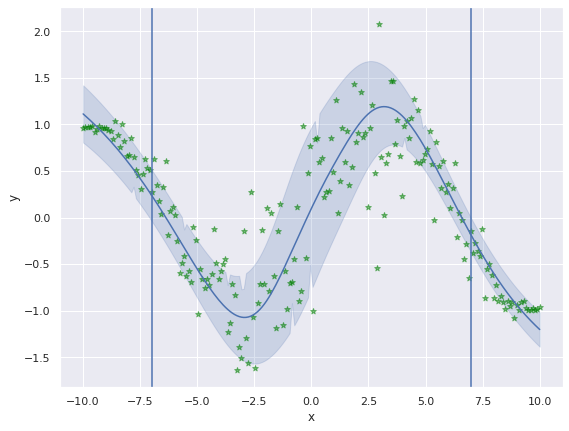

Epoch 70 | batch train loss: -1.1043425798416138 | test loss: 0.36570699512958527


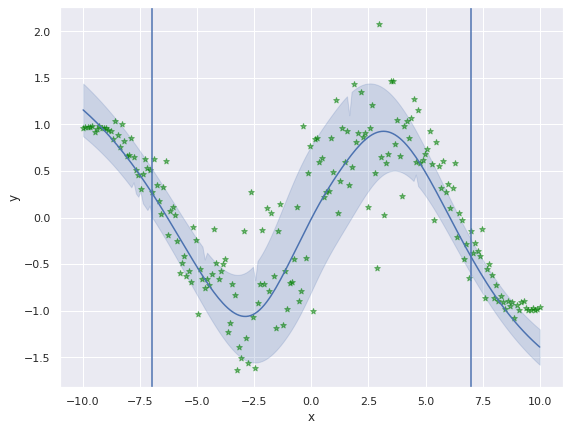

Epoch 80 | batch train loss: -1.2936581373214722 | test loss: 0.13905325990456802


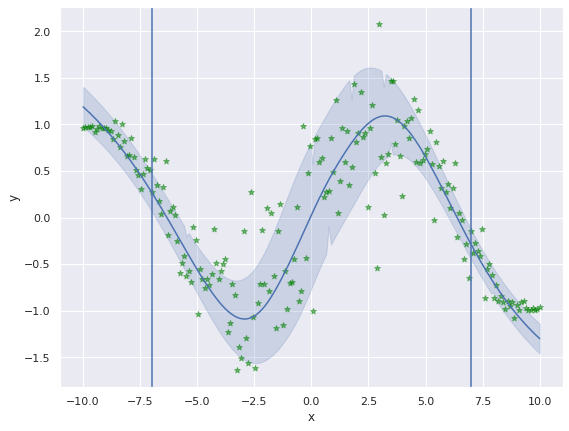

Epoch 90 | batch train loss: -0.8901103138923645 | test loss: 0.35643210777869594


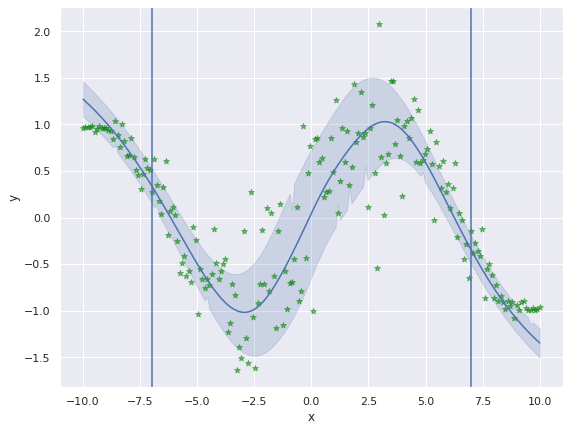

Epoch 100 | batch train loss: -1.608487606048584 | test loss: 0.502455119903271


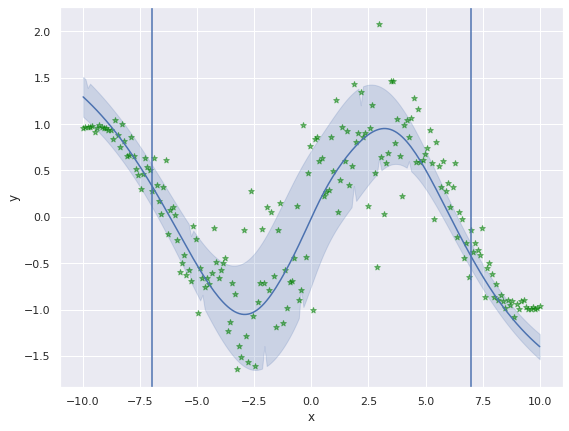

Epoch 110 | batch train loss: -1.0429307222366333 | test loss: 0.10690056933806492


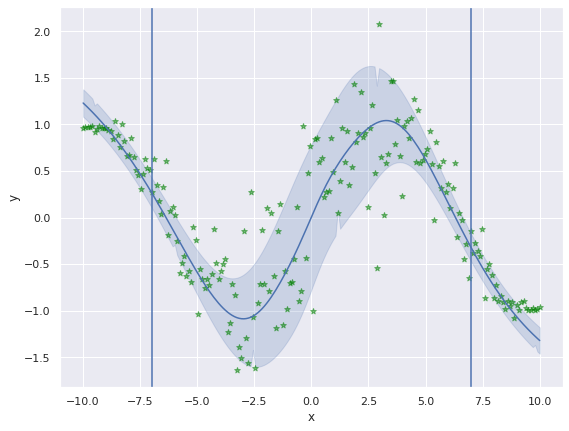

Epoch 120 | batch train loss: -1.3463853597640991 | test loss: 0.1093187492627364


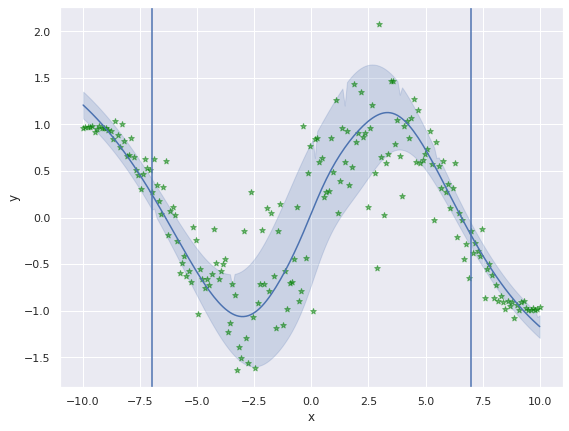

Epoch 130 | batch train loss: -1.1837339401245117 | test loss: 0.6122134041327697


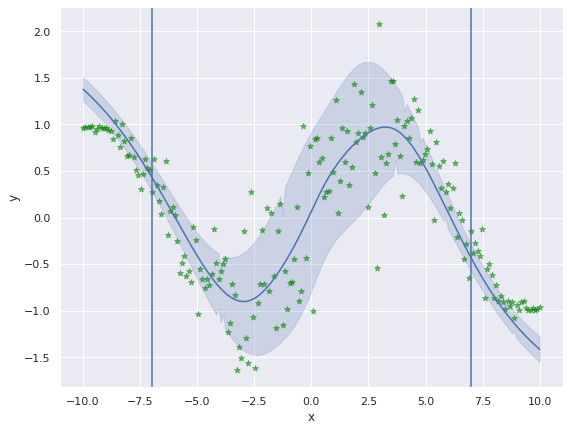

Epoch 140 | batch train loss: -0.9072096943855286 | test loss: 0.1954656564272367


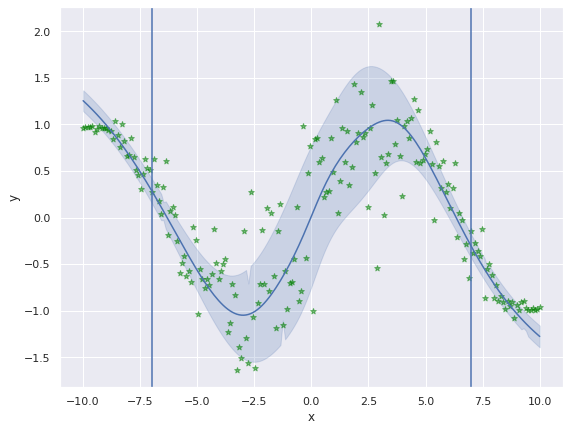

In [ ]:
import torch.optim as optim
import torch.nn.functional as F

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# Loss expects mean, variance and target
criterion = torch.nn.GaussianNLLLoss(eps=1e-02)
optimizer = optim.Adam(net.parameters(), lr=0.001)

net.train()
net.to(device)
for epoch in range(150):
    # Train loop
    for batch in train_loader:
        x = batch[0].to(device)
        y = batch[1].to(device)
        optimizer.zero_grad()
        mu, var = net(x)
        loss = criterion(mu, y, var)
        loss.backward()
        optimizer.step()
    if epoch % 10 == 0:
        all_test_losses = []
        # Test loop
        for batch in test_loader:
             x = batch[0].to(device)
             y = batch[1].to(device)
             mu, var = net(x)
             all_test_losses.append(criterion(mu, y, var).item())
        test_loss = sum(all_test_losses)/len(all_test_losses)
        print(f"Epoch {epoch} | batch train loss: {loss} | test loss: {test_loss}")
        make_plot(net)

## Mixture Density Network (also MLE)

- Great implementations can be found [here](https://deep-and-shallow.com/2021/03/20/mixture-density-networks-probabilistic-regression-for-uncertainty-estimation/) and [here](https://gitlab.cs.fau.de/oc81adow/pytorch-mdn/-/blob/master/mdn/mdn.py)
- Applying a MDN doesn't make too much sense for our dataset, as we have simple gaussian variance (an not for example multimodal)
- If you don't know how the uncertainty of the target variable is distributed, using a MDN can be very helpful





In [ ]:
class MDN(nn.Module):
    def __init__(self):
        super(MDN, self).__init__()
        hidden_size = 64
        self.num_gaussians = 3

        # We only have 1 input feature
        self.fc1 = nn.Linear(1, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.mu = nn.Linear(hidden_size, self.num_gaussians)
        self.sigma = nn.Linear(hidden_size, self.num_gaussians)
        self.alpha = nn.Linear(hidden_size, self.num_gaussians)

    def forward(self, x):
        h = torch.tanh(self.fc1(x))
        h = torch.tanh(self.fc2(h))
        mus = self.mu(h)
        sigmas = torch.exp(self.sigma(h))
        alphas = F.softmax(self.alpha(h), dim=1)
        return mus, sigmas, alphas
mdn = MDN()

In [ ]:
from torch.distributions.mixture_same_family import MixtureSameFamily
from torch.distributions import Categorical, Normal

def make_plot_mdn(model):
    # Get predictions
    mus, sigmas, alphas = model(tensor_x_test)

    # Define distribution with these parameters
    gmm = MixtureSameFamily(
            mixture_distribution=Categorical(probs=alphas),
            component_distribution=Normal(
                loc=mus,       
                scale=sigmas))
    mean = gmm.mean.detach().numpy()
    var = gmm.variance.detach().numpy()


    y_vals = [mean, mean+2*var**(1/2), mean-2*var**(1/2)]
    dfs = []
    
    for i in range(3):
        data = {
              "x": list(tensor_x_test.squeeze().numpy()),
              "y": list(y_vals[i].squeeze())
        }
        temp = pd.DataFrame.from_dict(data)
        dfs.append(temp)
    df = pd.concat(dfs).reset_index()

    # Plot means
    for i in range(model.num_gaussians):
        scatter(x_test, mus[:, i].detach().numpy(), alpha=0.3, s=4)

    # Plot predictions with confidence
    sns_plot = sns.lineplot(data=df, x="x", y="y")
    plt.axvline(x=start)
    plt.axvline(x=end)
    scatter(x_test, y_test, c="green", marker="*", alpha=0.3)
    plt.show()

Loss function from [here](https://towardsdatascience.com/a-hitchhikers-guide-to-mixture-density-networks-76b435826cca) adjusted to Pytorch.

In [ ]:
# 学习自己定制loss function

def mdn_loss(mu, y, sigma, alphas):
    gmm = MixtureSameFamily(
            mixture_distribution=Categorical(probs=alphas),
            component_distribution=Normal(
                loc=mu,       
                scale=sigma))
    log_likelihood = gmm.log_prob(y.t())
    return -torch.mean(log_likelihood, axis=1)

In [ ]:
def mdn_loss(mu, y, sigma, alphas):
    gmm = MixtureSameFamily(
            mixture_distribution=Categorical(probs=alphas),
            component_distribution=Normal(
                loc=mu,       
                scale=sigma))
    log_likelihood = gmm.log_prob(y.t())
    return -torch.mean(log_likelihood, axis=1)

Epoch 0 | batch train loss: 0.9697616696357727 | test loss: 1.3730574387770433


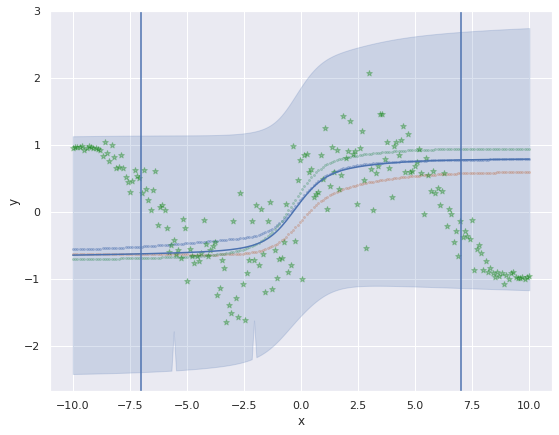

Epoch 10 | batch train loss: 0.5471627712249756 | test loss: 1.4230650984323943


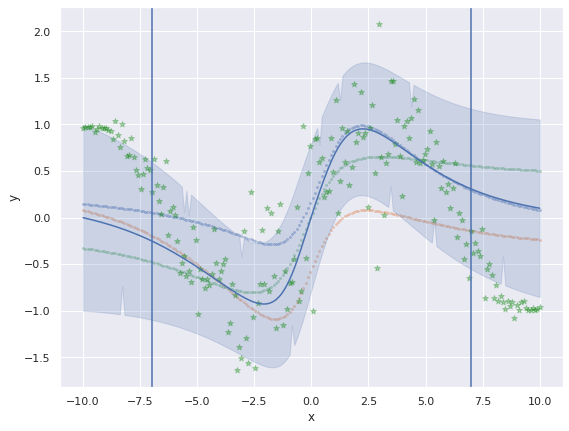

Epoch 20 | batch train loss: 0.2255362719297409 | test loss: 1.4873047333497267


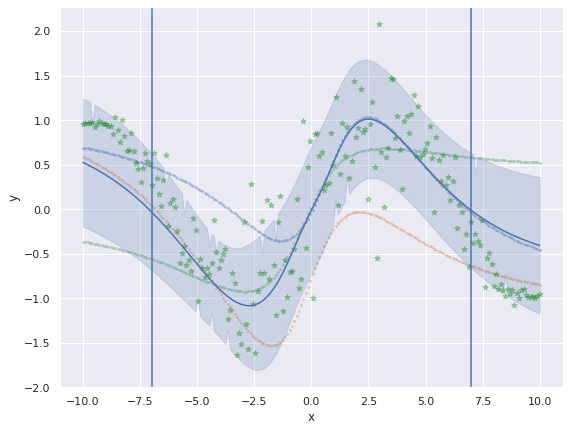

Epoch 30 | batch train loss: -0.0628366693854332 | test loss: 1.077412486076355


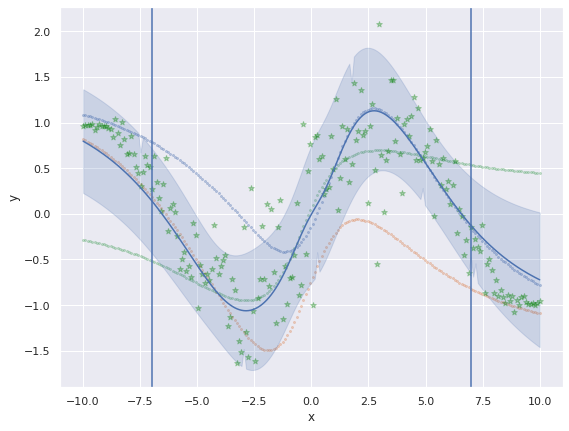

Epoch 40 | batch train loss: -0.4792526066303253 | test loss: 0.8396230248304514


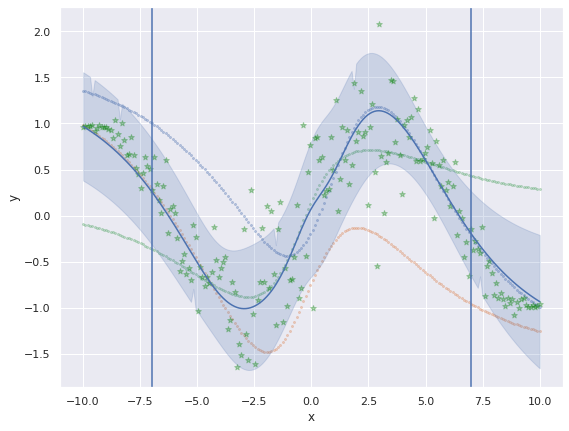

Epoch 50 | batch train loss: -0.14068450033664703 | test loss: 1.0124073349512541


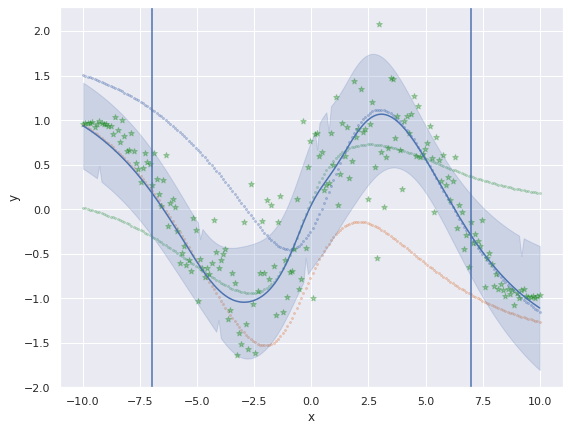

Epoch 60 | batch train loss: -0.08481041342020035 | test loss: 0.975855332154494


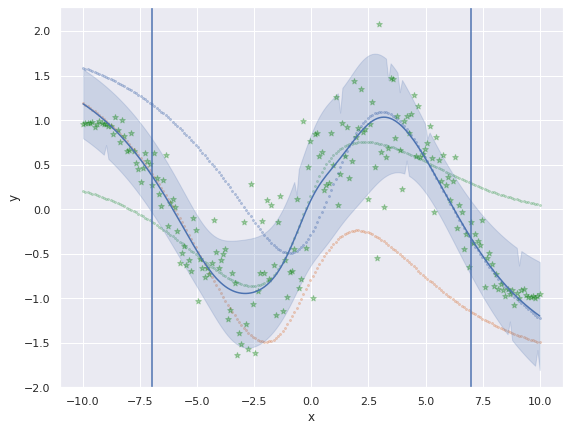

Epoch 70 | batch train loss: -0.5368322730064392 | test loss: 0.9228975635308486


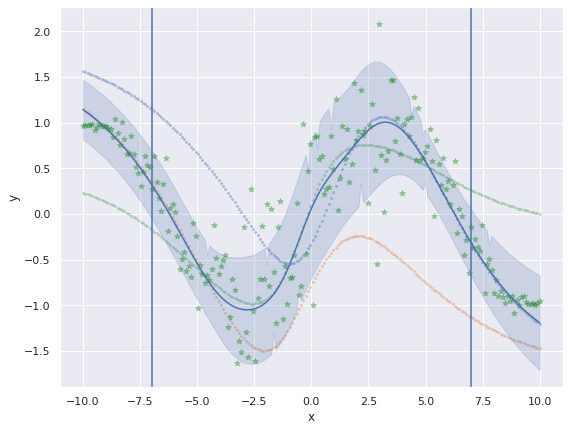

Epoch 80 | batch train loss: -0.29629239439964294 | test loss: 1.0339320462483625


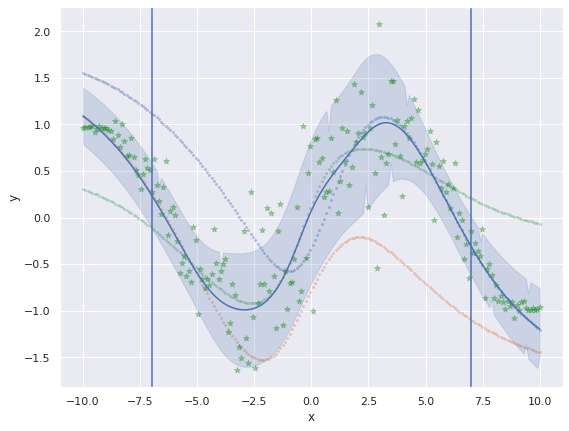

Epoch 90 | batch train loss: -0.21119266748428345 | test loss: 1.4069541119612181


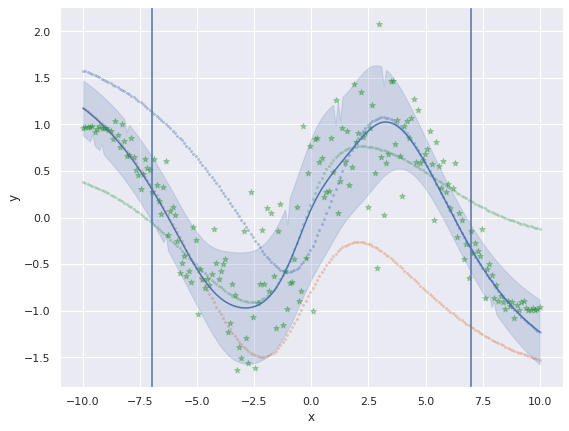

Epoch 100 | batch train loss: -0.13926273584365845 | test loss: 2.099817441059993


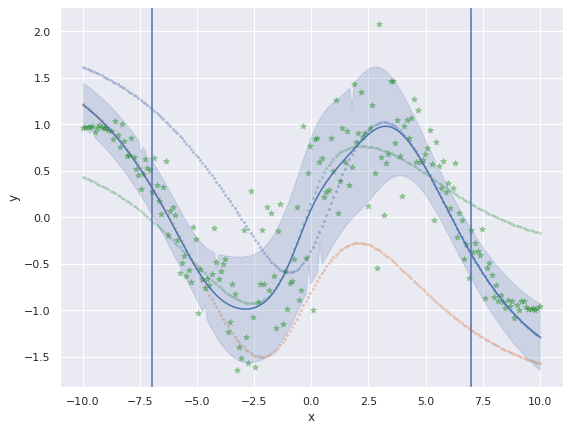

Epoch 110 | batch train loss: 0.2722850739955902 | test loss: 1.745471858061277


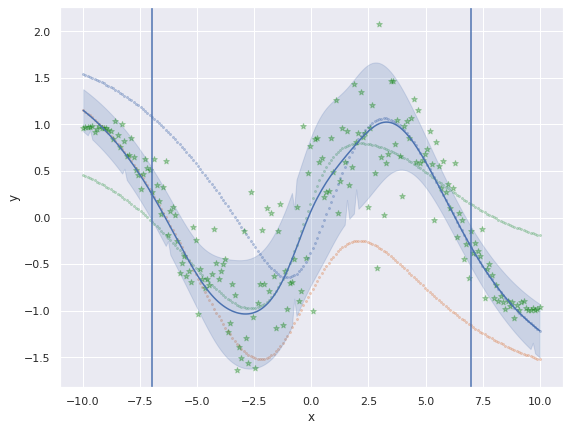

Epoch 120 | batch train loss: -0.5949998497962952 | test loss: 1.8644598860007067


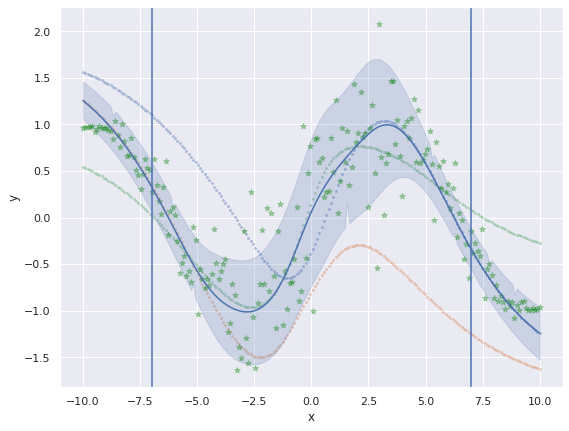

Epoch 130 | batch train loss: -0.4512085020542145 | test loss: 2.385727387208205


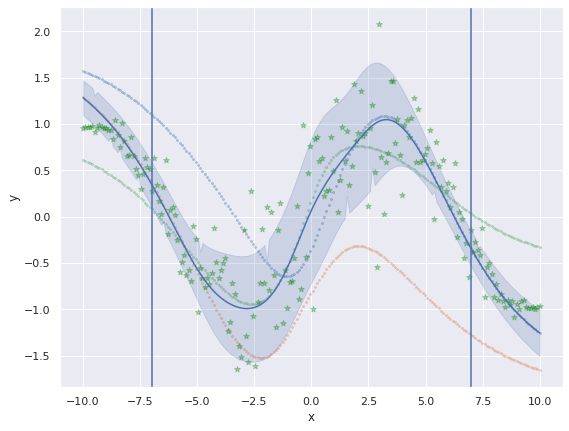

Epoch 140 | batch train loss: -0.32515749335289 | test loss: 1.6839447766542435


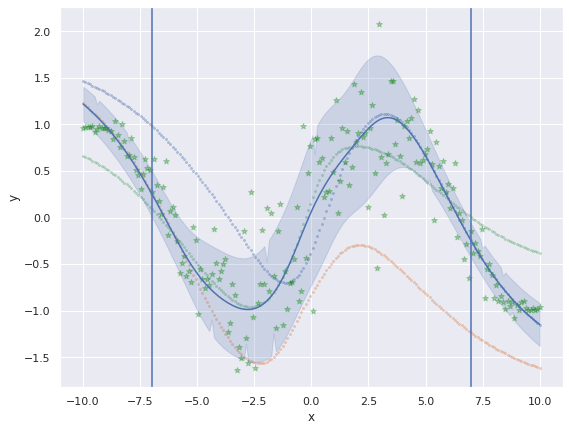

In [ ]:
import torch.optim as optim
import torch.nn.functional as F

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
optimizer = optim.Adam(mdn.parameters(), lr=0.0005)
criterion = mdn_loss
mdn.train()
mdn.to(device)
for epoch in range(150):
    # Train loop
    for batch in train_loader:
        x = batch[0].to(device)
        y = batch[1].to(device)
        optimizer.zero_grad()
        mus, sigmas, alphas = mdn(x)
        loss = criterion(mus, y, sigmas, alphas)
        loss.backward()
        optimizer.step()
    if epoch % 10 == 0:
        all_test_losses = []
        # Test loop
        for batch in test_loader:
             x = batch[0].to(device)
             y = batch[1].to(device)
             mus, sigmas, alphas = mdn(x)
             all_test_losses.append(criterion(mus, y, sigmas, alphas).item())
        test_loss = sum(all_test_losses)/len(all_test_losses)
        print(f"Epoch {epoch} | batch train loss: {loss.item()} | test loss: {test_loss}")
        make_plot_mdn(mdn)

## Quantile Regression
- Some of the implementation details from [here](https://towardsdatascience.com/deep-quantile-regression-c85481548b5a)
- In this case we know that the variance in the variable is normally distributed (and therefore we could optimize the gaussian likelihood). Here we see however that we get a pretty good approximation, even though we don't use the underlying distribution

### Quantile Regression Loss function

- 针对回归问题
- 贝叶斯略昂贵

One area that Deep Learning has not explored extensively is the uncertainty in estimates. Most Deep Learning frameworks currently focus on giving a best estimate as defined by a loss function. Occasionally something beyond a point estimate is required to make a decision. This is where a distribution would be useful. Bayesian statistics lends itself to this problem really well since a distribution over the dataset is inferred. However, Bayesian methods so far have been rather slow and would be expensive to apply to large datasets.

As far as decision making goes, most people actually require quantiles as opposed to true uncertainty in an estimate. For instance when measuring a child’s weight for a given age, the weight of an individual will vary. What would be interesting is (for arguments sake) the 10th and 90th percentile. Note that the uncertainty is different to quantiles in that I could request for a confidence interval on the 90th quantile. This article will purely focus on inferring quantiles.


In regression the most commonly used loss function is the mean squared error function. If we were to take the negative of this loss and exponentiate it, the result would correspond to the gaussian distribution. The mode of this distribution (the peak) corresponds to the mean parameter. Hence, when we predict using a neural net that minimised this loss we are predicting the mean value of the output which may have been noisy in the training set.

The loss in Quantile Regression for an individual data point is defined as:

$$
\mathscr{L}\left(\xi_{i} \mid \alpha\right)= \begin{cases}\alpha \xi_{i} & \text { if } \xi_{i} \geq 0 \\ (\alpha-1) \xi_{i} & \text { if } \xi_{i}<0\end{cases}
$$

where alpha is the required quantile (a value between 0 and 1) and

$$
\xi_{i}=y_{i}-f\left(\mathbf{x}_{i}\right)
$$

where $f(x)$ is the predicted (quantile) model and $y$ is the observed value for the corresponding input $\mathrm{x}$. The average loss over the entire dataset is shown below:
$$
\mathscr{L}(\mathbf{y}, \mathbf{f} \mid \alpha)=\frac{1}{N} \sum_{i=1}^{N} \mathscr{L}\left(y_{i}-f\left(\mathbf{x}_{i}\right) \mid \alpha\right)
$$

The case when alpha=0.5 is most likely more familiar since it corresponds to the Mean Absolute Error (MAE). This loss function consistently estimates the median (50th percentile), instead of the mean.

In [ ]:
# Write code by my self

from numpy.ma.core import outer
from sys import stderr
import torch.nn as nn
import torch.nn.functional as F


class QuantileNet(nn.Module):
  def __init__(self):
    # error occur super(QuantileNet,self).__init__
    super(QuantileNet,self).__init__()
    hidden_size = 64

    # We only have 1 input feature
    self.fc1 = nn.Linear(1, hidden_size)
    self.fc2 = nn.Linear(hidden_size, hidden_size)
    self.lower_quantile = nn.Linear(hidden_size, 1)
    self.median = nn.Linear(hidden_size, 1)
    self.upper_quantile = nn.Linear(hidden_size, 1)

  def forward(self,x):
    h = torch.tanh(self.fc1(x))
    h = torch.tanh(self.fc2(h))
    lq = self.lower_quantile(h)
    med = self.median(h)
    uq = self.upper_quantile(h)
    return torch.cat([lq,med,uq],axis=1)

qnet = QuantileNet()
print(qnet)

QuantileNet(
  (fc1): Linear(in_features=1, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (lower_quantile): Linear(in_features=64, out_features=1, bias=True)
  (median): Linear(in_features=64, out_features=1, bias=True)
  (upper_quantile): Linear(in_features=64, out_features=1, bias=True)
)


In [ ]:
class QuantileNet(nn.Module):
    def __init__(self):
        super(QuantileNet, self).__init__()
        hidden_size = 64

        # We only have 1 input feature
        self.fc1 = nn.Linear(1, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.lower_quantile = nn.Linear(hidden_size, 1)
        self.median = nn.Linear(hidden_size, 1)
        self.upper_quantile = nn.Linear(hidden_size, 1)

    def forward(self, x):
        h = torch.tanh(self.fc1(x))
        h = torch.tanh(self.fc2(h))
        lq = self.lower_quantile(h)
        med = self.median(h)
        uq = self.upper_quantile(h)
        return torch.cat([lq, med, uq], axis=1)
        
qnet = QuantileNet()

In [ ]:
def make_plot_qnet(model):
    preds = model(tensor_x_test)
    preds = preds.detach().numpy()

    dfs = []
    # Lower / Median / Upper
    y_vals = [preds[:, 1], preds[:, 0], preds[:, 2]]

    for i in range(3):
      data = {
            "x": list(tensor_x_test.squeeze().numpy()),
            "y": list(y_vals[i].squeeze())
      }
      temp = pd.DataFrame.from_dict(data)
      dfs.append(temp)

    df = pd.concat(dfs).reset_index()

    # Plot predictions with confidence
    sns_plot = sns.lineplot(data=df, x="x", y="y")

    # Highligh training range
    plt.axvline(x=start)
    plt.axvline(x=end)

    # Plot train data on top
    scatter(x_test, y_test, c="green", marker="*", alpha=0.1)
    plt.show()

Loss implementation from [here](https://forums.fast.ai/t/quantile-regression-prediction-intervals-confidence-intervals/58821/2).

Epoch 0 | batch train loss: 0.21959422528743744 | test loss: 0.6392597556114197


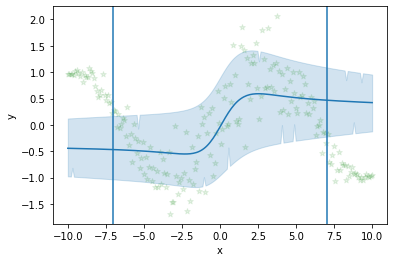

Epoch 10 | batch train loss: 0.21221370995044708 | test loss: 0.4877348244190216


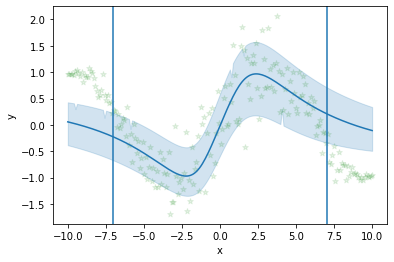

Epoch 20 | batch train loss: 0.11587338894605637 | test loss: 0.34323200583457947


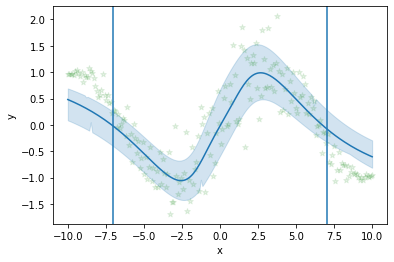

Epoch 30 | batch train loss: 0.12415727227926254 | test loss: 0.2540167570114136


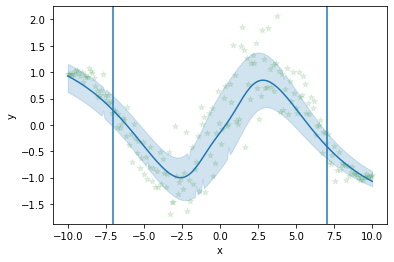

Epoch 40 | batch train loss: 0.09163793176412582 | test loss: 0.24761654436588287


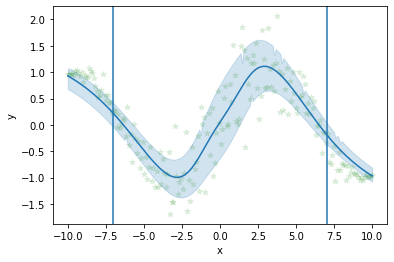

Epoch 50 | batch train loss: 0.2334177941083908 | test loss: 0.24689315259456635


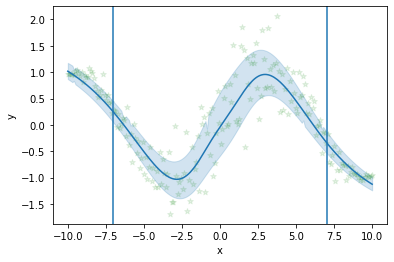

Epoch 60 | batch train loss: 0.1614389568567276 | test loss: 0.26646196842193604


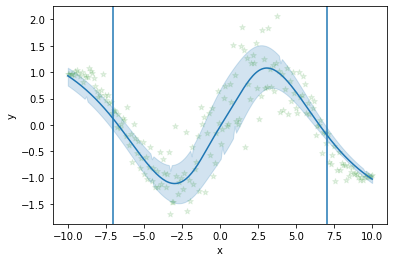

Epoch 70 | batch train loss: 0.12810580432415009 | test loss: 0.2463703751564026


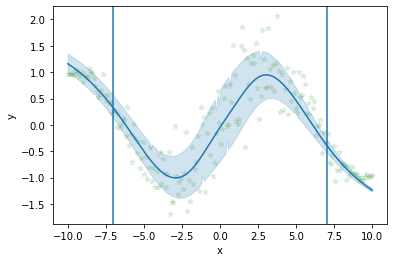

Epoch 80 | batch train loss: 0.18162333965301514 | test loss: 0.24525927007198334


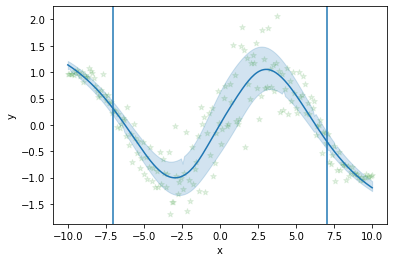

Epoch 90 | batch train loss: 0.10746241360902786 | test loss: 0.24783390760421753


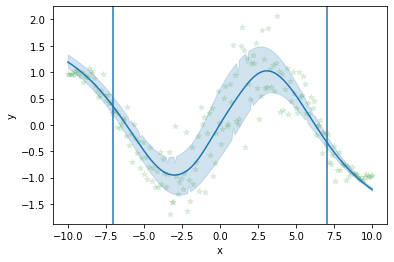

In [ ]:
import torch
import pandas as pd
import seaborn as sns
import torch.optim as optim
import torch.nn.functional as F

def quantile_loss(preds, target, quantiles=[0.05, 0.5, 0.95]):
    """ aka Pinball loss """
    losses = []
    for i, q in enumerate(quantiles):
        errors = target - torch.unsqueeze(preds[:, i], 1)
        q_loss = torch.max((q-1) * errors, q * errors)
        losses.append(q_loss)
    loss = torch.mean(torch.sum(torch.cat(losses, dim=1), dim=1))
    return loss

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
optimizer = optim.Adam(qnet.parameters(), lr=0.001)
criterion = quantile_loss
qnet.train()
qnet.to(device)

for epoch in range(100):
    # Train loop
    for batch in train_loader:
        x = batch[0].to(device)
        y = batch[1].to(device)
        optimizer.zero_grad()
        preds = qnet(x)
        loss = criterion(preds, y)
        loss.backward()
        optimizer.step()
    if epoch % 10 == 0:
        all_test_losses = []
        # Test loop
        for batch in test_loader:
             x = batch[0].to(device)
             y = batch[1].to(device)
             preds = qnet(x)
             all_test_losses.append(criterion(preds, y))
        test_loss = sum(all_test_losses)/len(all_test_losses)
        print(f"Epoch {epoch} | batch train loss: {loss.item()} | test loss: {test_loss}")
        make_plot_qnet(qnet)

# Epistemic Uncertainty

```
Before you run this section, please first create the dataset in the first cell
```

## Bayesian Neural Networks

Several choices for BNNs in Pytorch:
- [Blitz](https://github.com/piEsposito/blitz-bayesian-deep-learning)
- [ProbFlow](https://probflow.readthedocs.io/en/latest/)
- [Pyro](https://docs.pyro.ai/en/stable/getting_started.html)
- [Tyxe](https://github.com/karalets/TyXe)
- [Torchbnn](hhttps://github.com/Harry24k/bayesian-neural-network-pytorch)
- and many more...

We will use Blitz in the following, because it has a very straight-forward interface. It currently supports these layers:
*   BayesianModule
*   BayesianLinear
*   BayesianConv1d
*   BayesianConv2d
*   BayesianConv3d
*   BayesianLSTM
*   BayesianGRU
*   BayesianEmbedding

In [7]:
!pip install blitz-bayesian-pytorch


# A little bit of imports from previous section
import math
import numpy as np
from scipy import stats
import pandas as pd 
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
from matplotlib.pyplot import scatter, figure
sns.set(rc={'figure.figsize':(9, 7)})

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 48 kB 4.1 MB/s 


- The decorator allows to do bayesian-specific operations such as sampling and calculating the variational inference loss. 
- Internally, the bayesian layers use for example **TrainableRandomDistribution** to represent trainable distributions over weights.
- TrainableRandomDistribution uses the reparametrization trick for sampling

In [10]:
#auhor: Christina

from blitz.modules import BayesianLinear
from blitz.utils import variational_estimator

@variational_estimator

class BayesianNetwork(nn.Module):
  def __init__(self):
    super().__init__()
    hidden_size = 32

    self.blinear1 = BayesianLinear(1, hidden_size, prior_sigma_1=1)
    self.blinear2 = BayesianLinear(hidden_size, hidden_size, prior_sigma_1=1)
    self.blinear3 = BayesianLinear(hidden_size, 1, prior_sigma_1=1)

  def forward(self,x):
    x_ = torch.relu(self.blinear1(x))
    x_ = torch.relu(self.blinear2(x_))
    return self.blinear3(x_)

bnn = BayesianNetwork()

print(bnn)
print(f'Params: {sum(p.numel() for p in bnn.parameters() if p.requires_grad)}')

BayesianNetwork(
  (blinear1): BayesianLinear(
    (weight_sampler): TrainableRandomDistribution()
    (bias_sampler): TrainableRandomDistribution()
    (weight_prior_dist): PriorWeightDistribution()
    (bias_prior_dist): PriorWeightDistribution()
  )
  (blinear2): BayesianLinear(
    (weight_sampler): TrainableRandomDistribution()
    (bias_sampler): TrainableRandomDistribution()
    (weight_prior_dist): PriorWeightDistribution()
    (bias_prior_dist): PriorWeightDistribution()
  )
  (blinear3): BayesianLinear(
    (weight_sampler): TrainableRandomDistribution()
    (bias_sampler): TrainableRandomDistribution()
    (weight_prior_dist): PriorWeightDistribution()
    (bias_prior_dist): PriorWeightDistribution()
  )
)
Params: 4612


In [8]:
from blitz.modules import BayesianLinear
from blitz.utils import variational_estimator

@variational_estimator
class BayesianNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        hidden_size = 32

        self.blinear1 = BayesianLinear(1, hidden_size, prior_sigma_1=1)
        self.blinear2 = BayesianLinear(hidden_size, hidden_size, prior_sigma_1=1)
        self.blinear3 = BayesianLinear(hidden_size, 1, prior_sigma_1=1)
        
    def forward(self, x):
        x_ = torch.relu(self.blinear1(x))
        x_ = torch.relu(self.blinear2(x_))
        return self.blinear3(x_)

bnn = BayesianNetwork()
print(bnn)
print("Params:", sum(p.numel() for p in bnn.parameters() if p.requires_grad))

BayesianNetwork(
  (blinear1): BayesianLinear(
    (weight_sampler): TrainableRandomDistribution()
    (bias_sampler): TrainableRandomDistribution()
    (weight_prior_dist): PriorWeightDistribution()
    (bias_prior_dist): PriorWeightDistribution()
  )
  (blinear2): BayesianLinear(
    (weight_sampler): TrainableRandomDistribution()
    (bias_sampler): TrainableRandomDistribution()
    (weight_prior_dist): PriorWeightDistribution()
    (bias_prior_dist): PriorWeightDistribution()
  )
  (blinear3): BayesianLinear(
    (weight_sampler): TrainableRandomDistribution()
    (bias_sampler): TrainableRandomDistribution()
    (weight_prior_dist): PriorWeightDistribution()
    (bias_prior_dist): PriorWeightDistribution()
  )
)
Params: 4612


In [11]:
def make_plot_bnn(model, samples = 500):
    preds = [model(tensor_x_test) for i in range(samples)]
    preds = torch.stack(preds)
    means = preds.mean(axis=0).detach().numpy()
    stds =  preds.std(axis=0).detach().numpy()
    dfs = []
    y_vals = [means, means+2*stds, means-2*stds]

    for i in range(3):
      data = {
            "x": list(tensor_x_test.squeeze().numpy()),
            "y": list(y_vals[i].squeeze())
      }
      temp = pd.DataFrame.from_dict(data)
      dfs.append(temp)

    df = pd.concat(dfs).reset_index()

    # Plot predictions with confidence
    sns_plot = sns.lineplot(data=df, x="x", y="y")

    # Highligh training range
    plt.axvline(x=start)
    plt.axvline(x=end)

    # Plot train data on top
    scatter(x_test, y_test, c="green", marker="*", alpha=0.1)

    plt.show()

We will use sample_elbo to sample a loss. This works as follows:
- We sample because we want to approximate the posterior (sampling-based variational inference)
- The loss consists of two parts: KL-Divergence and Likelihood 
- KL-Divergence: How close we are to the prior with the current weight distribution (takes the sum)
- Likelihood: Actual loss for regression target e.g. MSE
- For variational inference the weights are sampled several times to gather an approximation for the loss
- In order to get each loss separately we call sample_elbo_detailed_loss
- complexity_cost_weight is the same as the "beta" in beta-VAEs

Epoch : 0 | batch train loss: 1.8169621229171753 | test loss: 1.8169621229171753


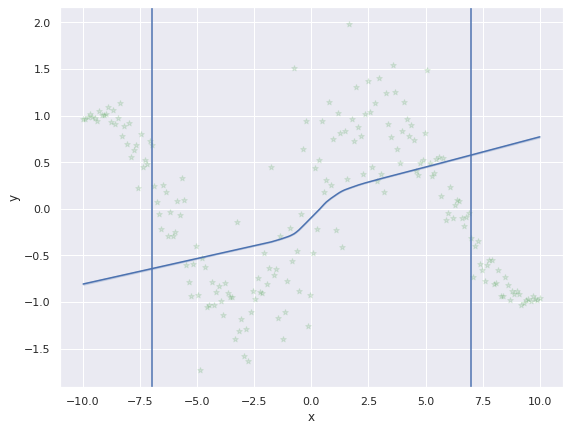

Epoch : 0 | batch train loss: 1.1585873365402222 | test loss: 1.4877747297286987


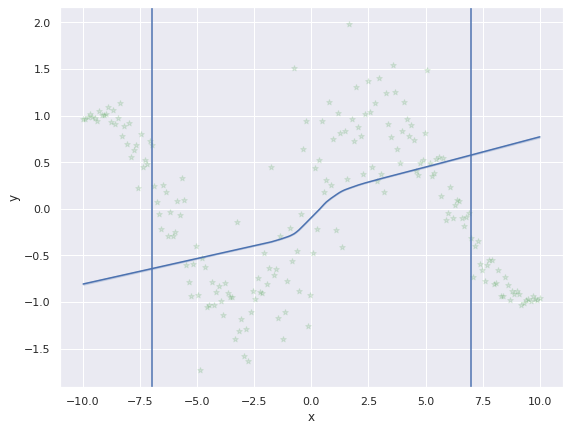

Epoch : 0 | batch train loss: 1.507298469543457 | test loss: 1.494282643000285


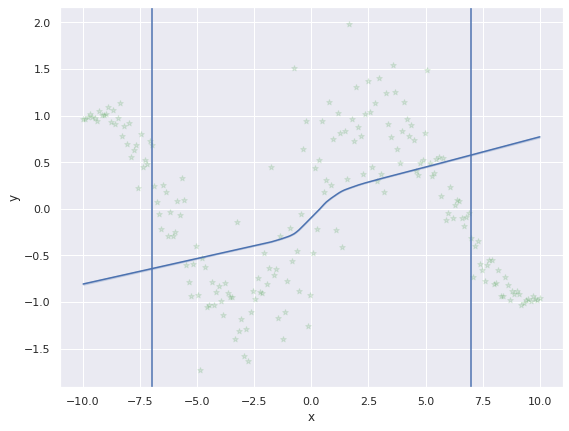

Epoch : 0 | batch train loss: 0.8590547442436218 | test loss: 1.335475668311119


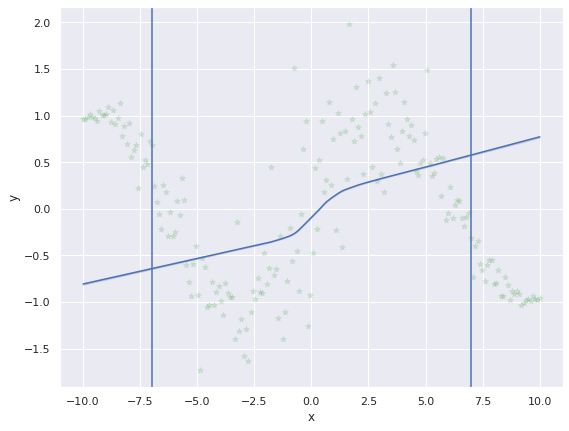

Epoch : 0 | batch train loss: 1.3191227912902832 | test loss: 1.332205092906952


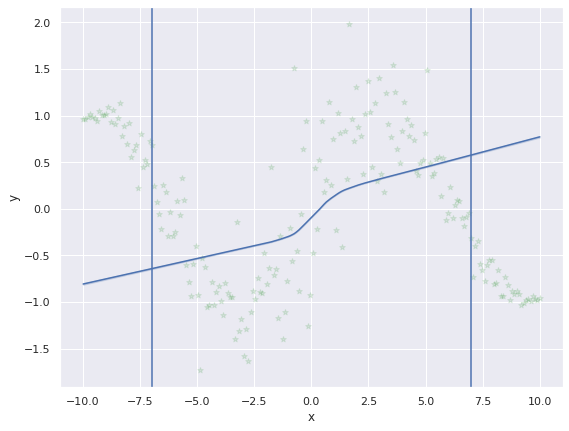

Epoch : 0 | batch train loss: 1.3256193399429321 | test loss: 1.3311074674129486


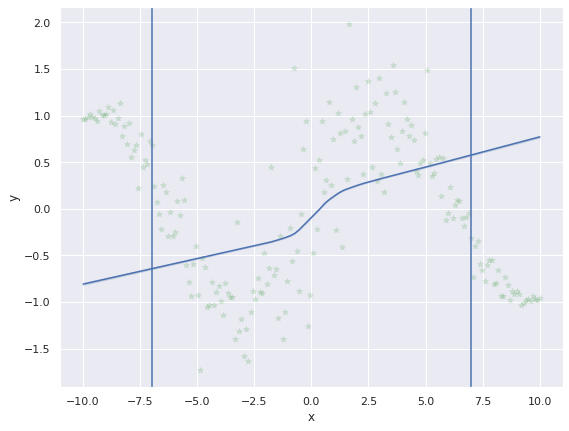

Epoch : 0 | batch train loss: 1.547371745109558 | test loss: 1.36200236422675


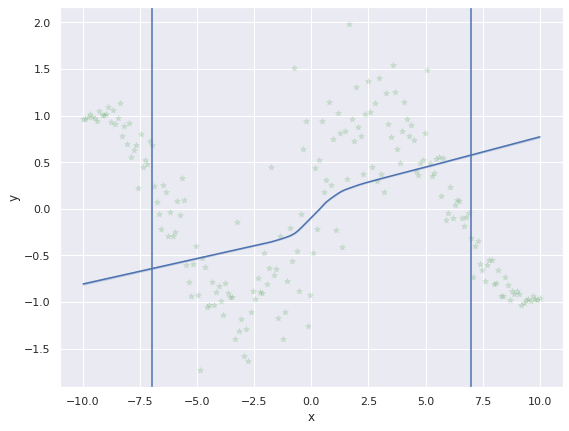

Epoch : 0 | batch train loss: 1.339419960975647 | test loss: 1.359179563820362


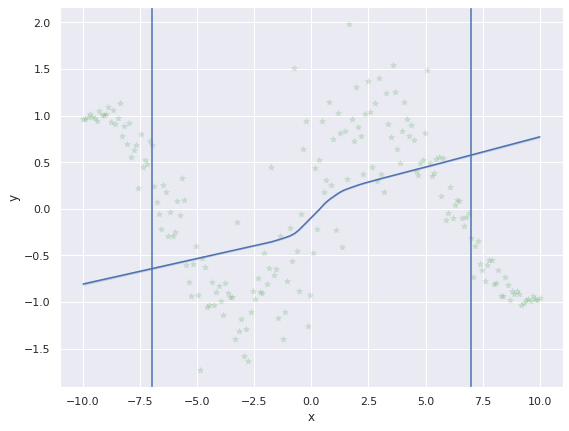

Epoch : 0 | batch train loss: 2.073457956314087 | test loss: 1.4385438296529982


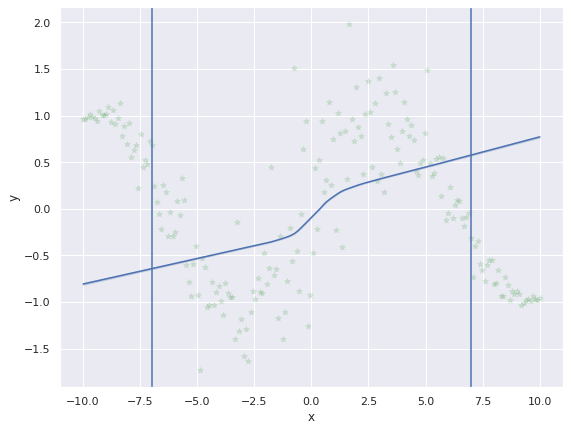

Epoch : 0 | batch train loss: 1.3051080703735352 | test loss: 1.4252002537250519


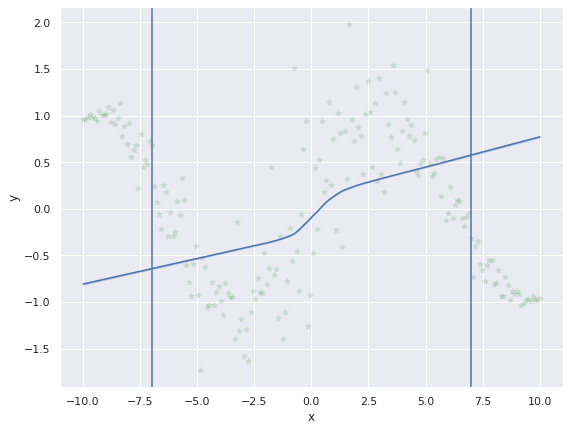

Epoch : 0 | batch train loss: 1.3113163709640503 | test loss: 1.4148471734740518


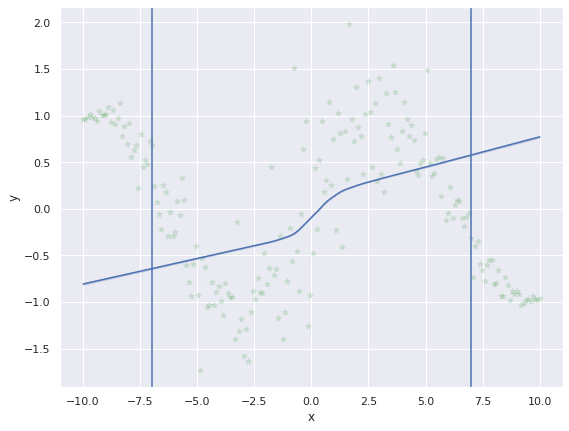

Epoch : 0 | batch train loss: 1.2651731967926025 | test loss: 1.402374342083931


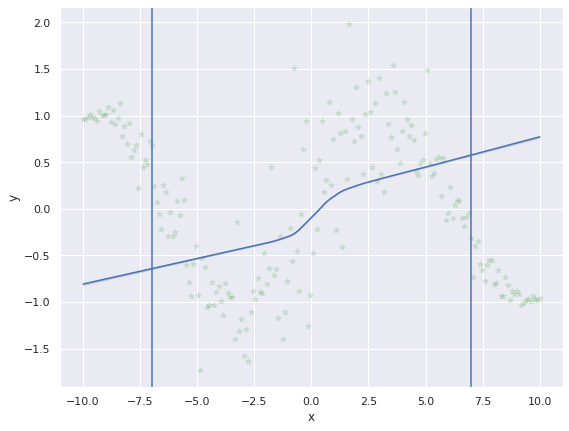

Epoch : 0 | batch train loss: 0.5456066727638245 | test loss: 1.336469136751615


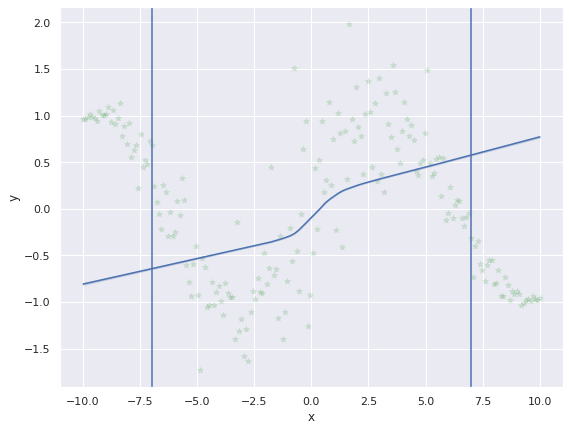

Epoch : 10 | batch train loss: 0.5451385974884033 | test loss: 0.5451385974884033


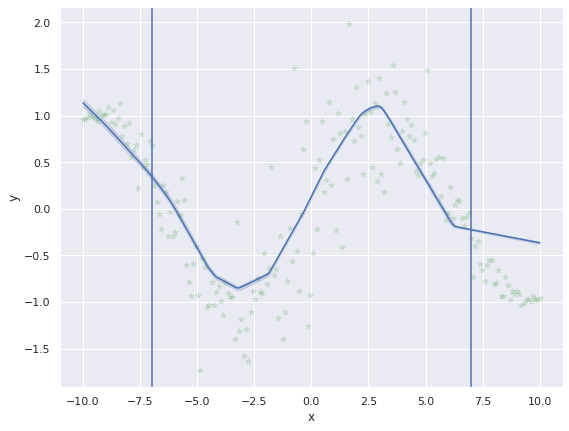

Epoch : 10 | batch train loss: 0.42798230051994324 | test loss: 0.4865604490041733


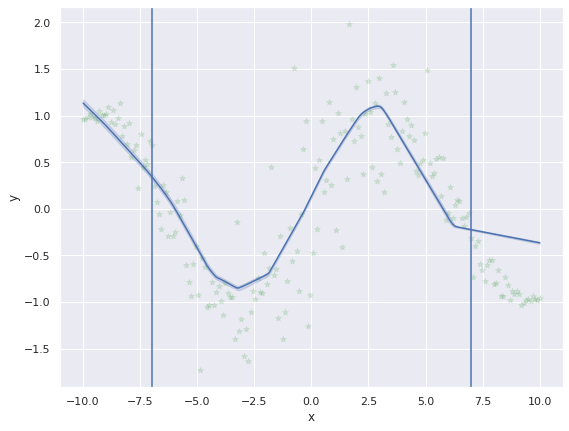

Epoch : 10 | batch train loss: 0.4895879328250885 | test loss: 0.4875696102778117


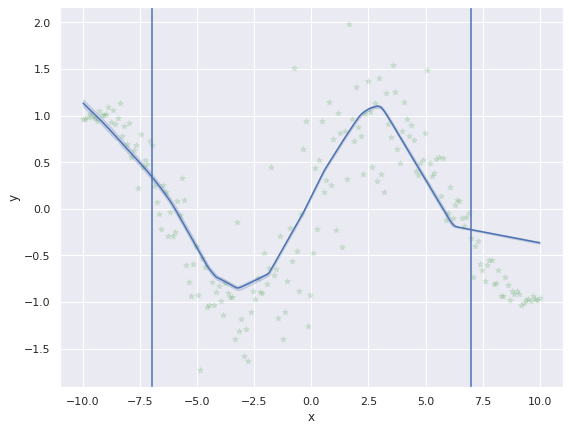

Epoch : 10 | batch train loss: 0.36530402302742004 | test loss: 0.4570032134652138


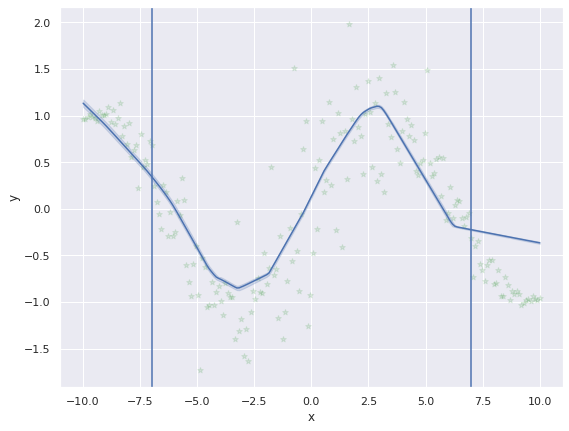

Epoch : 10 | batch train loss: 0.4098721444606781 | test loss: 0.44757699966430664


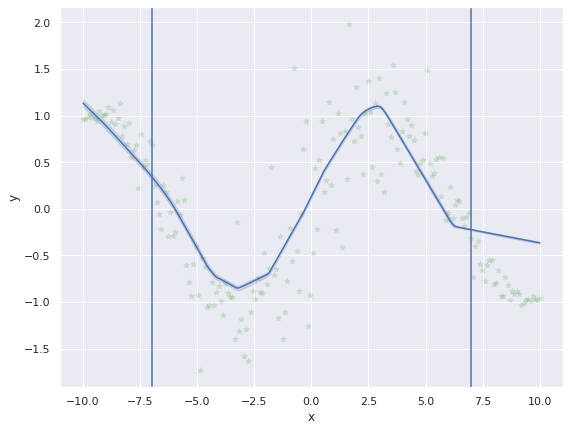

Epoch : 10 | batch train loss: 0.48936524987220764 | test loss: 0.45454170803229016


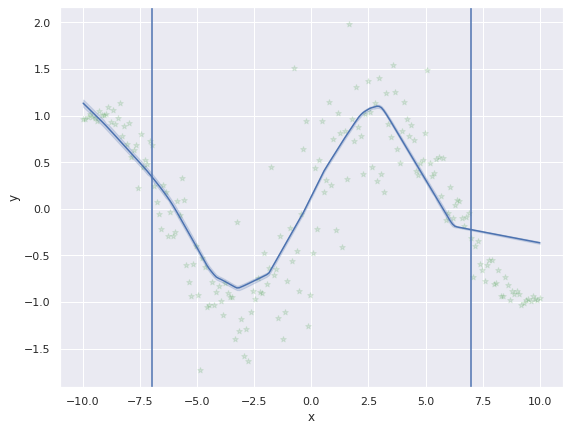

Epoch : 10 | batch train loss: 0.3772602081298828 | test loss: 0.4435014937605177


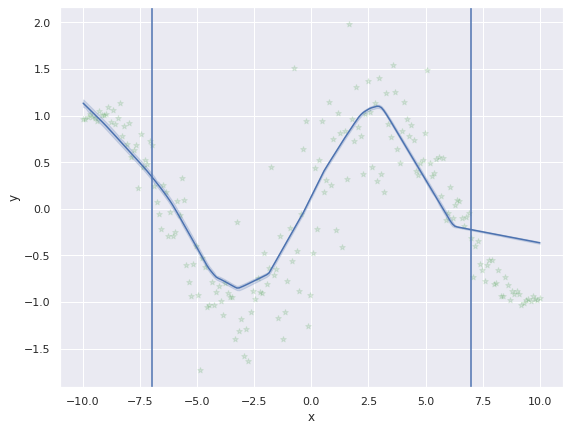

Epoch : 10 | batch train loss: 0.4001496136188507 | test loss: 0.4380825087428093


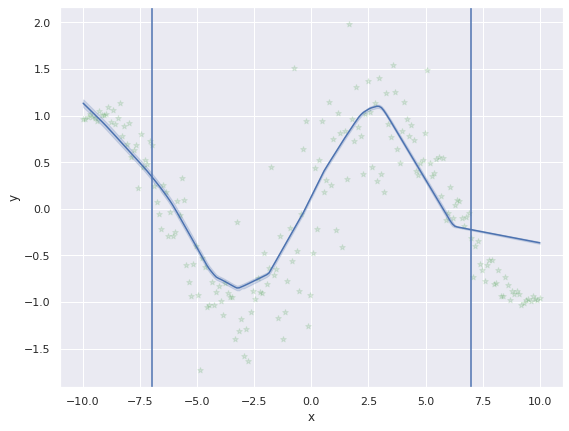

Epoch : 10 | batch train loss: 0.5680503249168396 | test loss: 0.4525233772065904


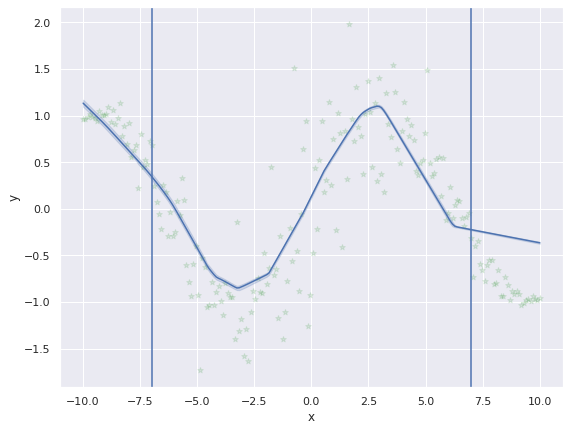

Epoch : 10 | batch train loss: 0.4692894220352173 | test loss: 0.45419998168945314


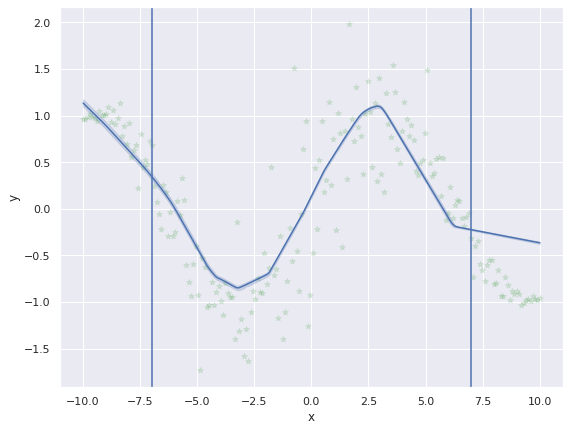

Epoch : 10 | batch train loss: 0.625885009765625 | test loss: 0.46980771151455963


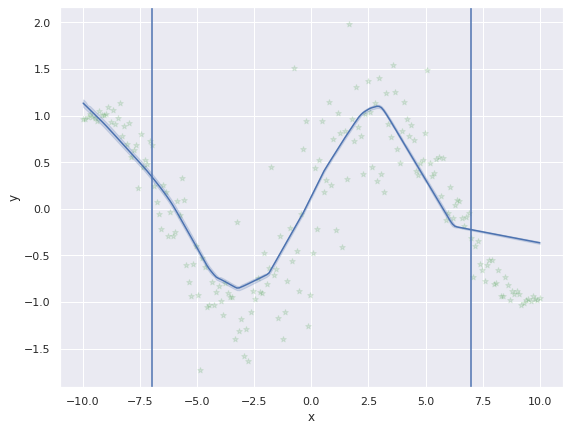

Epoch : 10 | batch train loss: 0.4327959716320038 | test loss: 0.46672339985768


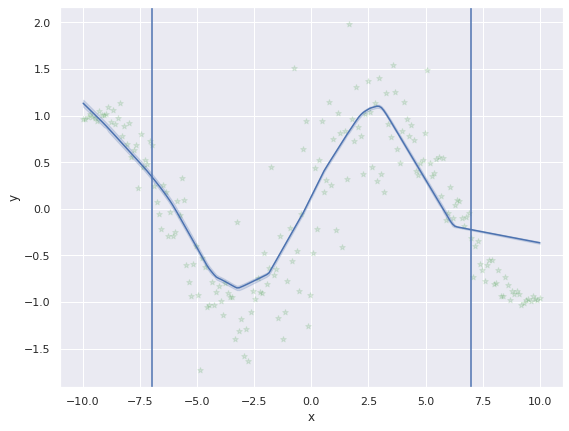

Epoch : 10 | batch train loss: 0.5703083276748657 | test loss: 0.47469147122823274


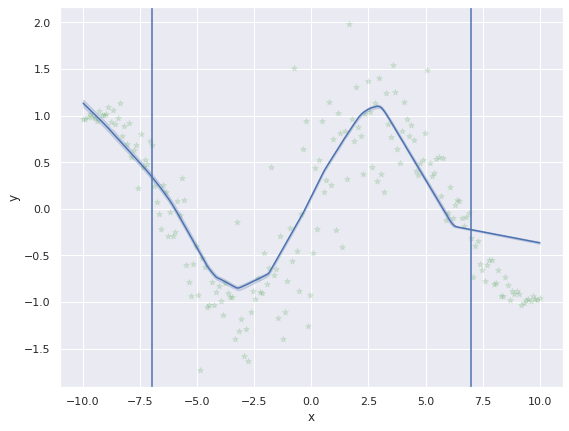

Epoch : 20 | batch train loss: 0.35173895955085754 | test loss: 0.35173895955085754


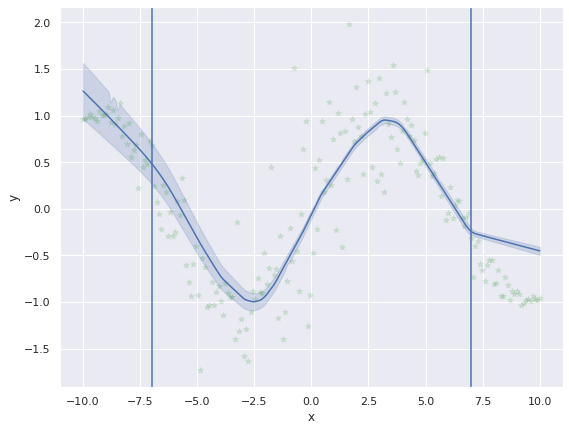

Epoch : 20 | batch train loss: 0.32736849784851074 | test loss: 0.33955372869968414


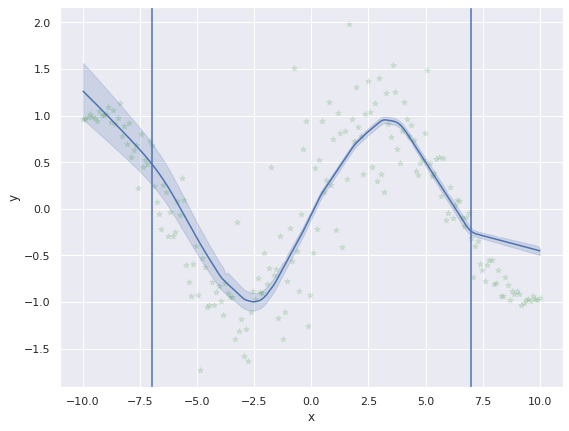

Epoch : 20 | batch train loss: 0.30027860403060913 | test loss: 0.3264620204766591


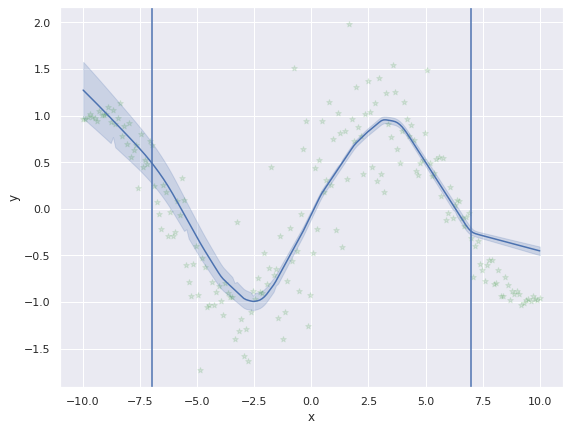

Epoch : 20 | batch train loss: 0.27336665987968445 | test loss: 0.31318818032741547


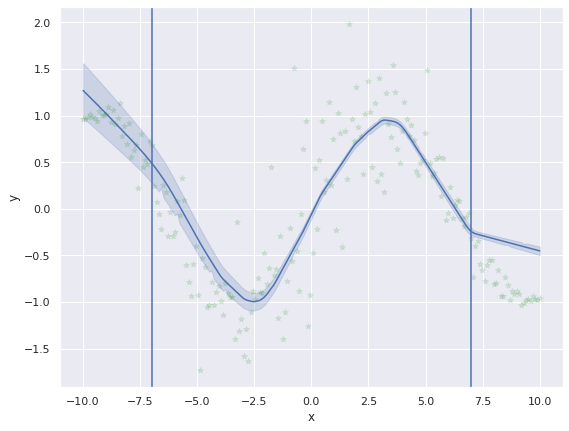

Epoch : 20 | batch train loss: 0.4227149486541748 | test loss: 0.3350935339927673


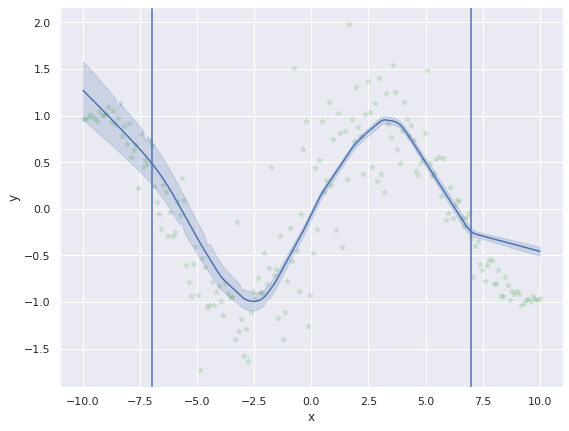

Epoch : 20 | batch train loss: 0.3372645378112793 | test loss: 0.33545536796251935


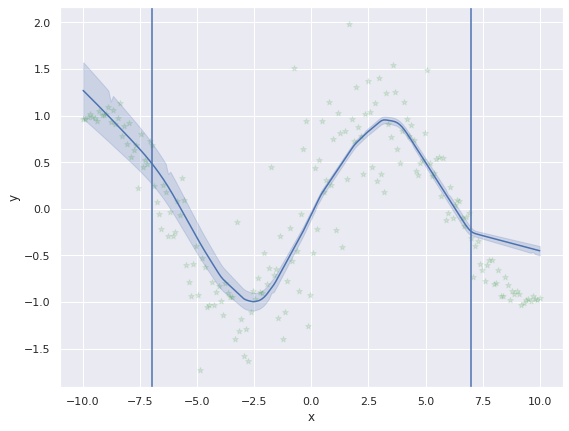

Epoch : 20 | batch train loss: 0.4890221357345581 | test loss: 0.3573934776442392


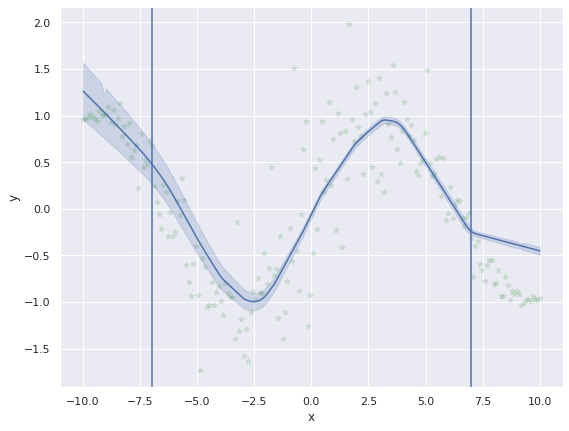

Epoch : 20 | batch train loss: 0.49274742603302 | test loss: 0.37431272119283676


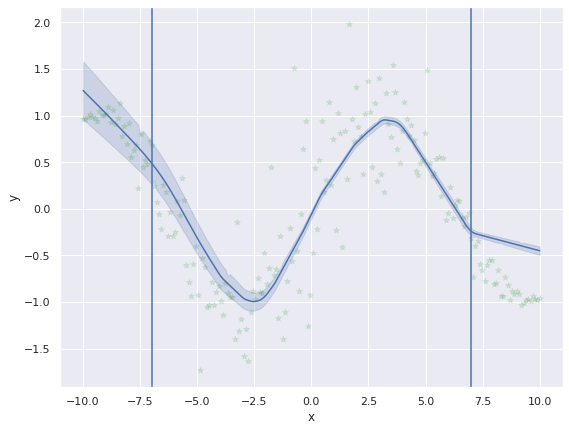

Epoch : 20 | batch train loss: 0.29858946800231934 | test loss: 0.3658990263938904


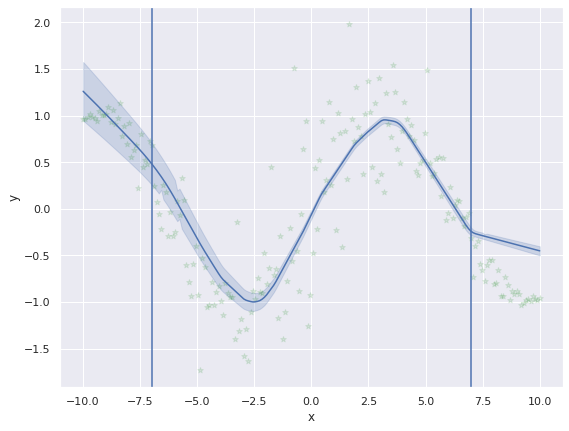

Epoch : 20 | batch train loss: 0.3342006206512451 | test loss: 0.3627291858196259


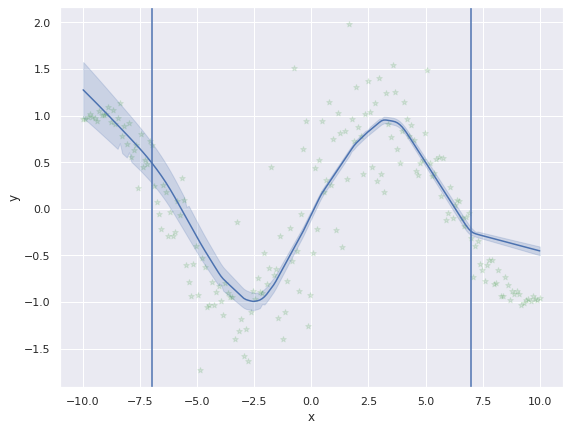

Epoch : 20 | batch train loss: 0.35114845633506775 | test loss: 0.36167639223012055


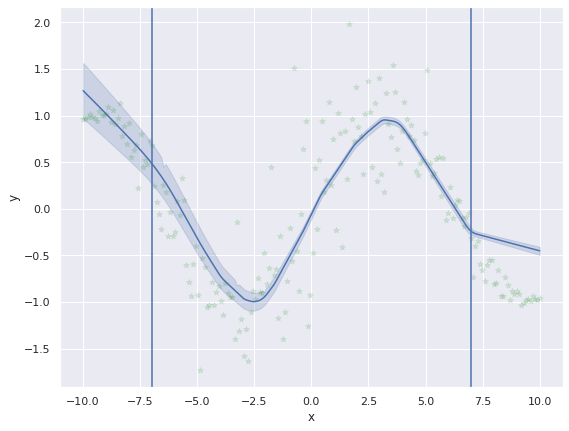

Epoch : 20 | batch train loss: 0.3316403329372406 | test loss: 0.35917338728904724


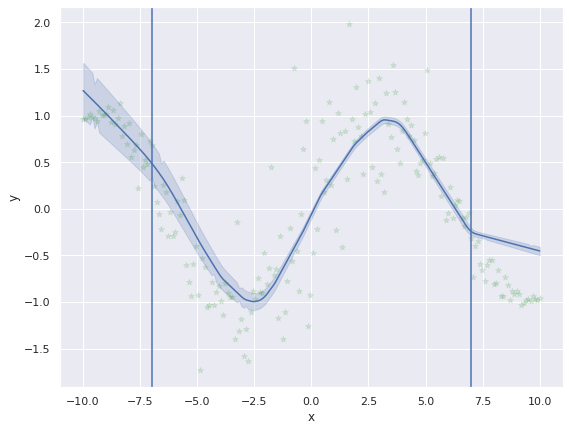

Epoch : 20 | batch train loss: 0.8050451874732971 | test loss: 0.39347121807245106


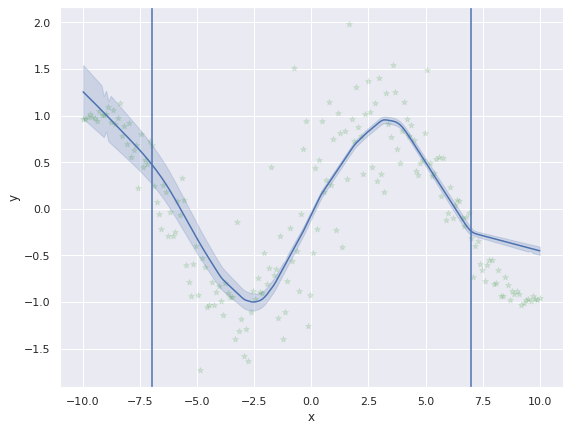

Epoch : 30 | batch train loss: 0.3233277499675751 | test loss: 0.3233277499675751


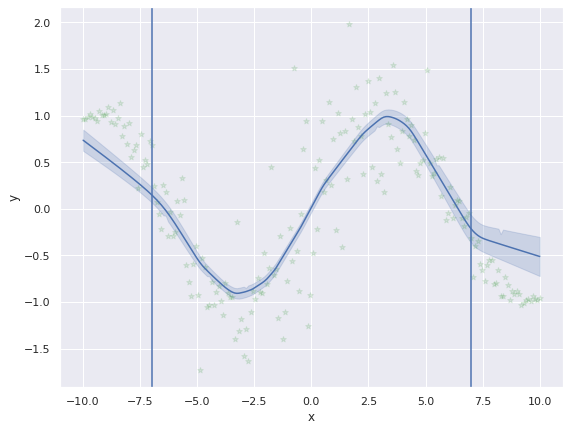

Epoch : 30 | batch train loss: 0.26127251982688904 | test loss: 0.29230013489723206


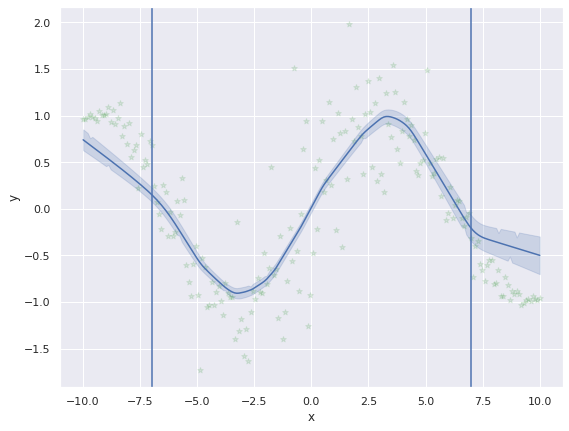

Epoch : 30 | batch train loss: 0.43565869331359863 | test loss: 0.34008632103602093


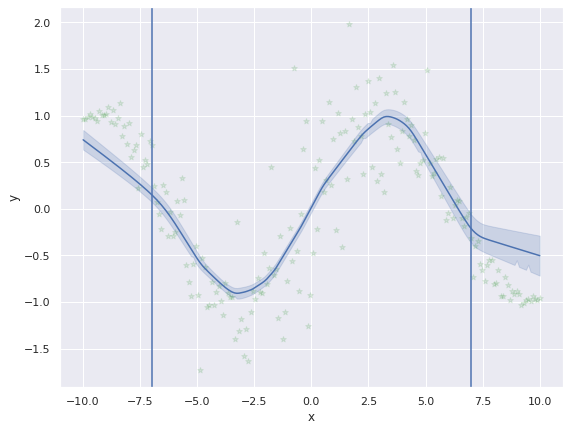

Epoch : 30 | batch train loss: 0.2948358952999115 | test loss: 0.32877371460199356


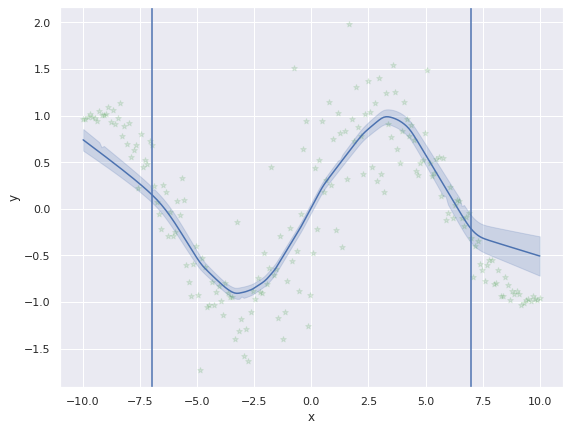

Epoch : 30 | batch train loss: 0.41153672337532043 | test loss: 0.34532631635665895


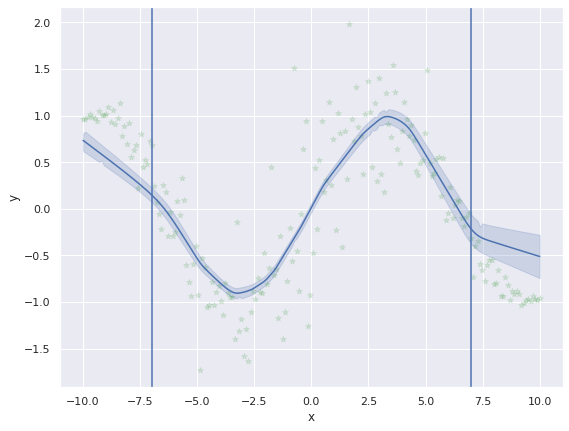

Epoch : 30 | batch train loss: 0.2931526303291321 | test loss: 0.3366307020187378


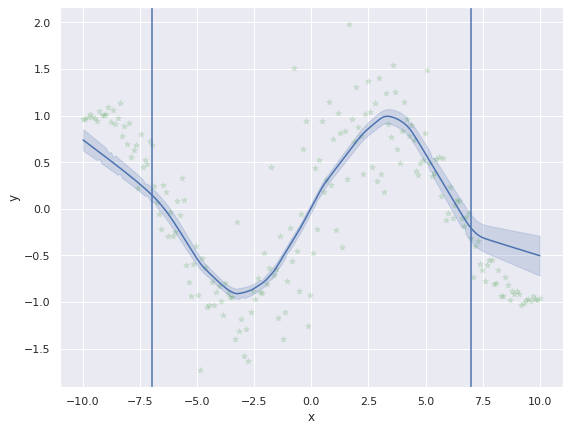

Epoch : 30 | batch train loss: 0.263071209192276 | test loss: 0.32612220304352896


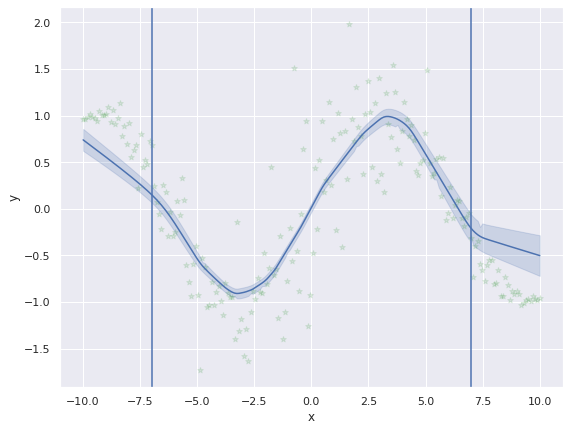

Epoch : 30 | batch train loss: 0.2717725336551666 | test loss: 0.3193284943699837


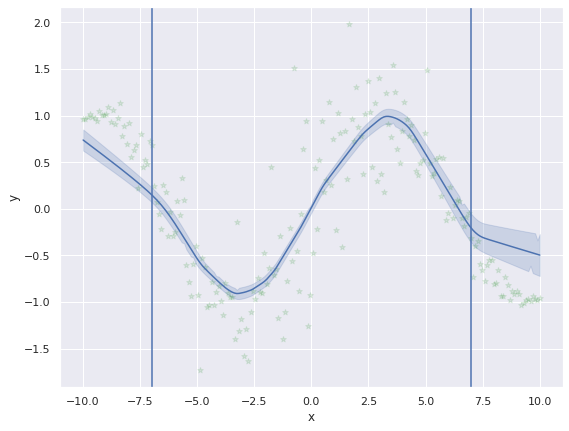

Epoch : 30 | batch train loss: 0.2590464651584625 | test loss: 0.3126304911242591


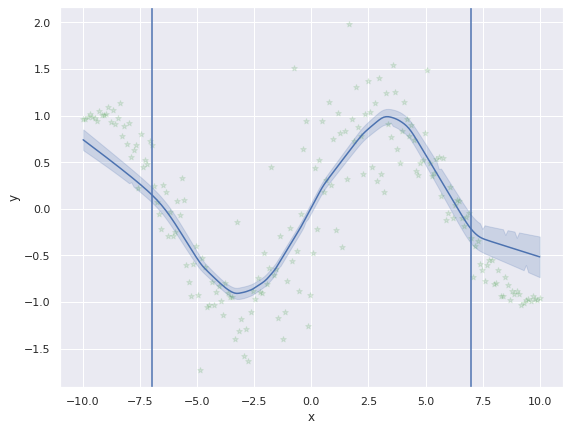

Epoch : 30 | batch train loss: 0.32817742228507996 | test loss: 0.3141851842403412


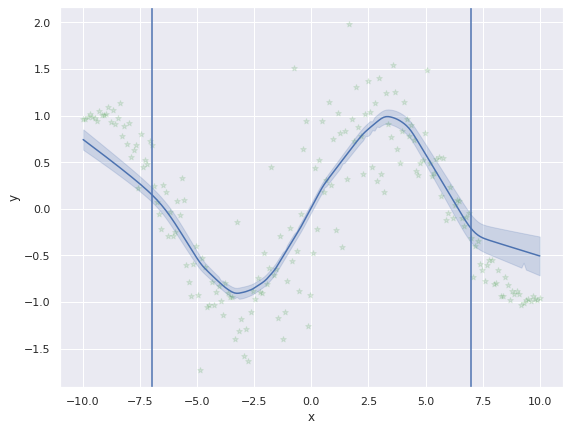

Epoch : 30 | batch train loss: 0.29390308260917664 | test loss: 0.31234135681932623


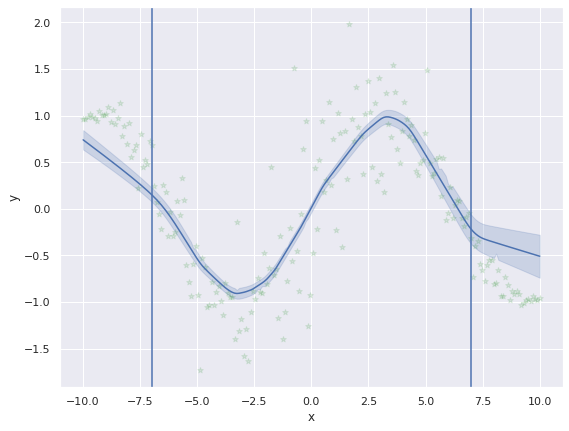

Epoch : 30 | batch train loss: 0.2867431938648224 | test loss: 0.31020817657311756


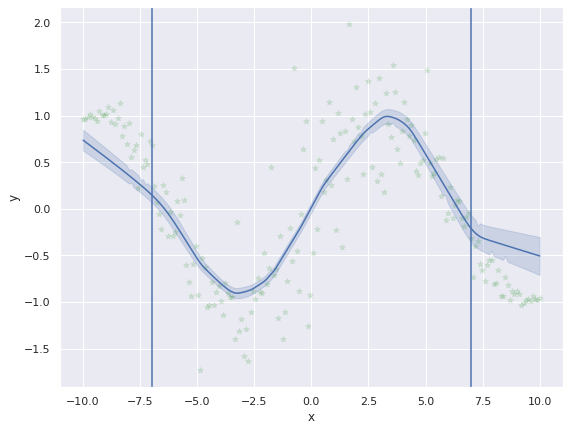

Epoch : 30 | batch train loss: 0.4184841215610504 | test loss: 0.3185370954183432


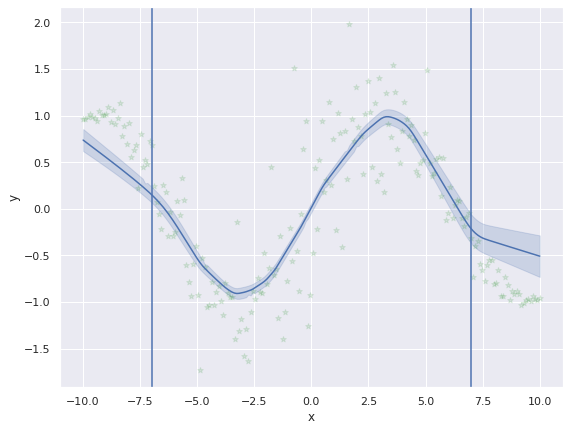

Epoch : 40 | batch train loss: 0.22690315544605255 | test loss: 0.22690315544605255


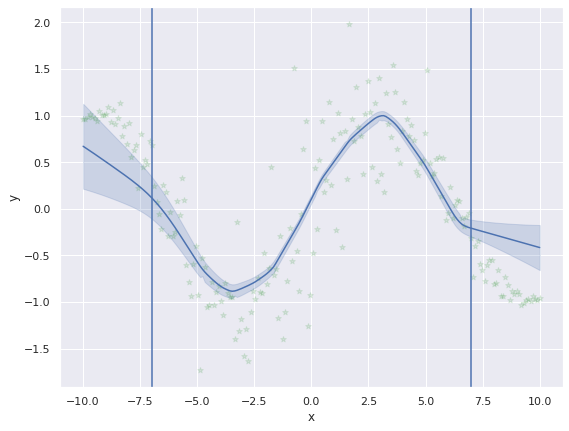

Epoch : 40 | batch train loss: 0.4051162898540497 | test loss: 0.3160097226500511


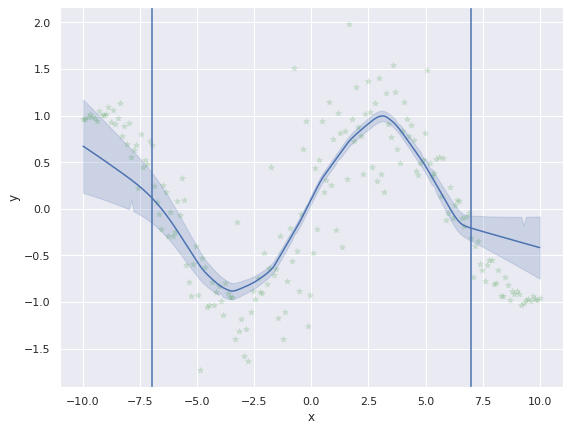

Epoch : 40 | batch train loss: 0.41385820508003235 | test loss: 0.34862588346004486


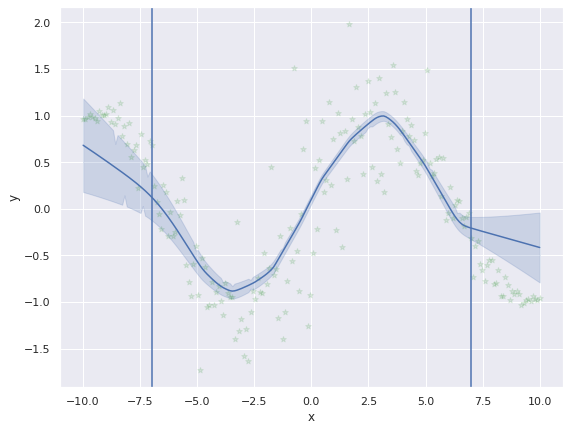

Epoch : 40 | batch train loss: 0.2688959538936615 | test loss: 0.328693401068449


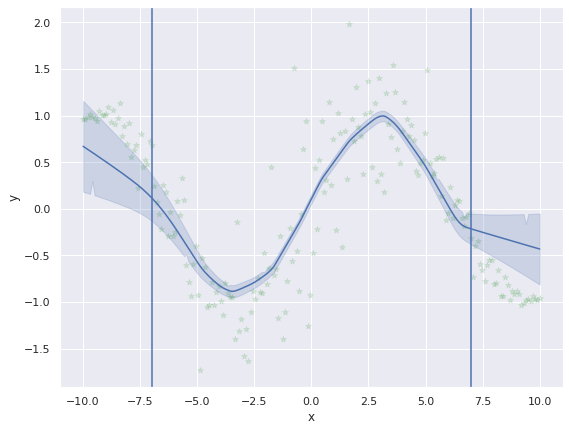

Epoch : 40 | batch train loss: 0.3123578131198883 | test loss: 0.32542628347873687


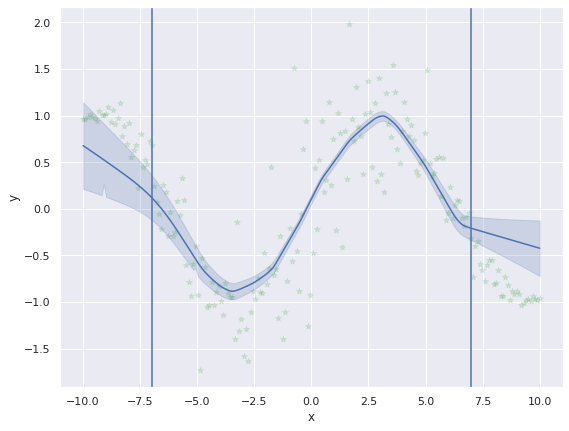

Epoch : 40 | batch train loss: 0.40918776392936707 | test loss: 0.3393865302205086


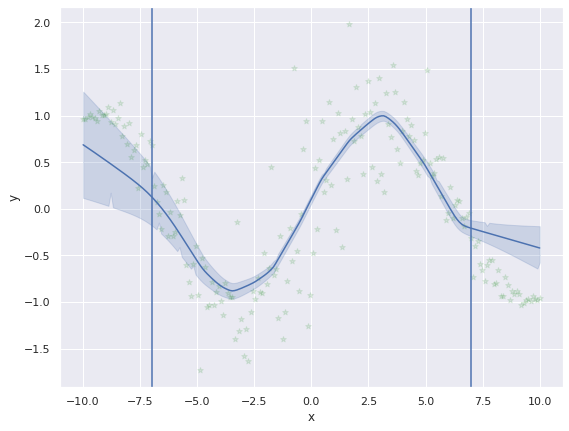

Epoch : 40 | batch train loss: 0.24205803871154785 | test loss: 0.32548246000494274


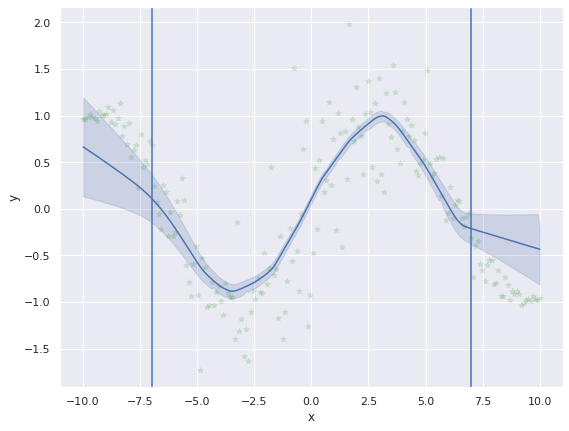

Epoch : 40 | batch train loss: 0.39054498076438904 | test loss: 0.33361527509987354


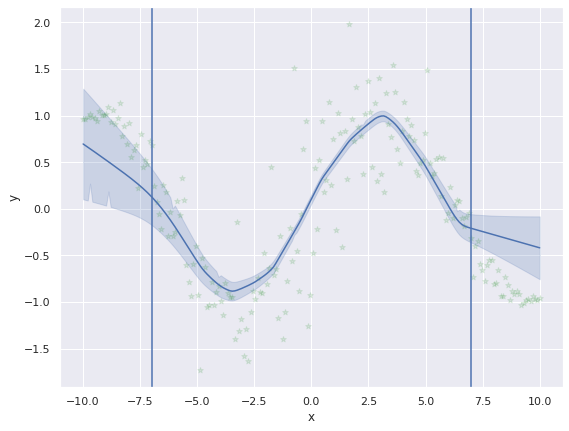

Epoch : 40 | batch train loss: 0.2373715192079544 | test loss: 0.3229215244452159


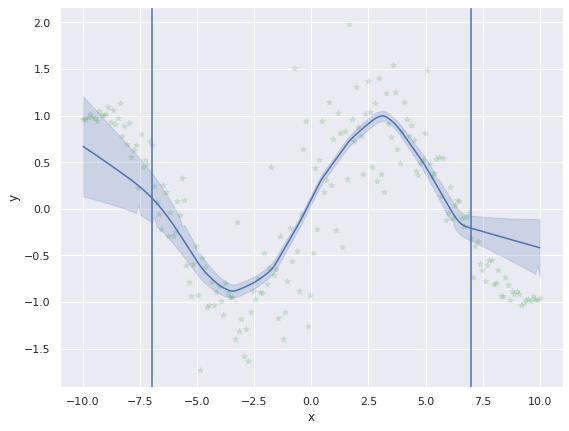

Epoch : 40 | batch train loss: 0.23211823403835297 | test loss: 0.3138411954045296


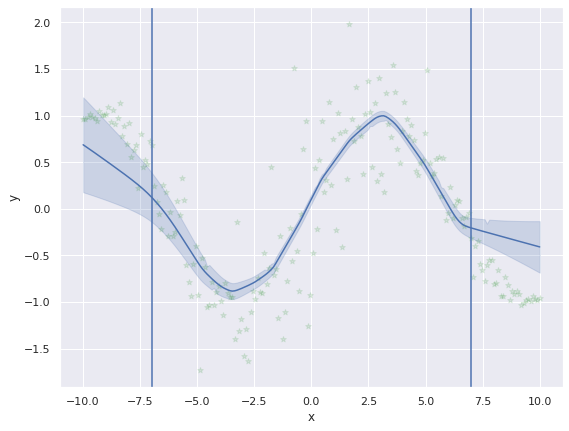

Epoch : 40 | batch train loss: 0.28996825218200684 | test loss: 0.3116709278388457


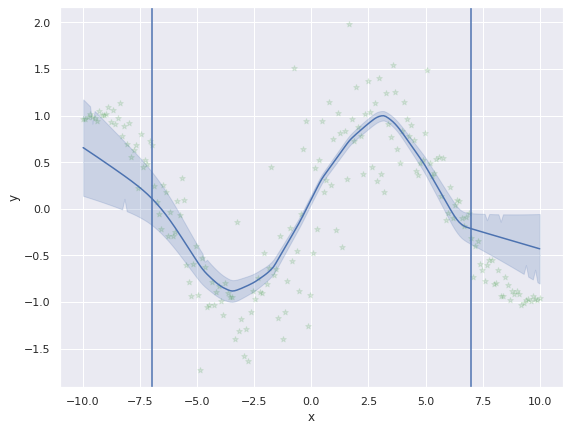

Epoch : 40 | batch train loss: 0.18136195838451385 | test loss: 0.3008118470509847


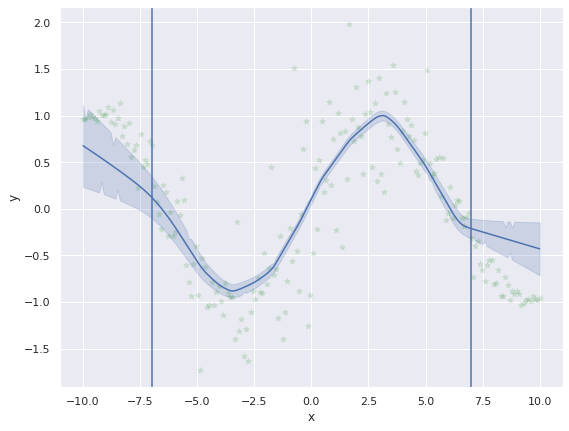

Epoch : 40 | batch train loss: 0.3185836970806122 | test loss: 0.30217891243787914


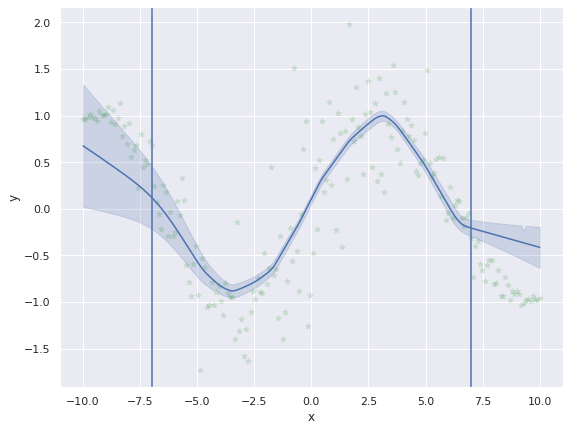

Epoch : 50 | batch train loss: 0.3507401645183563 | test loss: 0.3507401645183563


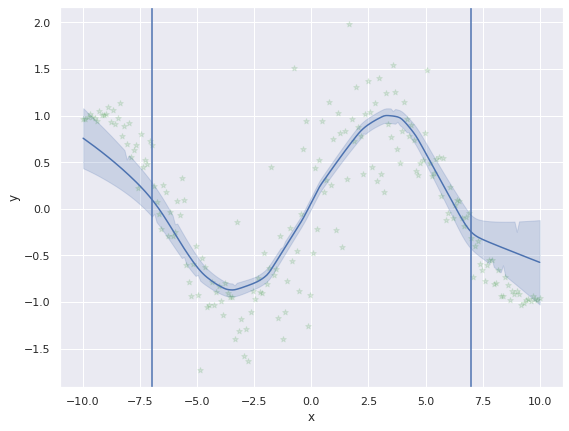

Epoch : 50 | batch train loss: 0.3310520648956299 | test loss: 0.3408961147069931


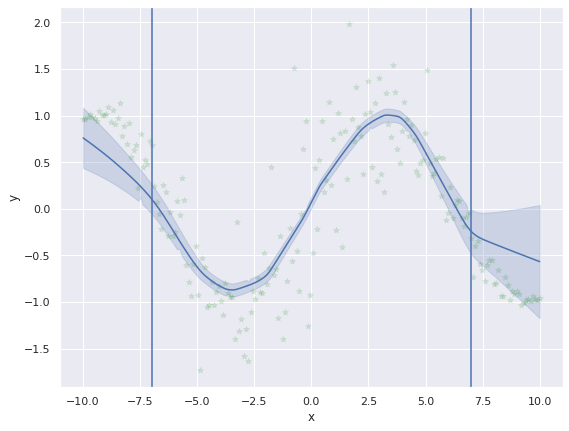

Epoch : 50 | batch train loss: 0.3747430741786957 | test loss: 0.352178434530894


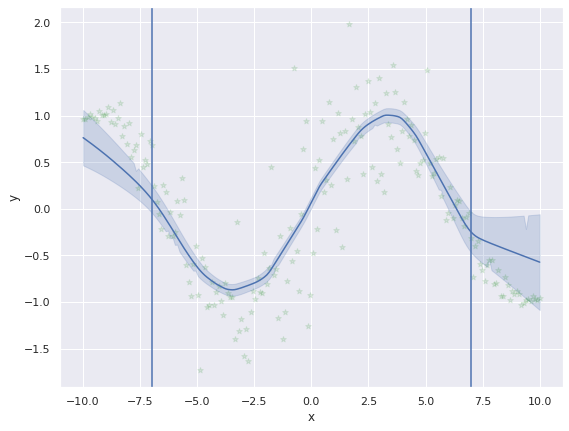

Epoch : 50 | batch train loss: 0.13330776989459991 | test loss: 0.29746076837182045


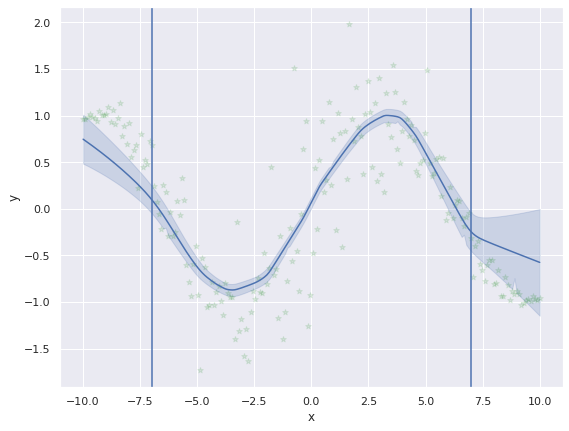

Epoch : 50 | batch train loss: 0.28023988008499146 | test loss: 0.29401659071445463


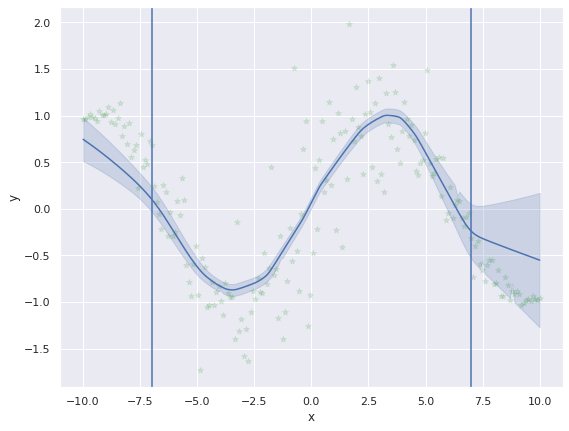

Epoch : 50 | batch train loss: 0.15466010570526123 | test loss: 0.2707905098795891


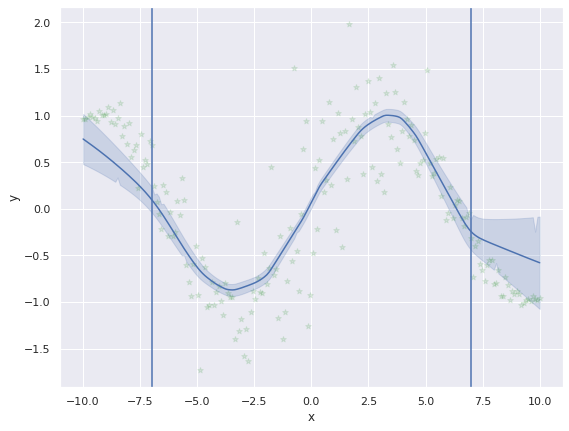

Epoch : 50 | batch train loss: 0.2625615894794464 | test loss: 0.26961494982242584


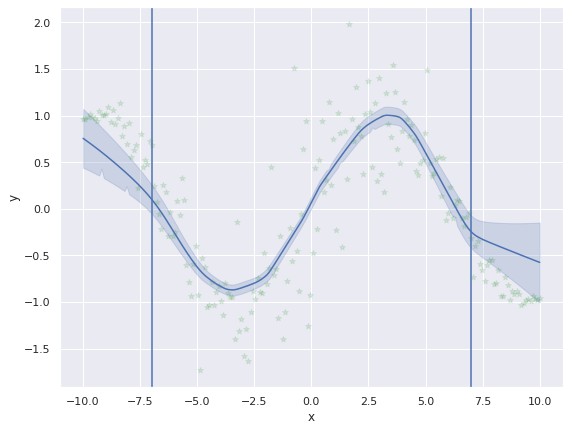

Epoch : 50 | batch train loss: 0.2321975976228714 | test loss: 0.26493778079748154


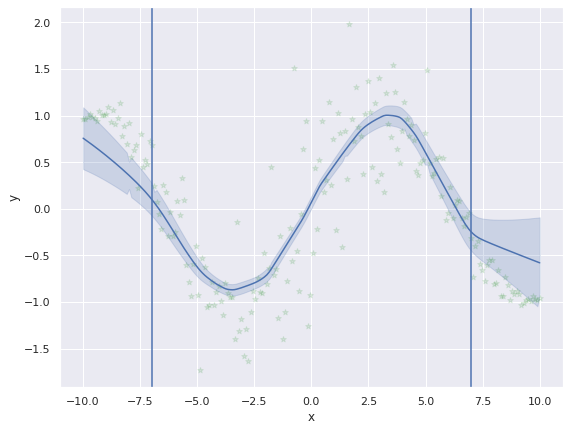

Epoch : 50 | batch train loss: 0.2640511393547058 | test loss: 0.2648392650816176


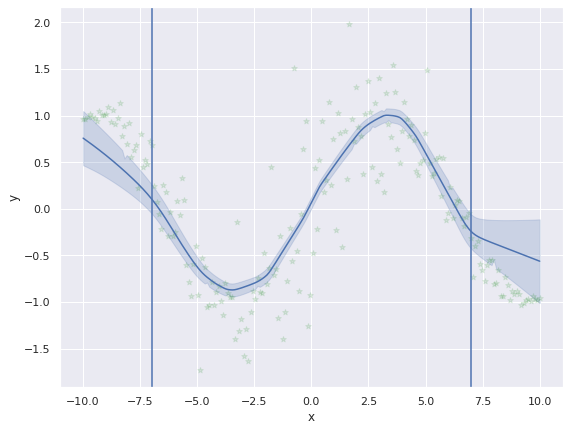

Epoch : 50 | batch train loss: 0.26032936573028564 | test loss: 0.2643882751464844


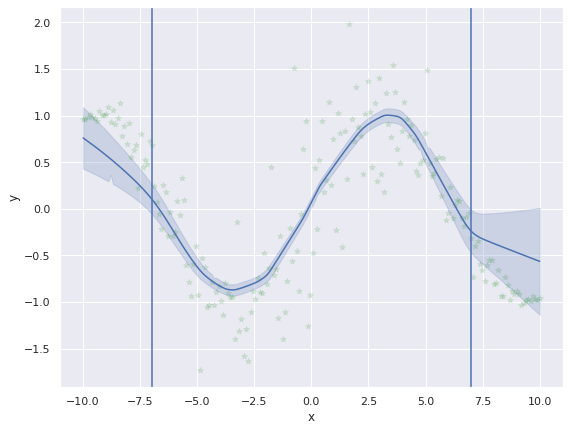

Epoch : 50 | batch train loss: 0.28402265906333923 | test loss: 0.2661732191389257


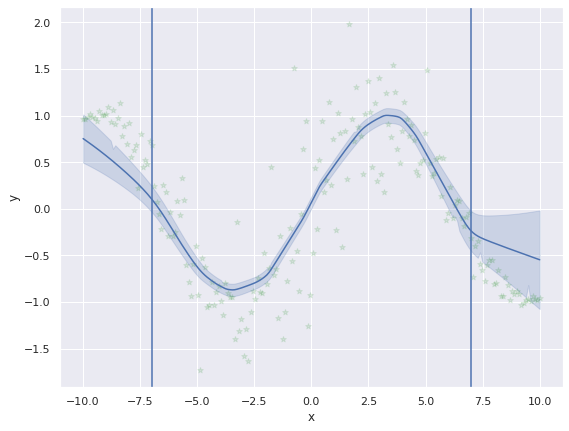

Epoch : 50 | batch train loss: 0.32340002059936523 | test loss: 0.270942119260629


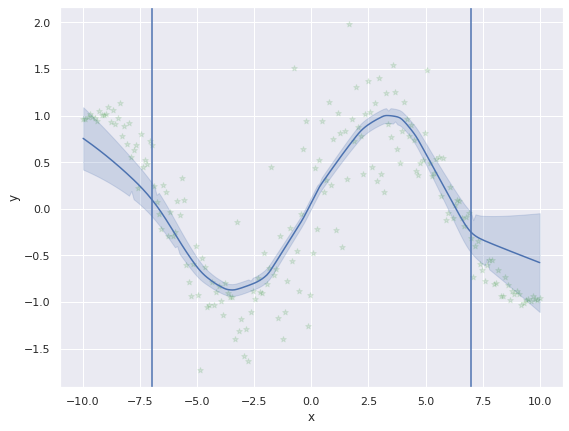

Epoch : 50 | batch train loss: 0.26736167073249817 | test loss: 0.2706667001430805


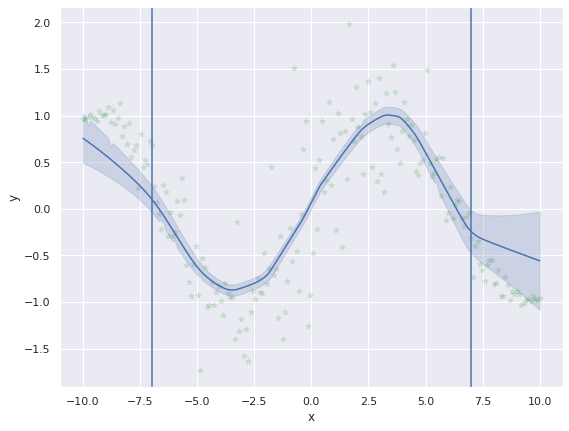

Epoch : 60 | batch train loss: 0.23309947550296783 | test loss: 0.23309947550296783


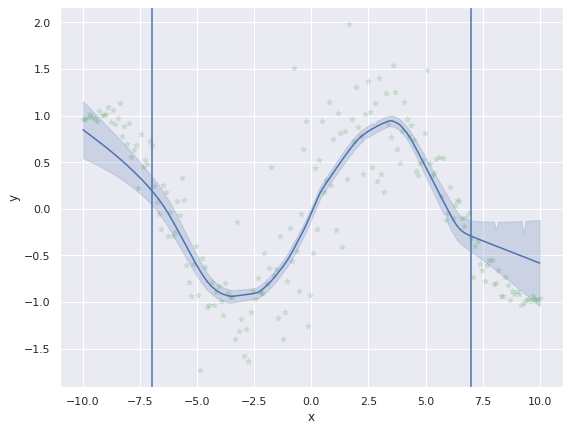

Epoch : 60 | batch train loss: 0.13096140325069427 | test loss: 0.18203043937683105


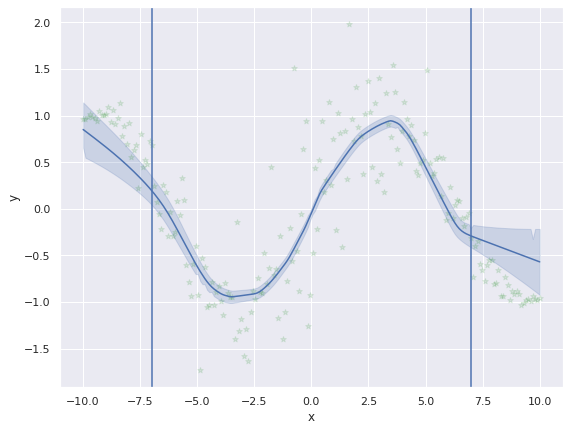

Epoch : 60 | batch train loss: 0.24420368671417236 | test loss: 0.20275485515594482


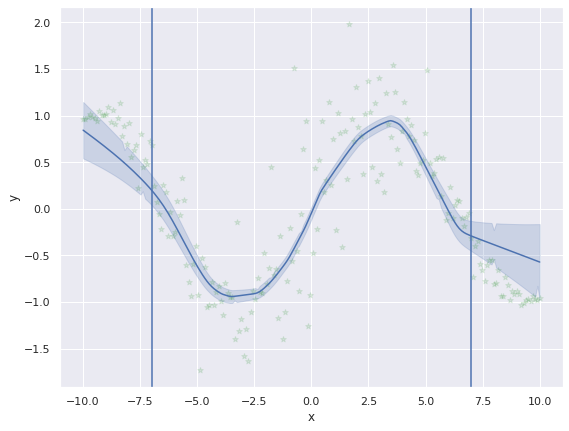

Epoch : 60 | batch train loss: 0.15747933089733124 | test loss: 0.19143597409129143


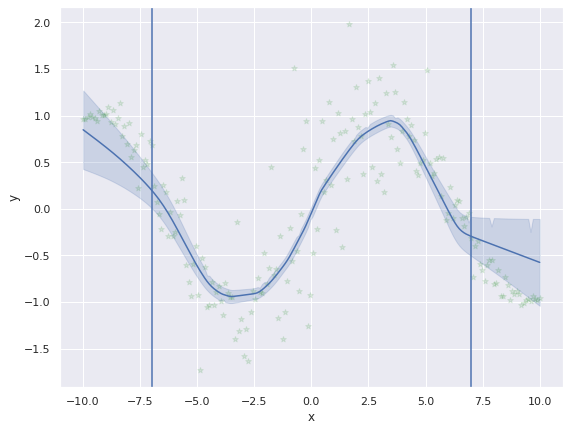

Epoch : 60 | batch train loss: 0.17760716378688812 | test loss: 0.18867021203041076


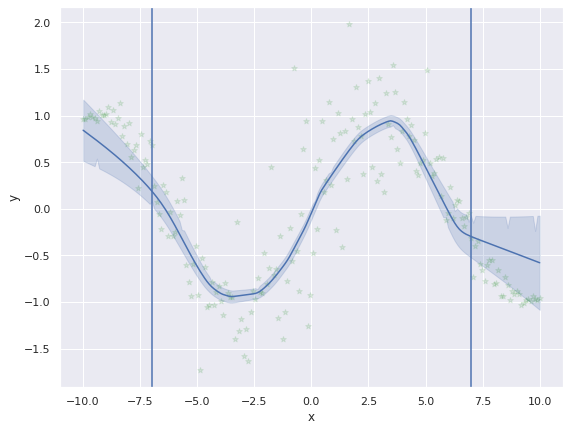

Epoch : 60 | batch train loss: 0.34902670979499817 | test loss: 0.21539629499117532


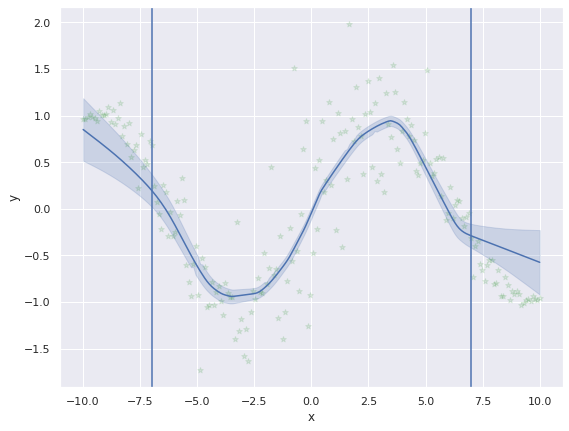

Epoch : 60 | batch train loss: 0.21414797008037567 | test loss: 0.2152179628610611


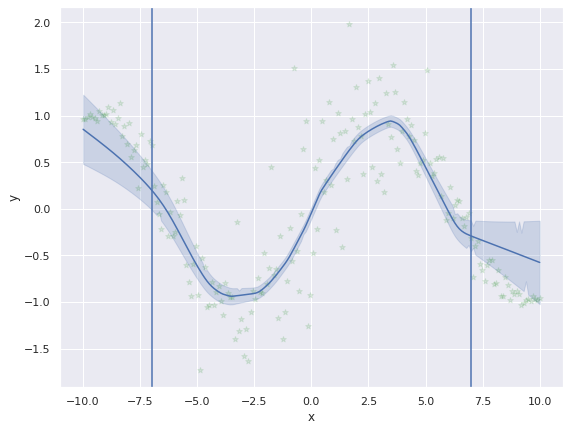

Epoch : 60 | batch train loss: 0.23389653861522675 | test loss: 0.2175527848303318


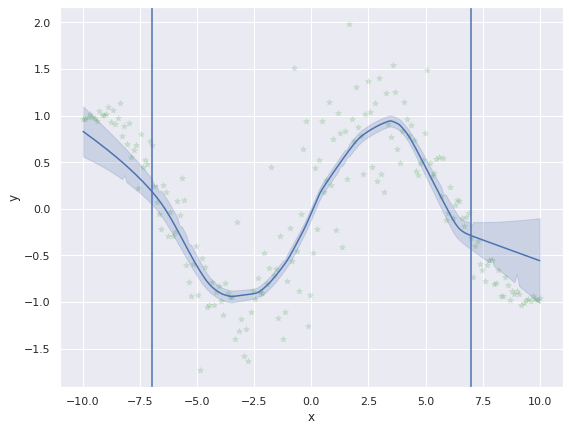

Epoch : 60 | batch train loss: 0.2834254205226898 | test loss: 0.22487196657392713


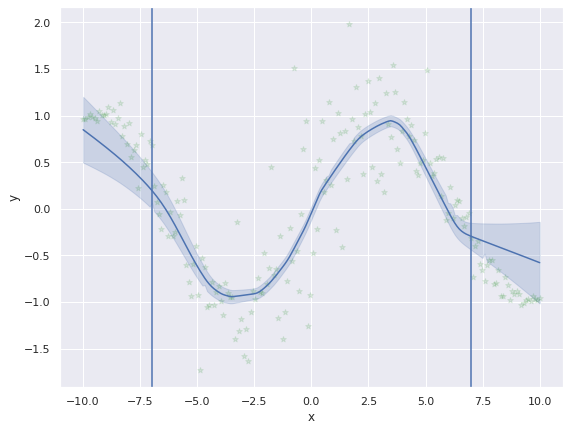

Epoch : 60 | batch train loss: 0.21310503780841827 | test loss: 0.22369527369737624


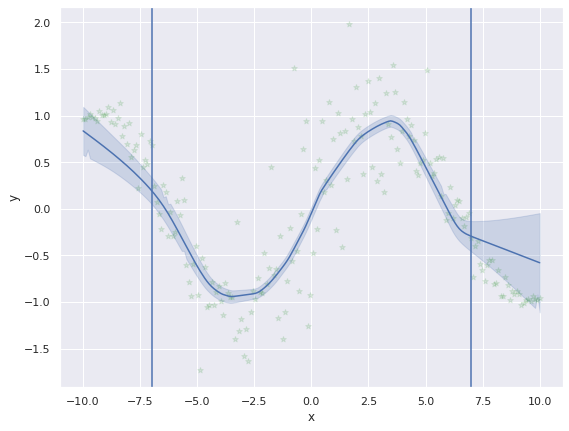

Epoch : 60 | batch train loss: 0.3328070342540741 | test loss: 0.23361452465707605


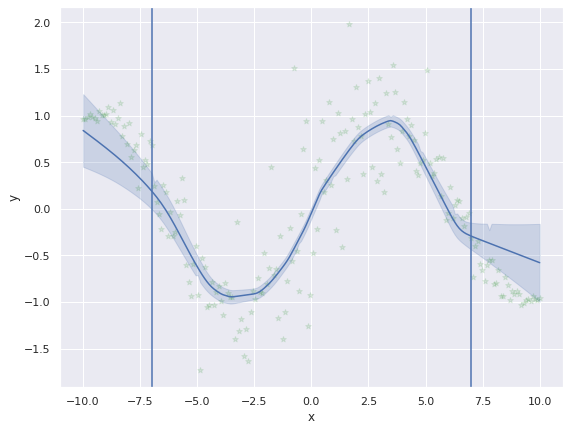

Epoch : 60 | batch train loss: 0.22502164542675018 | test loss: 0.23289845138788223


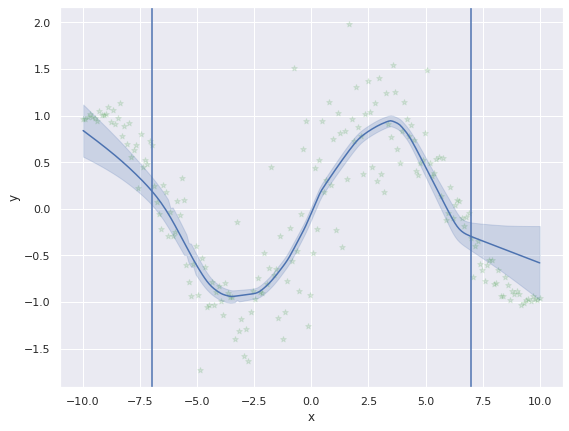

Epoch : 60 | batch train loss: 0.6383119225502014 | test loss: 0.2640841030157529


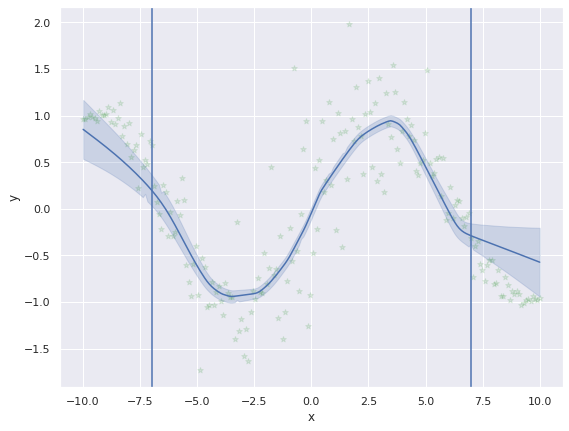

Epoch : 70 | batch train loss: 0.2621375024318695 | test loss: 0.2621375024318695


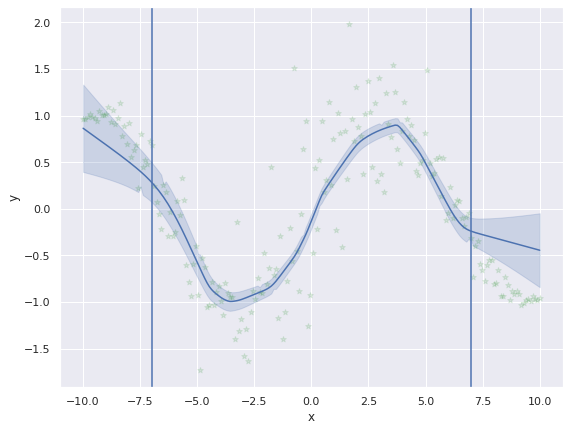

Epoch : 70 | batch train loss: 0.30436059832572937 | test loss: 0.28324905037879944


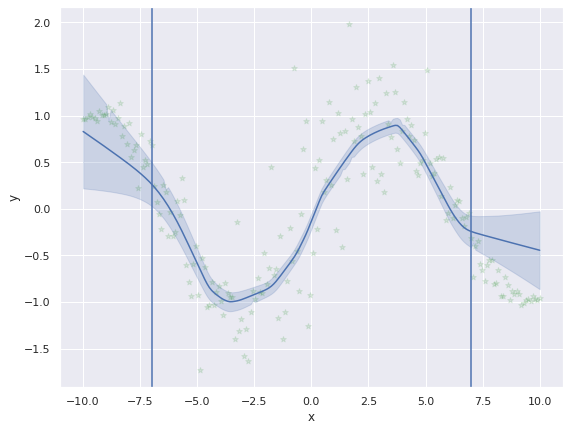

Epoch : 70 | batch train loss: 0.4001973867416382 | test loss: 0.32223182916641235


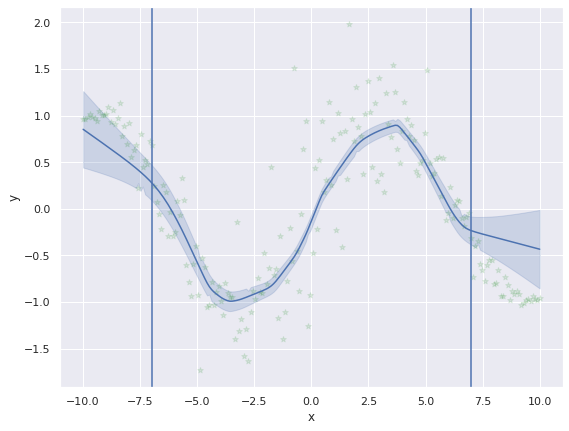

Epoch : 70 | batch train loss: 0.17128032445907593 | test loss: 0.28449395298957825


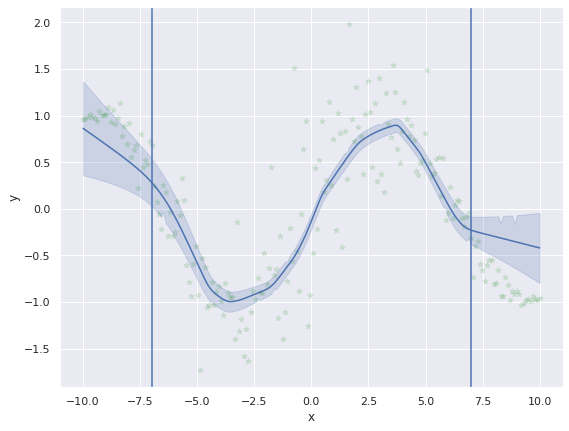

Epoch : 70 | batch train loss: 0.17911390960216522 | test loss: 0.26341794431209564


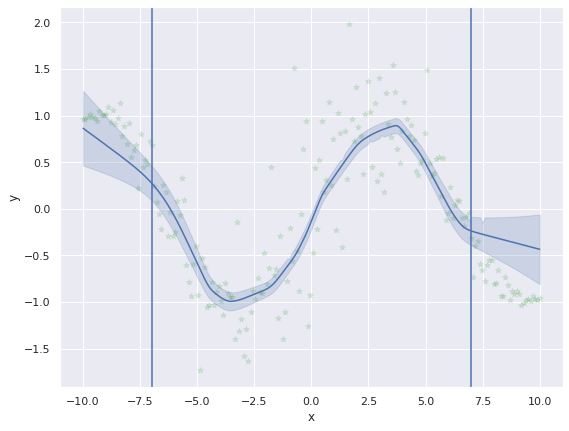

Epoch : 70 | batch train loss: 0.21707595884799957 | test loss: 0.25569428006807965


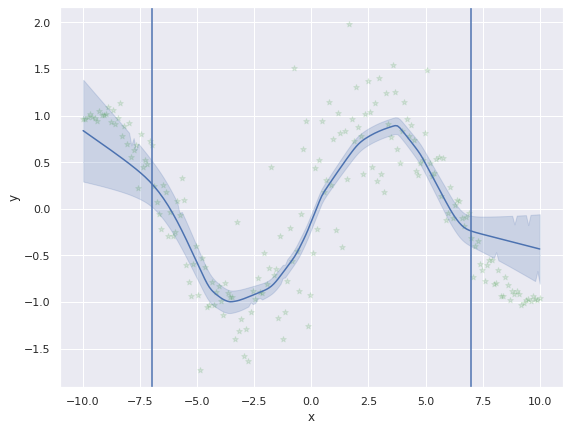

Epoch : 70 | batch train loss: 0.15515471994876862 | test loss: 0.2413314857653209


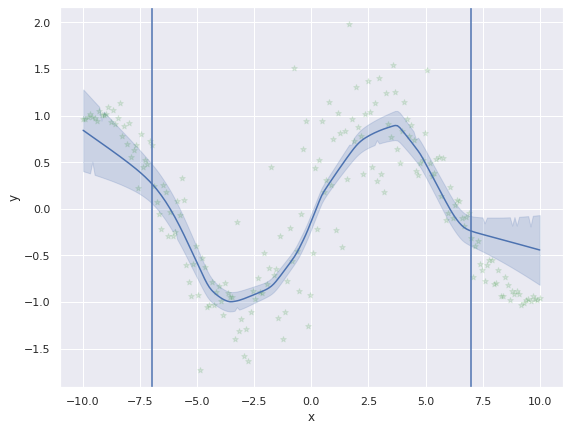

Epoch : 70 | batch train loss: 0.34907057881355286 | test loss: 0.2547988723963499


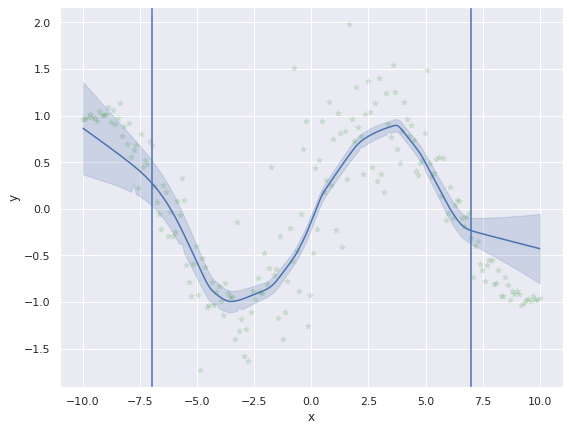

Epoch : 70 | batch train loss: 0.5919057130813599 | test loss: 0.2922551880280177


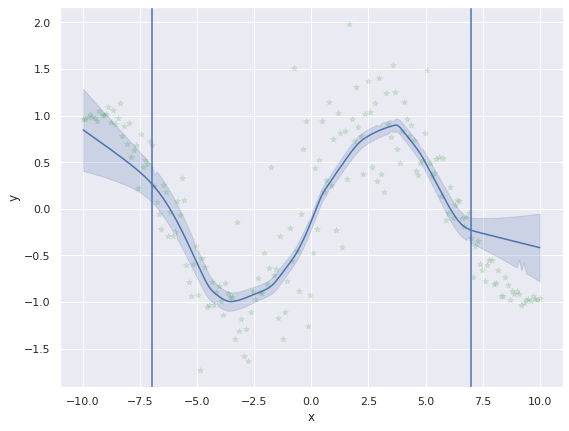

Epoch : 70 | batch train loss: 0.25918152928352356 | test loss: 0.2889478221535683


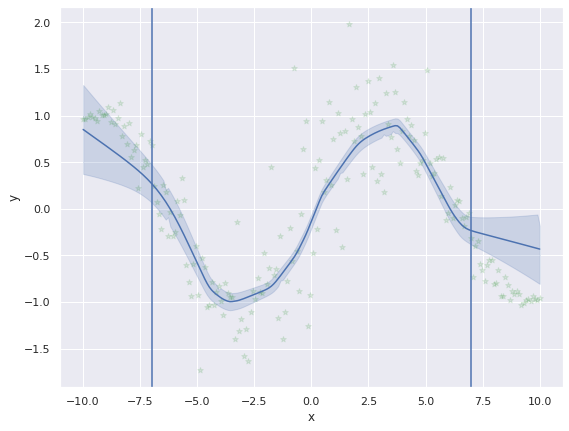

Epoch : 70 | batch train loss: 0.3997425138950348 | test loss: 0.29902006685733795


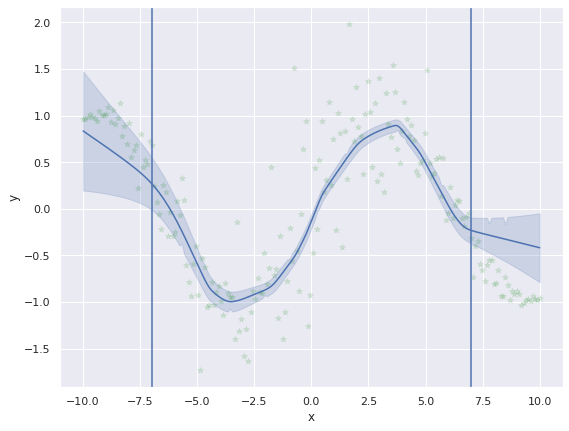

Epoch : 70 | batch train loss: 0.13553829491138458 | test loss: 0.28539658586184186


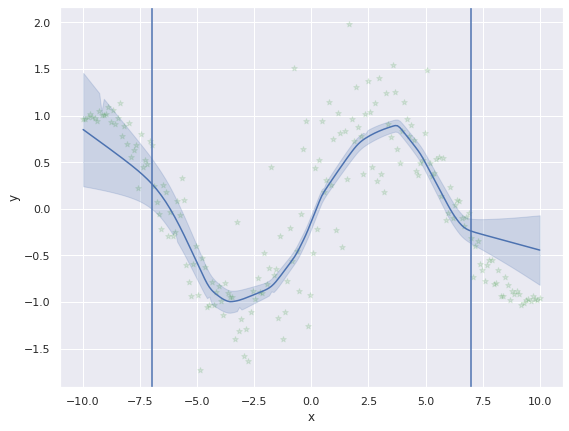

Epoch : 70 | batch train loss: 0.21836411952972412 | test loss: 0.2802402422978328


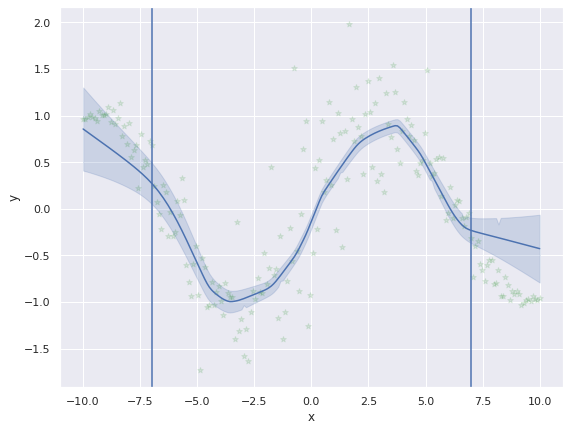

Epoch : 80 | batch train loss: 0.3003378212451935 | test loss: 0.3003378212451935


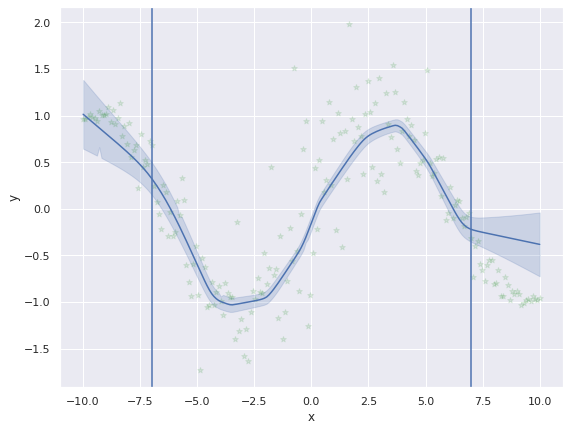

Epoch : 80 | batch train loss: 0.25160300731658936 | test loss: 0.2759704142808914


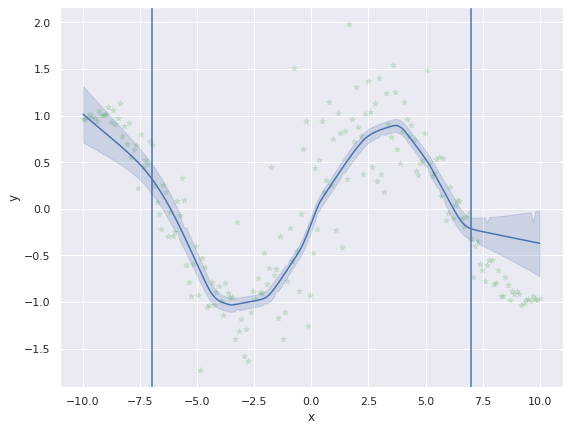

Epoch : 80 | batch train loss: 0.20788586139678955 | test loss: 0.2532755633195241


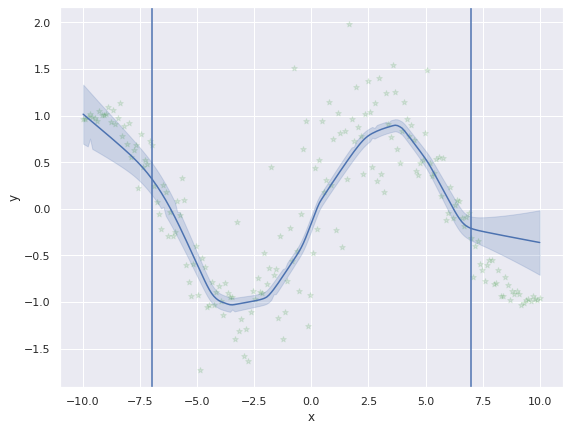

Epoch : 80 | batch train loss: 0.2592187225818634 | test loss: 0.25476135313510895


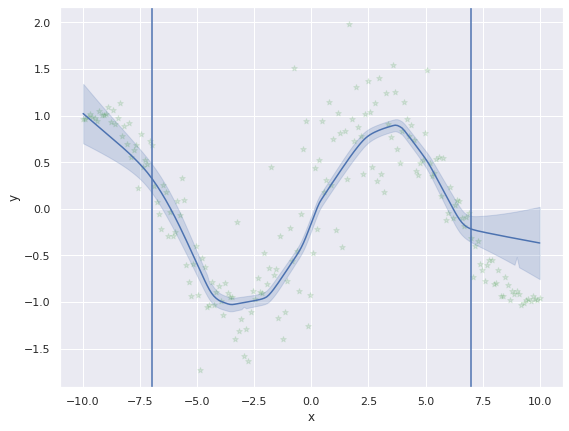

Epoch : 80 | batch train loss: 0.15239113569259644 | test loss: 0.23428730964660643


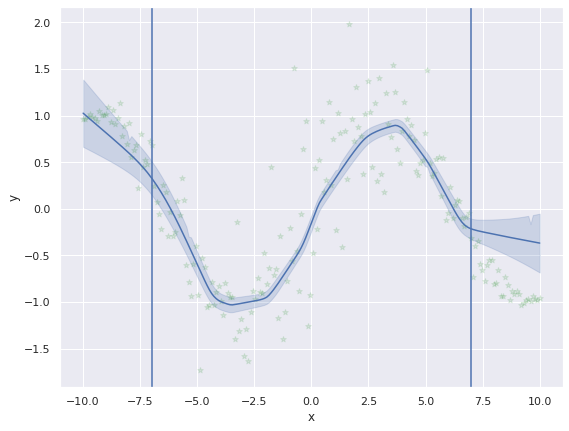

Epoch : 80 | batch train loss: 0.4236716330051422 | test loss: 0.26585136353969574


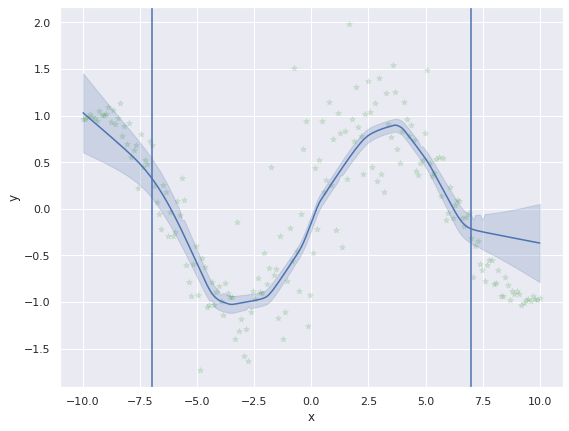

Epoch : 80 | batch train loss: 0.17564380168914795 | test loss: 0.2529645689896175


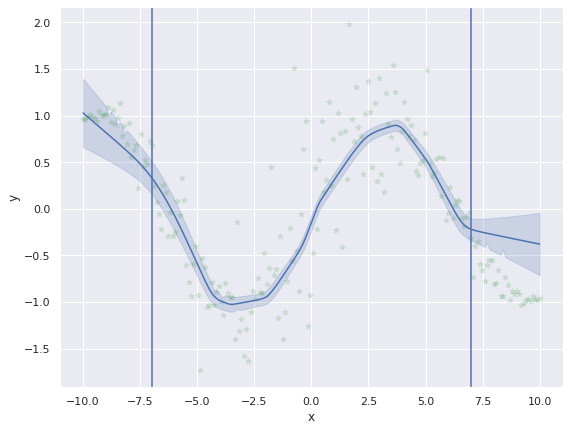

Epoch : 80 | batch train loss: 0.19126774370670319 | test loss: 0.2452524658292532


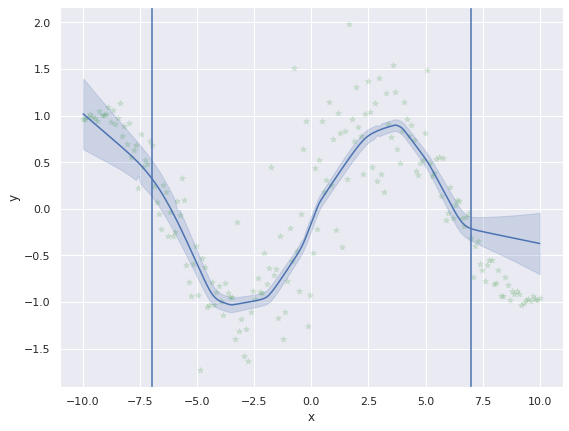

Epoch : 80 | batch train loss: 0.2581005394458771 | test loss: 0.24668002956443363


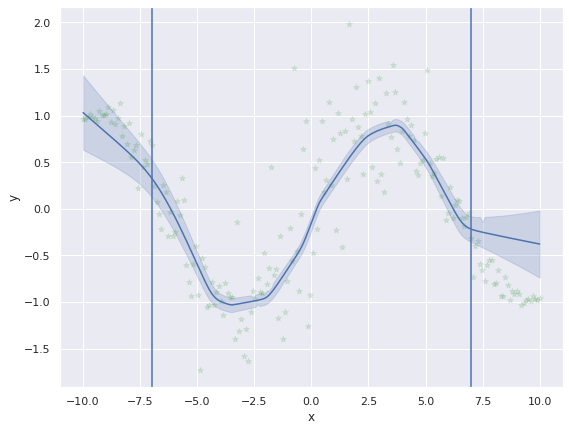

Epoch : 80 | batch train loss: 0.38698434829711914 | test loss: 0.26071046143770216


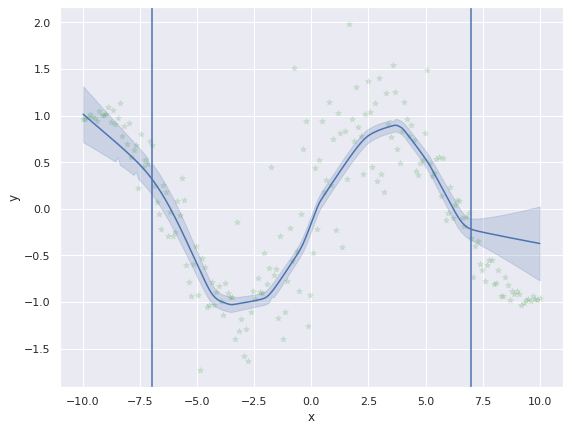

Epoch : 80 | batch train loss: 0.1923336386680603 | test loss: 0.25449438664046203


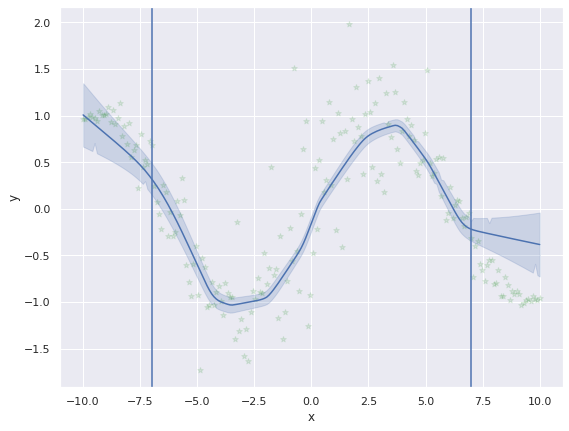

Epoch : 80 | batch train loss: 0.21473801136016846 | test loss: 0.25118135536710423


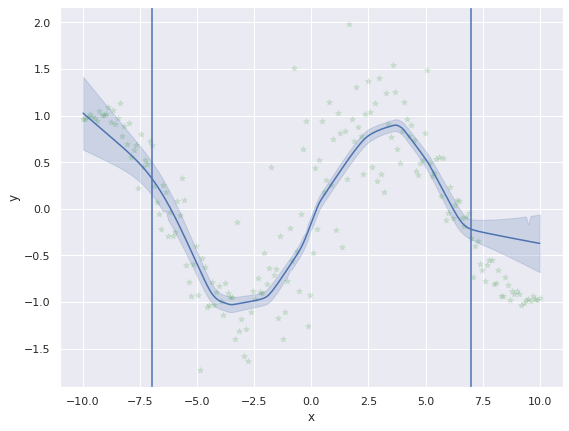

Epoch : 80 | batch train loss: 0.3330245316028595 | test loss: 0.25747698430831617


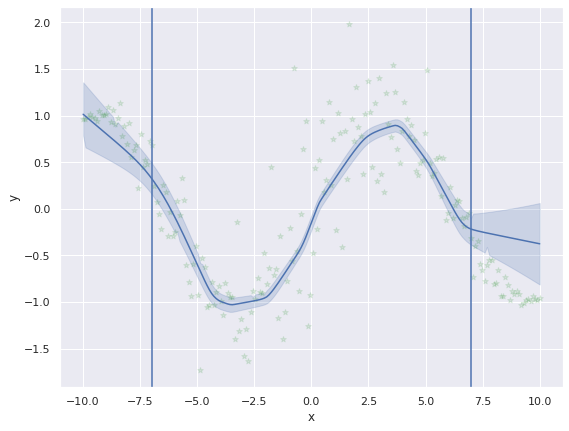

Epoch : 90 | batch train loss: 0.18808406591415405 | test loss: 0.18808406591415405


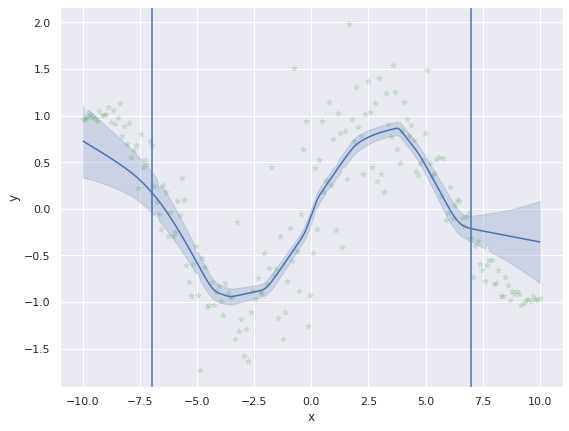

Epoch : 90 | batch train loss: 0.24107427895069122 | test loss: 0.21457917243242264


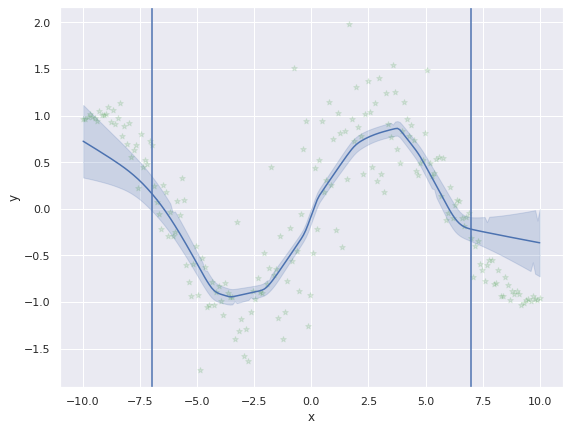

Epoch : 90 | batch train loss: 0.16700910031795502 | test loss: 0.1987224817276001


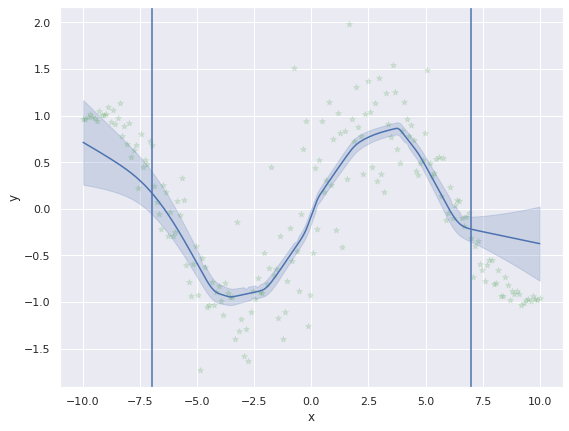

Epoch : 90 | batch train loss: 0.3867205083370209 | test loss: 0.2457219883799553


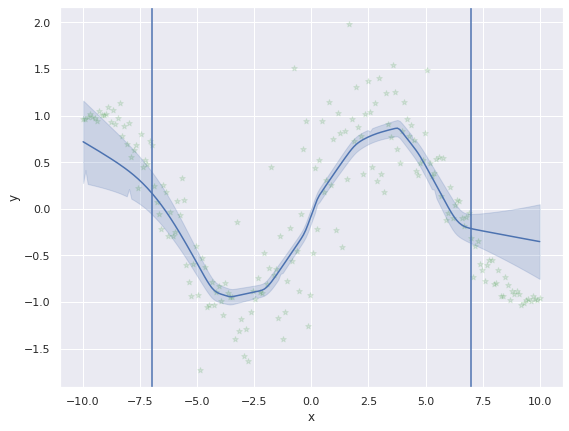

Epoch : 90 | batch train loss: 0.3147701323032379 | test loss: 0.2595316171646118


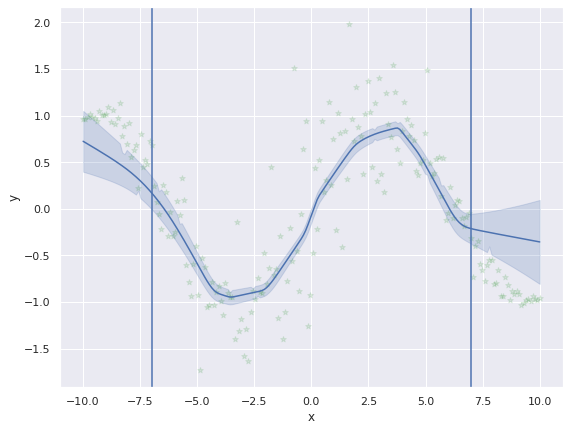

Epoch : 90 | batch train loss: 0.48154404759407043 | test loss: 0.2965336889028549


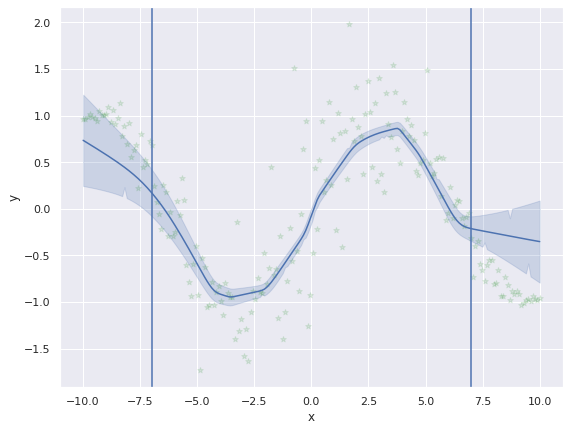

Epoch : 90 | batch train loss: 0.186385378241539 | test loss: 0.2807982159512384


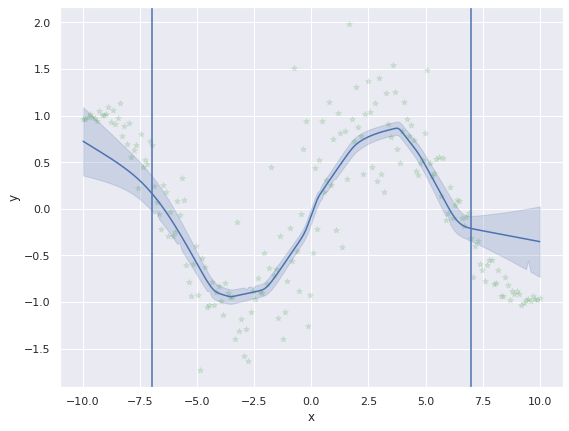

Epoch : 90 | batch train loss: 0.2621949017047882 | test loss: 0.2784728016704321


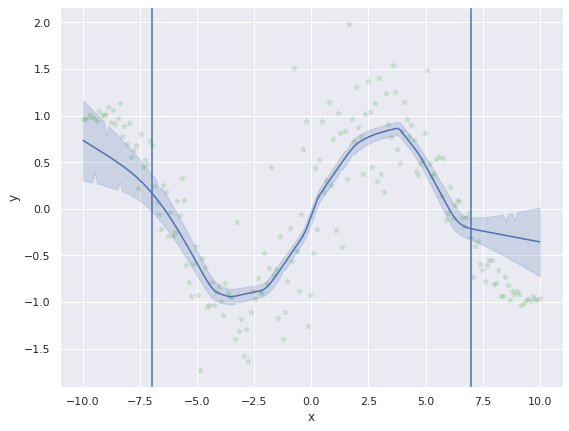

Epoch : 90 | batch train loss: 0.19143474102020264 | test loss: 0.2688019060426288


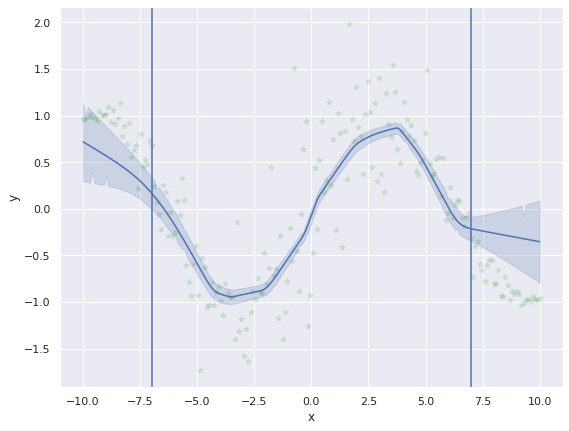

Epoch : 90 | batch train loss: 0.20186056196689606 | test loss: 0.26210777163505555


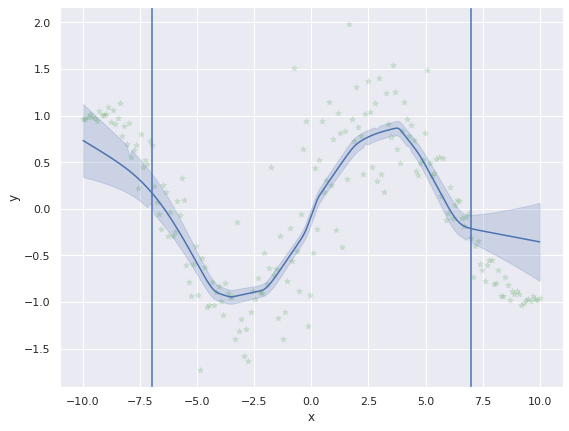

Epoch : 90 | batch train loss: 0.3867868185043335 | test loss: 0.2734422304413535


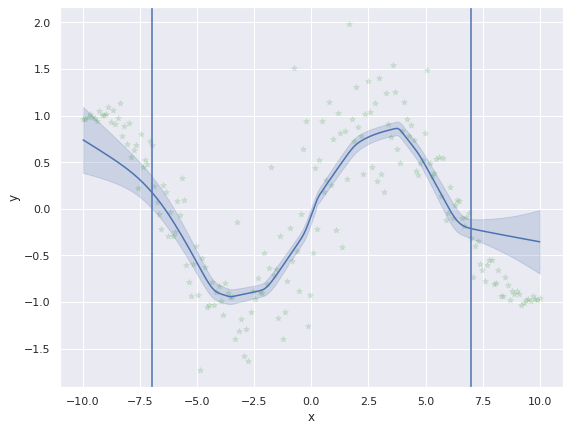

Epoch : 90 | batch train loss: 0.2130620926618576 | test loss: 0.2684105522930622


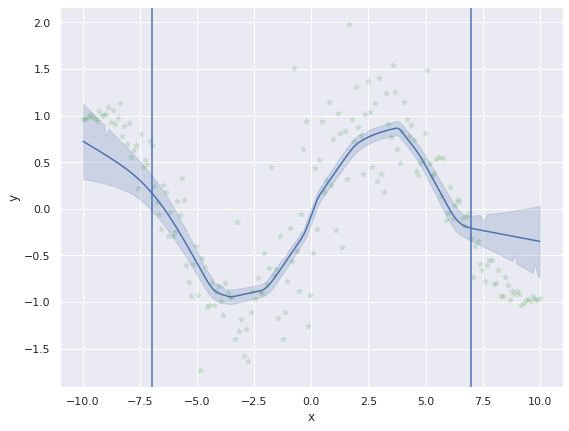

Epoch : 90 | batch train loss: 0.17912767827510834 | test loss: 0.26154263890706575


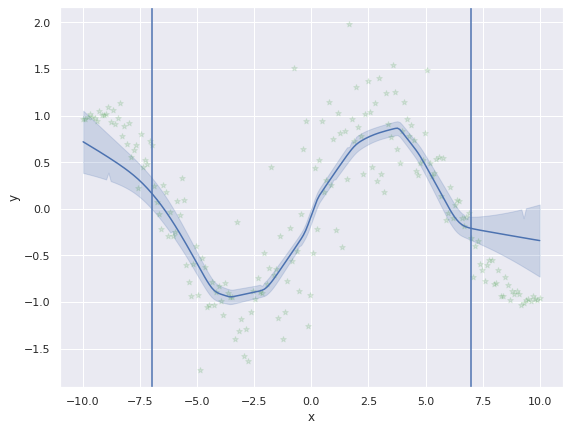

In [13]:
#auhor: Christina
import torch.optim as optim
import torch.nn.functional as F

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
criterion = torch.nn.MSELoss()
optimizer = optim.Adam(bnn.parameters(),lr=0.01)

bnn.train()
bnn.to(device)

epochs = 100
for epoch in range(epochs):
    # Train loop
    for batch in train_loader:
        x = batch[0].to(device)
        y = batch[1].to(device)
        optimizer.zero_grad()

        # See https://arxiv.org/pdf/1505.05424.pdf for complexity cost weight
        loss = bnn.sample_elbo(inputs=x,
                           labels=y,
                           criterion=criterion,
                           sample_nbr=1,
                           complexity_cost_weight=0.01/len(train_dataset))
        loss.backward()
        optimizer.step()

    if epoch % 10 == 0:
      all_test_losses = []
      for batch in test_loader:
        x = batch[0].to(device)
        y = batch[1].to(device)
        #no out, direct calculate loss
        loss = bnn.sample_elbo(inputs=x,
                      labels=y,
                      criterion=criterion,
                      sample_nbr=3,
                      complexity_cost_weight=0.01/len(test_dataset))
        all_test_losses.append(loss.item())
        test_loss = sum(all_test_losses)/len(all_test_losses)
        print(f'Epoch : {epoch} | batch train loss: {loss} | test loss: {test_loss}')
        make_plot_bnn(bnn)

Epoch 0 | batch train loss: 1.324405312538147 | test loss: 1.3874098108364985


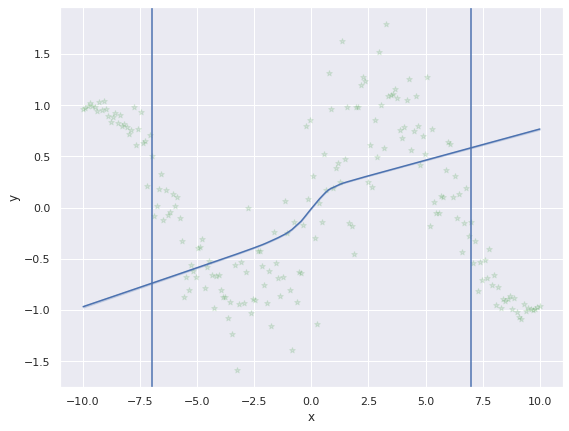

Epoch 10 | batch train loss: 0.3796928822994232 | test loss: 0.4115681189757127


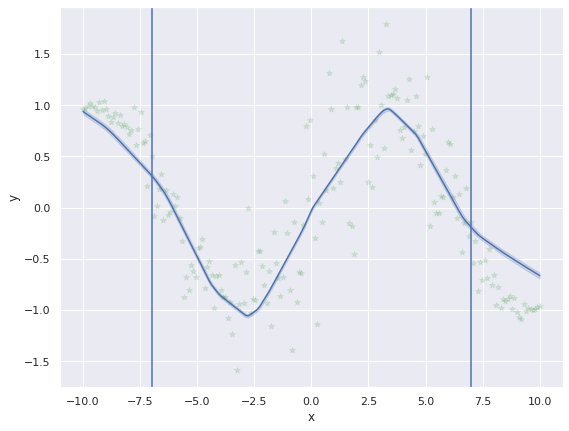

Epoch 20 | batch train loss: 0.3101753890514374 | test loss: 0.32519055902957916


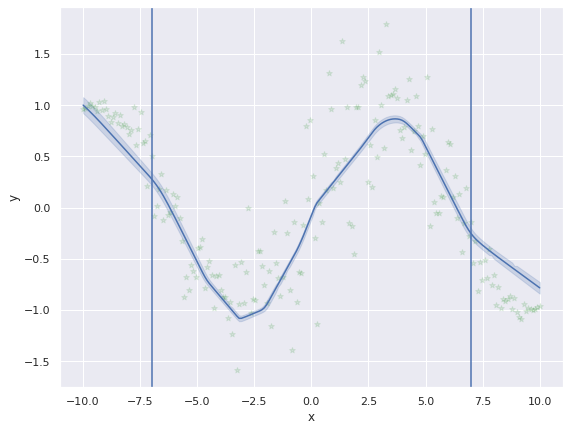

Epoch 30 | batch train loss: 0.28524249792099 | test loss: 0.30262871659719026


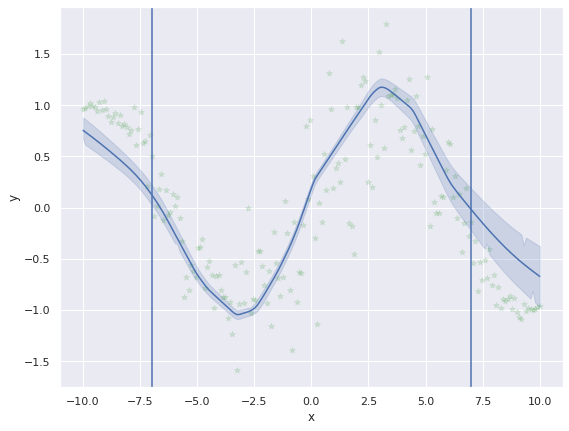

Epoch 40 | batch train loss: 0.3874534070491791 | test loss: 0.24689362943172455


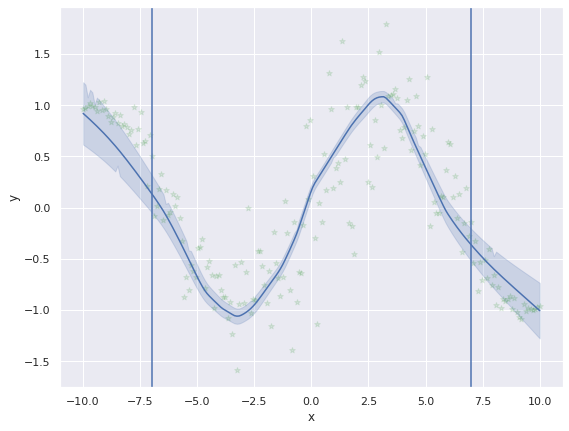

Epoch 50 | batch train loss: 0.18301820755004883 | test loss: 0.22928586029089415


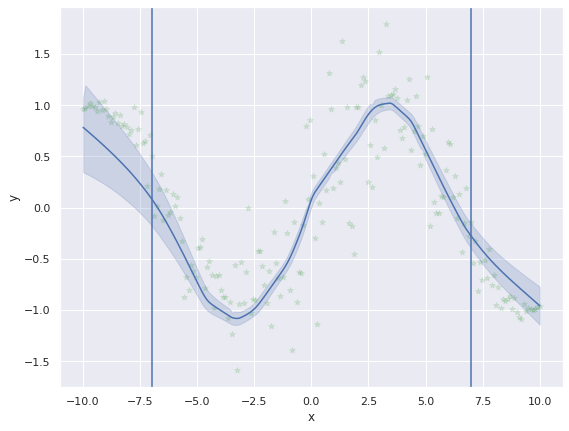

Epoch 60 | batch train loss: 0.14175187051296234 | test loss: 0.20888827741146088


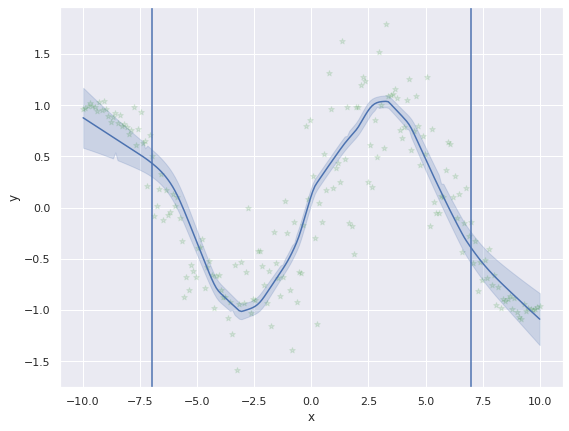

Epoch 70 | batch train loss: 0.18662989139556885 | test loss: 0.21788568794727325


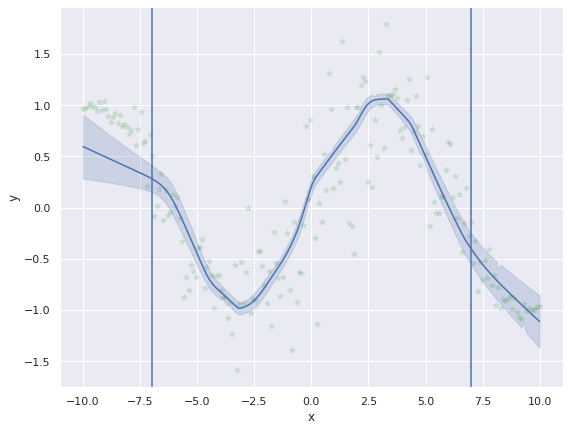

Epoch 80 | batch train loss: 0.3108323812484741 | test loss: 0.27198601915286136


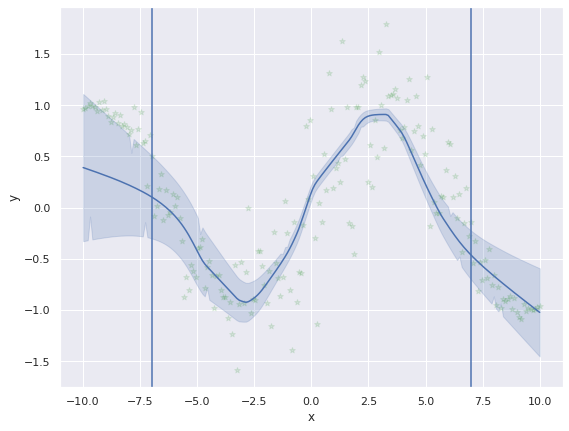

Epoch 90 | batch train loss: 0.38807395100593567 | test loss: 0.266510655100529


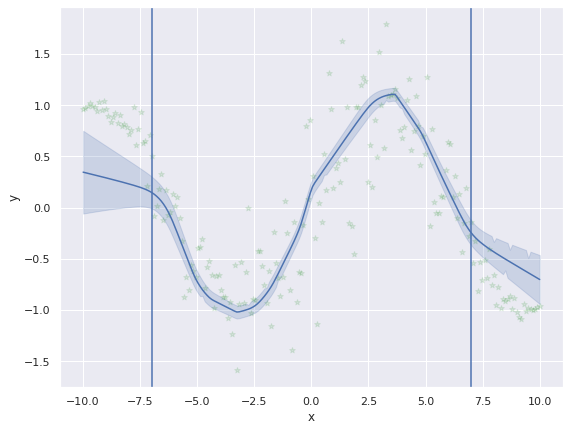

In [ ]:
import torch.optim as optim
import torch.nn.functional as F

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
criterion = torch.nn.MSELoss()
optimizer = optim.Adam(bnn.parameters(), lr=0.01)

bnn.train()
bnn.to(device)
for epoch in range(100):
    # Train loop
    for batch in train_loader:
        x = batch[0].to(device)
        y = batch[1].to(device)
        optimizer.zero_grad()

        # See https://arxiv.org/pdf/1505.05424.pdf for complexity cost weight
        loss = bnn.sample_elbo(inputs=x,
                           labels=y,
                           criterion=criterion,
                           sample_nbr=1,
                           complexity_cost_weight=0.01/len(train_dataset))

        loss.backward()
        optimizer.step()
    if epoch % 10 == 0:
        all_test_losses = []
        # Test loop
        for batch in test_loader:
             x = batch[0].to(device)
             y = batch[1].to(device)
             loss = bnn.sample_elbo(inputs=x,
                           labels=y,
                           criterion=criterion,
                           sample_nbr=3,
                           complexity_cost_weight=0.01/len(test_dataset))
             all_test_losses.append(loss.item())
        test_loss = sum(all_test_losses)/len(all_test_losses)
        print(f"Epoch {epoch} | batch train loss: {loss} | test loss: {test_loss}")
        make_plot_bnn(bnn)

## Monte Carlo Dropout

In [14]:
from numpy.ma.core import outer
from sys import stderr
import torch.nn as nn
import torch.nn.functional as F

class MCDO(nn.Module):
    def __init__(self):
        super(MCDO, self).__init__()
        hidden_size = 32

        # We only have 1 input feature
        self.fc1 = nn.Linear(1, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.out = nn.Linear(hidden_size, 1)
        self.dropout = nn.Dropout(p=0.1)

    def forward(self, x):
        h = self.dropout(torch.relu(self.fc1(x)))
        h = self.dropout(torch.relu(self.fc2(h)))
        out = self.out(h)
        return out

model = MCDO()
print(model)
print("Params:", sum(p.numel() for p in model.parameters() if p.requires_grad))

MCDO(
  (fc1): Linear(in_features=1, out_features=32, bias=True)
  (fc2): Linear(in_features=32, out_features=32, bias=True)
  (out): Linear(in_features=32, out_features=1, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
)
Params: 1153


In [15]:
def make_plot_mcdo(model, samples = 50):
    # Keep dropout active!
    model.train()
    preds = [model(tensor_x_test) for i in range(samples)]
    preds = torch.stack(preds)
    means = preds.mean(axis=0).detach().numpy()
    stds =  preds.std(axis=0).detach().numpy()
    dfs = []
    y_vals = [means, means+2*stds, means-2*stds]

    for i in range(3):
      data = {
            "x": list(tensor_x_test.squeeze().numpy()),
            "y": list(y_vals[i].squeeze())
      }
      temp = pd.DataFrame.from_dict(data)
      dfs.append(temp)

    df = pd.concat(dfs).reset_index()

    # Plot predictions with confidence
    sns_plot = sns.lineplot(data=df, x="x", y="y")

    # Highligh training range
    plt.axvline(x=start)
    plt.axvline(x=end)

    # Plot train data on top
    scatter(x_train, y_train, c="green", marker="*", alpha=0.1)
    plt.show()

Epoch 0 | batch train loss: 0.24754154682159424 | test loss: 0.9059364749835088


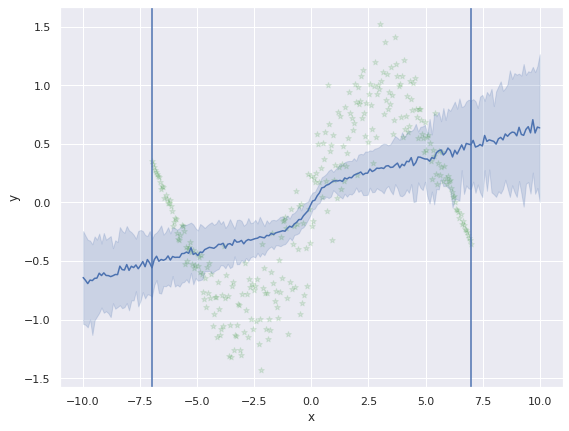

Epoch 10 | batch train loss: 0.066747285425663 | test loss: 0.2684860470203253


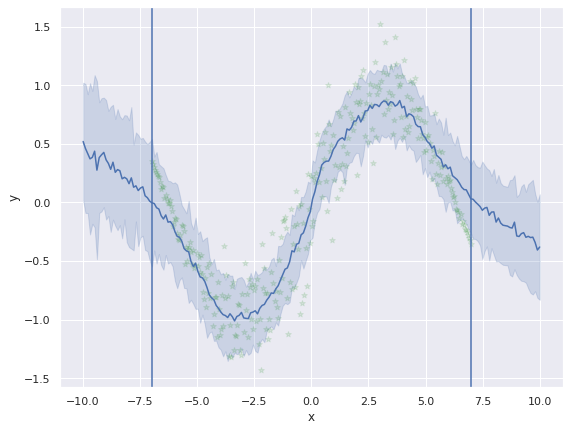

Epoch 20 | batch train loss: 0.054533421993255615 | test loss: 0.23804008960723877


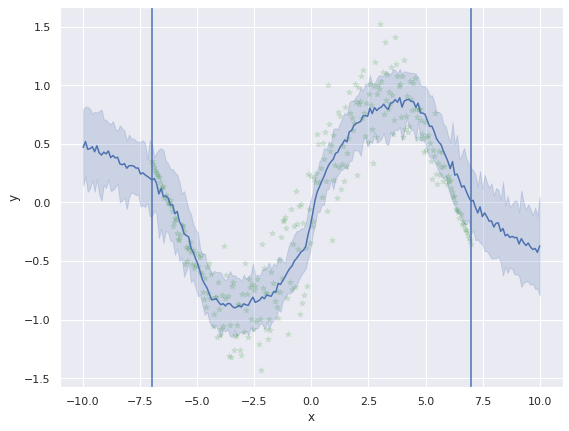

Epoch 30 | batch train loss: 0.061217159032821655 | test loss: 0.2257683540766056


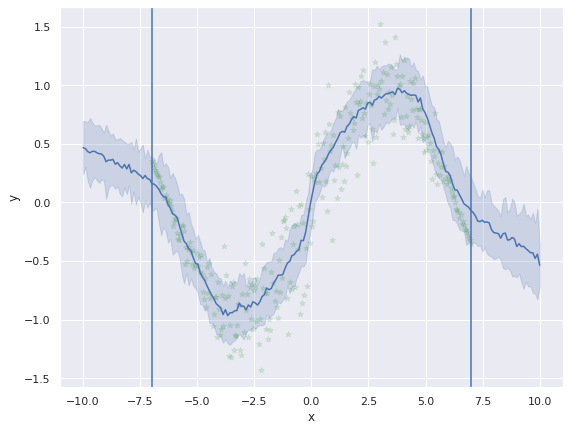

Epoch 40 | batch train loss: 0.10968780517578125 | test loss: 0.22913642284961847


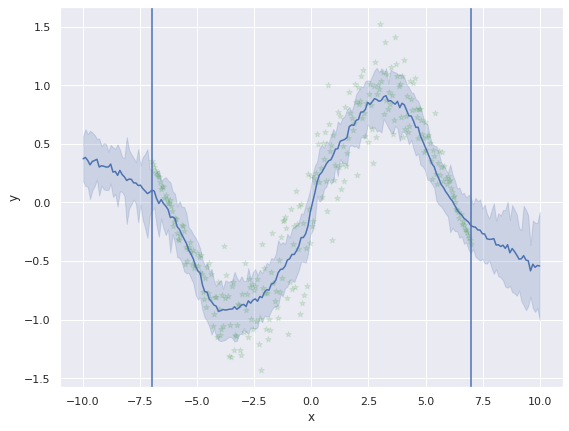

Epoch 50 | batch train loss: 0.035688791424036026 | test loss: 0.24596184492111206


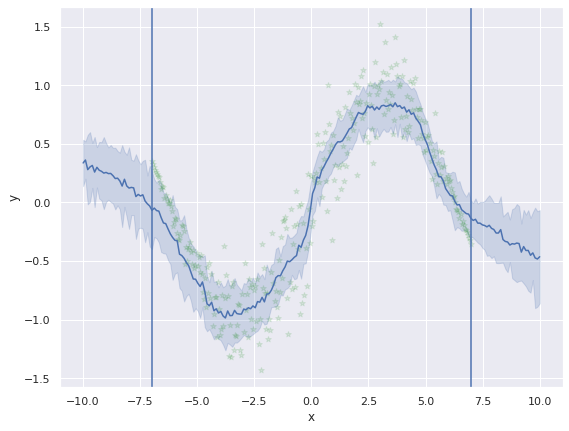

Epoch 60 | batch train loss: 0.0570746511220932 | test loss: 0.2317031237941522


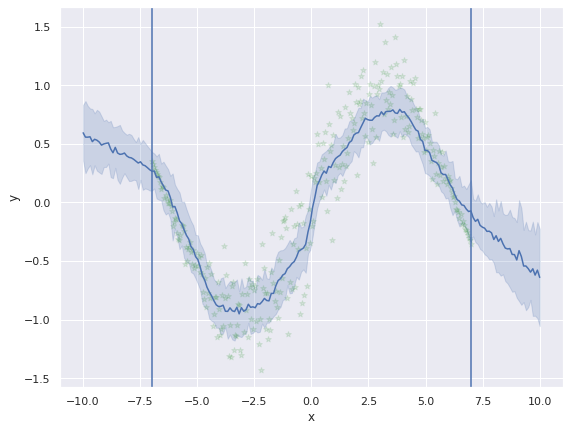

Epoch 70 | batch train loss: 0.1188993826508522 | test loss: 0.2248737892279258


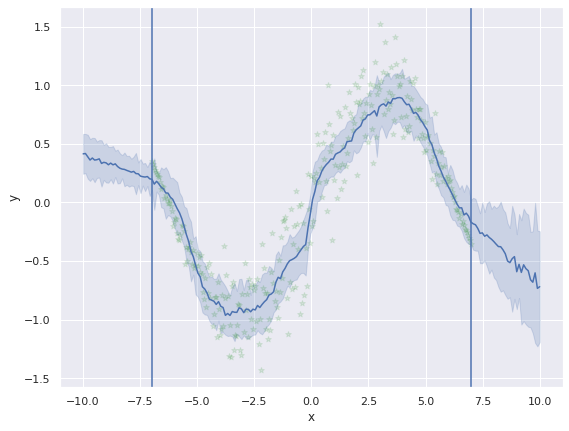

Epoch 80 | batch train loss: 0.049126047641038895 | test loss: 0.20082685637932557


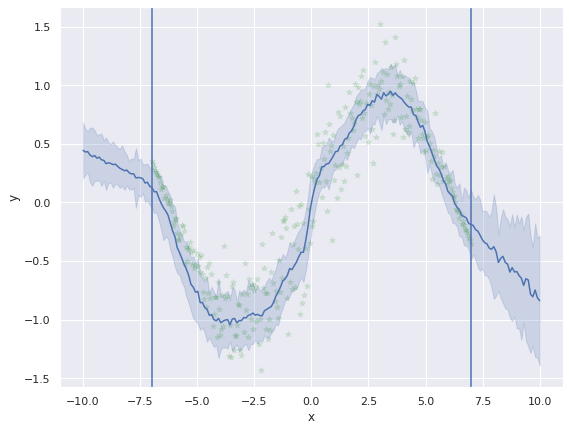

Epoch 90 | batch train loss: 0.050098299980163574 | test loss: 0.19449317799164698


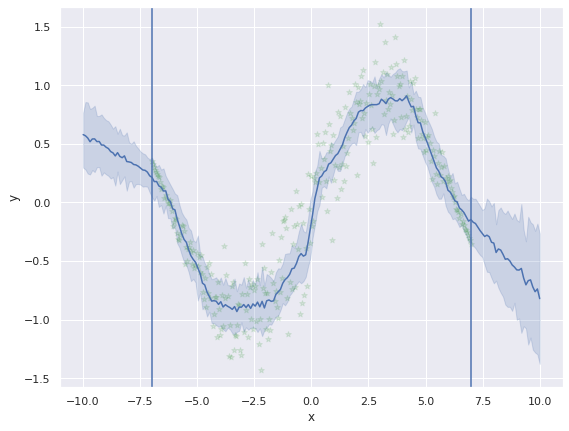

Epoch 100 | batch train loss: 0.06643778085708618 | test loss: 0.23255307628558233


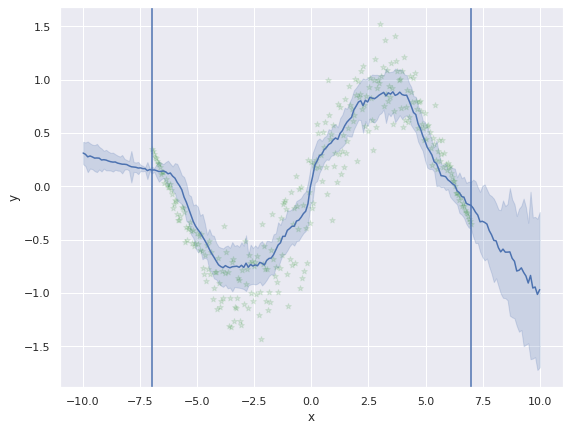

Epoch 110 | batch train loss: 0.056641802191734314 | test loss: 0.22177226325640312


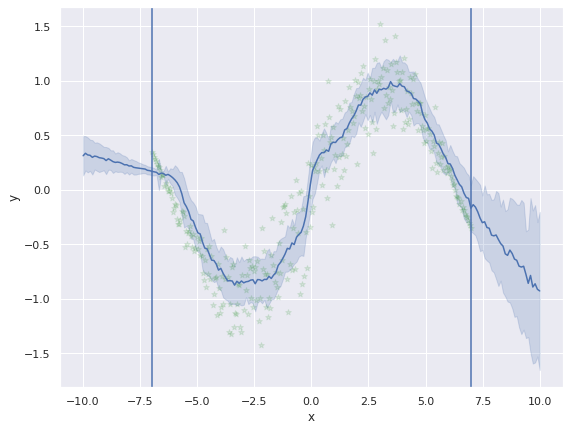

Epoch 120 | batch train loss: 0.061054471880197525 | test loss: 0.18804212659597397


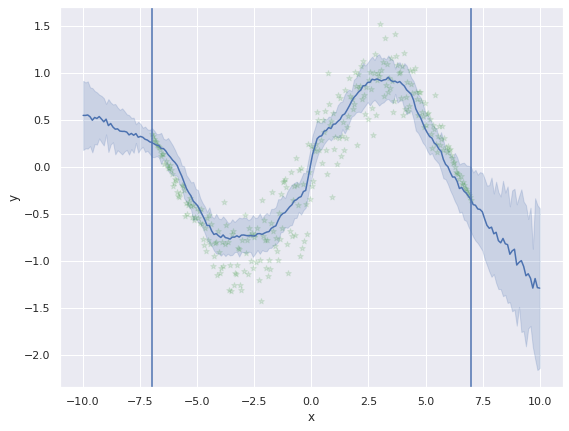

Epoch 130 | batch train loss: 0.07044597715139389 | test loss: 0.19720877133882964


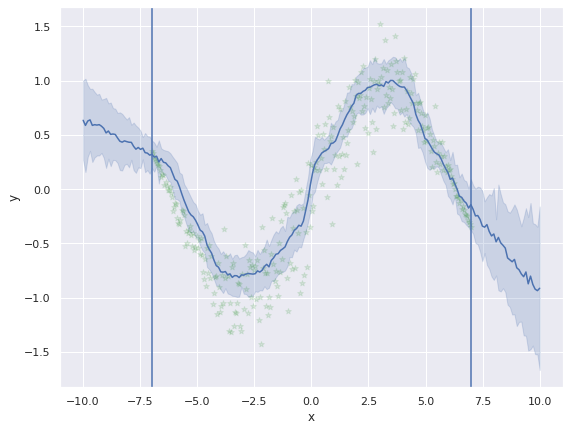

Epoch 140 | batch train loss: 0.03423229232430458 | test loss: 0.18536920186418754


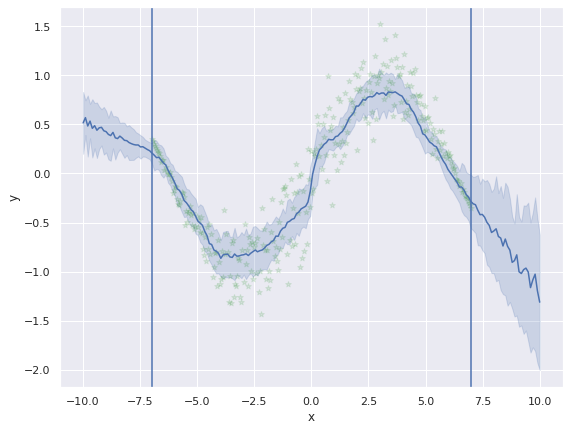

In [16]:
criterion = torch.nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)
model.to(device)

for epoch in range(150):
    model.train()
    # Train loop
    for batch in train_loader:
        x = batch[0].to(device)
        y = batch[1].to(device)
        optimizer.zero_grad()
        out = model(x)
        loss = criterion(y, out)
        loss.backward()
        optimizer.step()
    if epoch % 10 == 0:
        all_test_losses = []
        # Test loop
        for batch in test_loader:
             x = batch[0].to(device)
             y = batch[1].to(device)

             # Sample MC Dropout predictions
             outs = []
             for i in range(10):
                  out = model(x)
                  outs.append(out)
              
             # Take mean prediction
             out = sum(outs)/len(outs)
             all_test_losses.append(criterion(y, out).item())
        test_loss = sum(all_test_losses)/len(all_test_losses)
        print(f"Epoch {epoch} | batch train loss: {loss} | test loss: {test_loss}")
        make_plot_mcdo(model)

## Deep Ensembles
-  A deep ensemble, that predicts mean and standard deviation is effectively a Gaussian Mixture Model, because the target variable is assumed to be normally distributed

In [ ]:
class SimpleNet(nn.Module):
    def __init__(self):
        super(SimpleNet, self).__init__()
        hidden_size = 64

        self.fc1 = nn.Linear(1, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.mu = nn.Linear(hidden_size, 1)
        self.var = nn.Linear(hidden_size, 1)

    def forward(self, x):
        h = torch.relu(self.fc1(x))
        h = torch.relu(self.fc2(h))
        mu = self.mu(h)
        var = torch.exp(self.var(h))
        return mu, var

model = SimpleNet()
print(model)
print("Params:", sum(p.numel() for p in model.parameters() if p.requires_grad))

SimpleNet(
  (fc1): Linear(in_features=1, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (mu): Linear(in_features=64, out_features=1, bias=True)
  (var): Linear(in_features=64, out_features=1, bias=True)
)
Params: 4418


In [ ]:
def make_plot_de(model):
    mus = []
    vars = []
    for m in model:
        mu, var = m(tensor_x_test) 
        mus.append(mu)
        vars.append(var)

    # For epistemic uncertainty we calculate the std on the mus!
    means = torch.stack(mus).mean(axis=0).detach().numpy()
    stds = torch.stack(mus).std(axis=0).detach().numpy()**(1/2)

    dfs = []
    y_vals = [means, means+2*stds, means-2*stds]

    for i in range(3):
      data = {
            "x": list(tensor_x_test.squeeze().numpy()),
            "y": list(y_vals[i].squeeze())
      }
      temp = pd.DataFrame.from_dict(data)
      dfs.append(temp)

    df = pd.concat(dfs).reset_index()

    # Plot predictions with confidence
    sns_plot = sns.lineplot(data=df, x="x", y="y")

    # Highligh training range
    plt.axvline(x=start)
    plt.axvline(x=end)

    # Plot train data on top
    scatter(x_train, y_train, c="green", marker="*", alpha=0.1)

    plt.show()

In [ ]:
# Construct ensemble
num_models = 5
deep_ensemble = [SimpleNet().to(device) for i in range(num_models)]
criterion = torch.nn.GaussianNLLLoss(eps=1e-02)
optimizers = [optim.Adam(m.parameters(), lr=0.001) for m in deep_ensemble]

Epoch 0 | batch train loss: -0.13475598841905595 | test loss: 2.1471542046620296


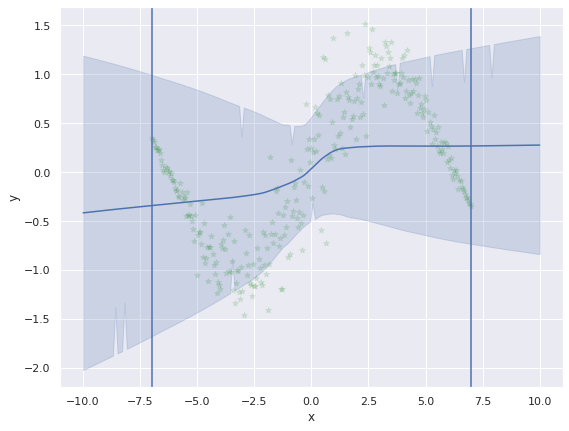

Epoch 10 | batch train loss: -0.8152347683906556 | test loss: 9.647245607467799


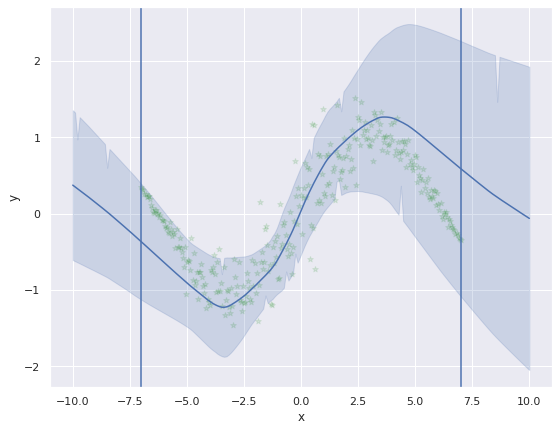

Epoch 20 | batch train loss: -1.1602327585220338 | test loss: 3.1690307886554643


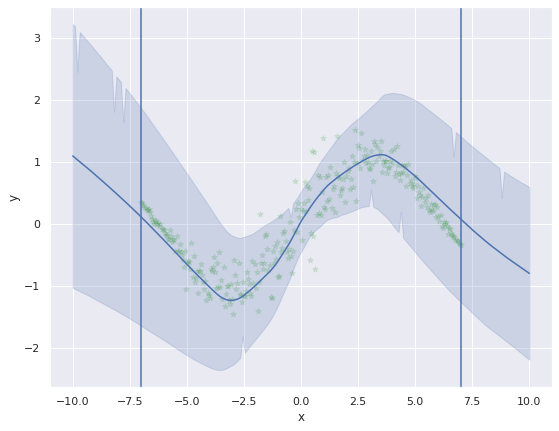

Epoch 30 | batch train loss: -1.03847838640213 | test loss: 5.992583264983617


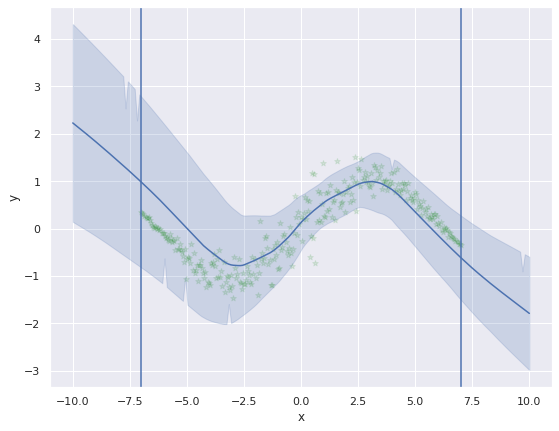

Epoch 40 | batch train loss: -1.5245550632476808 | test loss: 0.5903588259449373


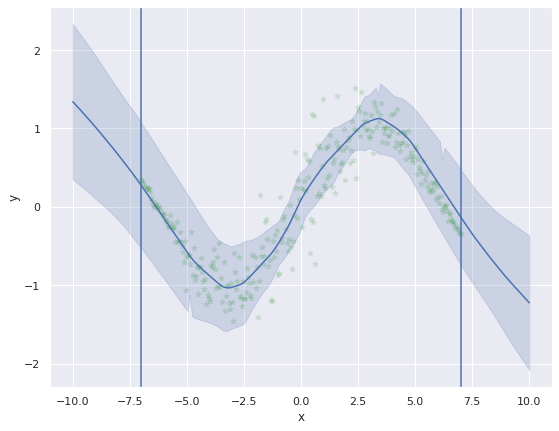

Epoch 50 | batch train loss: -1.0302794575691223 | test loss: 1.2329883731328524


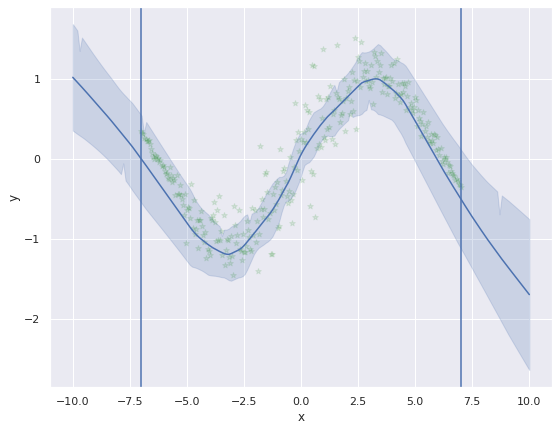

Epoch 60 | batch train loss: -0.4941233068704605 | test loss: 8.24277591246825


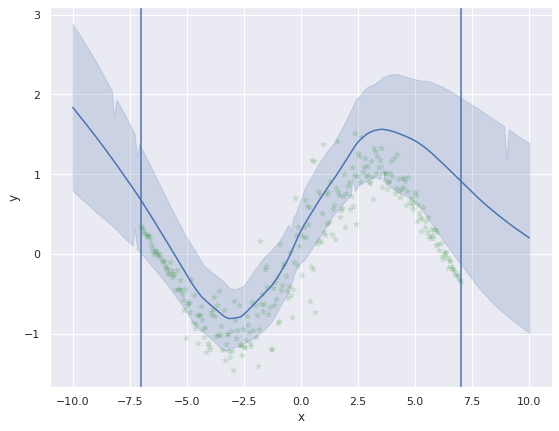

Epoch 70 | batch train loss: -1.0505853533744811 | test loss: 0.5377832609873552


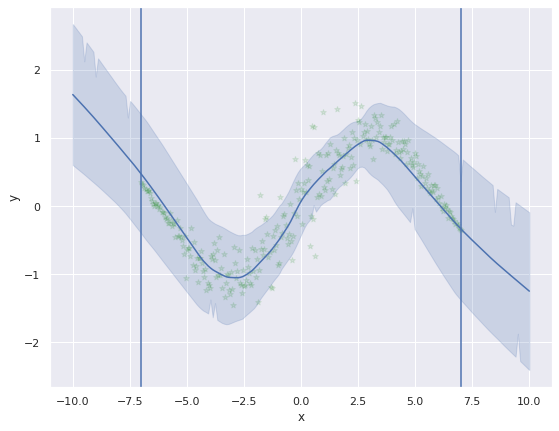

Epoch 80 | batch train loss: -0.9799972891807556 | test loss: 1.236753569657986


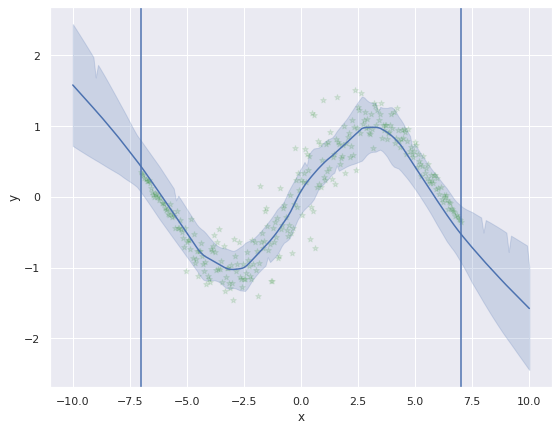

Epoch 90 | batch train loss: -0.9387256979942322 | test loss: 1.4855741584530244


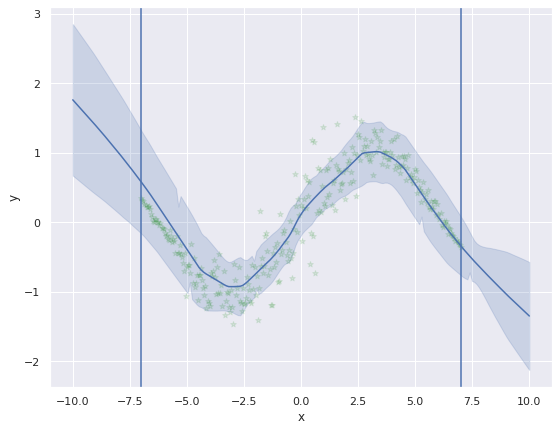

Epoch 100 | batch train loss: -1.2079941272735595 | test loss: 2.504075521001449


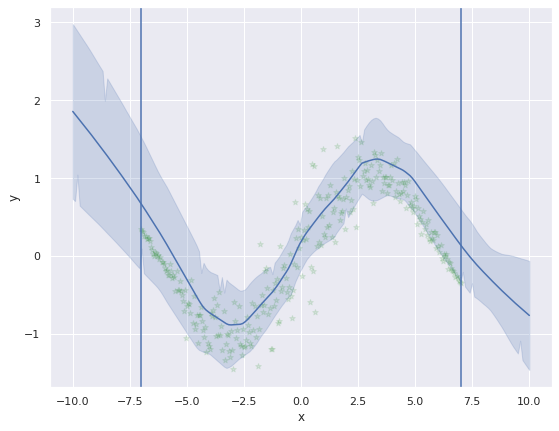

Epoch 110 | batch train loss: -0.8487671256065369 | test loss: 1.0082965451937456


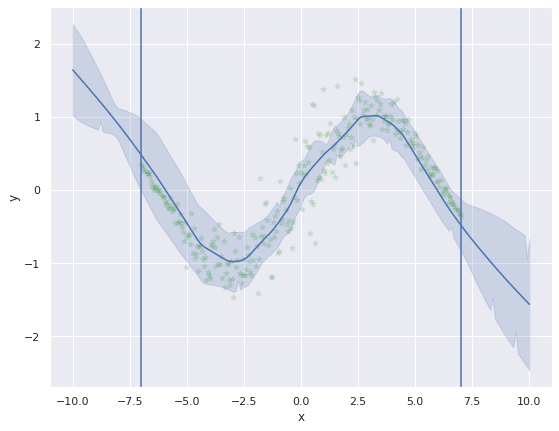

Epoch 120 | batch train loss: -0.6535260081291199 | test loss: 2.198813826074967


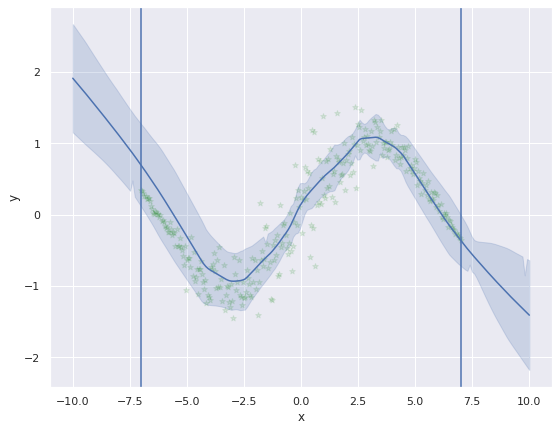

Epoch 130 | batch train loss: -0.9921091198921204 | test loss: 0.9388696606915732


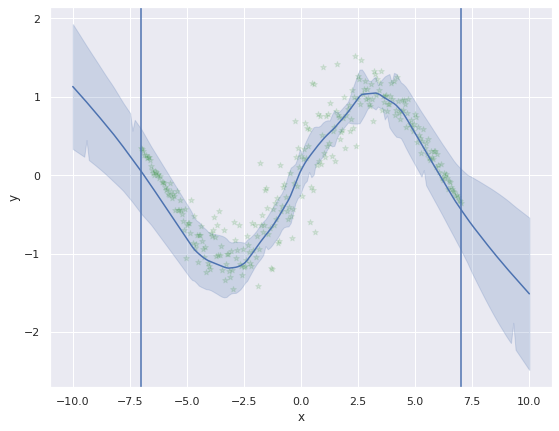

Epoch 140 | batch train loss: -0.9519366502761841 | test loss: 0.44343959574515995


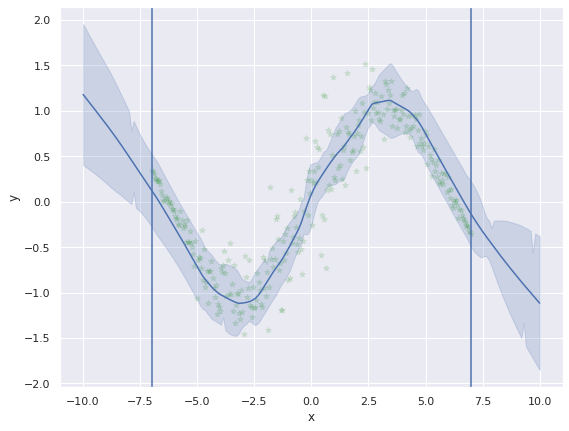

Epoch 150 | batch train loss: -1.3028444290161132 | test loss: 2.247499628708913


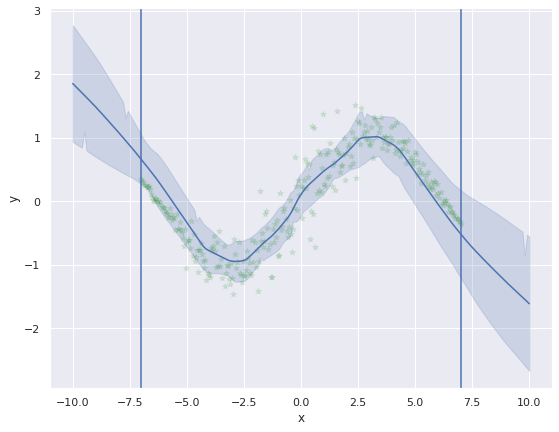

Epoch 160 | batch train loss: -1.2992502927780152 | test loss: 1.0072155450399107


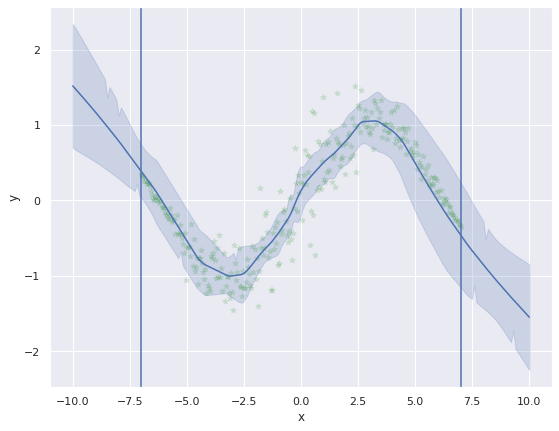

Epoch 170 | batch train loss: -1.2146929025650024 | test loss: 1.0754890906696135


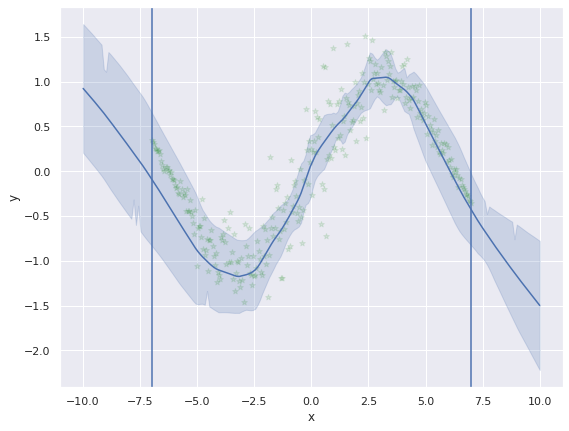

Epoch 180 | batch train loss: -1.1600696802139283 | test loss: 0.708790506537144


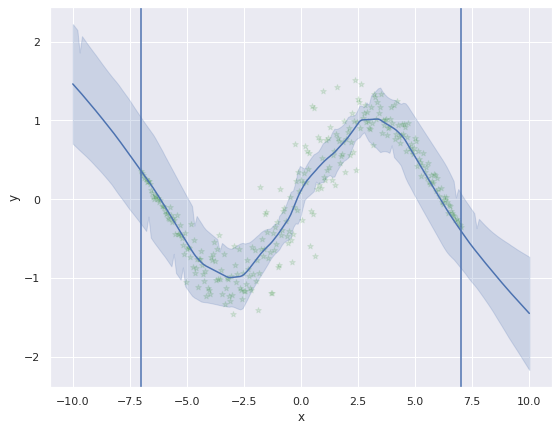

Epoch 190 | batch train loss: -1.0131265282630921 | test loss: 3.1520974037738942


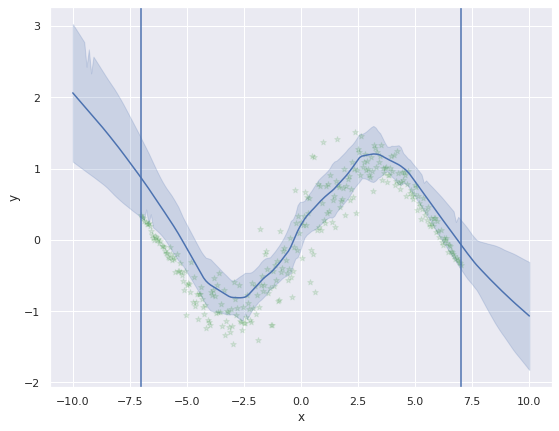

In [ ]:
for epoch in range(200):
    # Train loop
    for batch in train_loader:
        x = batch[0].to(device)
        y = batch[1].to(device)

        losses = []
        mus = []
        vars = []
        for i, model in enumerate(deep_ensemble):
            optimizers[i].zero_grad()
            mu, var = model(x)
            loss = criterion(mu, y, var)
            loss.backward()
            optimizers[i].step()

            losses.append(loss.item())
            mus.append(mu)
            vars.append(var)
        loss = sum(losses)/len(losses)
        
    if epoch % 10 == 0:
        all_test_losses = []
        # Test loop
        for batch in test_loader:
            x = batch[0].to(device)
            y = batch[1].to(device)

            test_losses = []
            mus = []
            vars = []
            for i, model in enumerate(deep_ensemble):
                optimizers[i].zero_grad()
                mu, var = model(x)
                test_loss = criterion(mu, y, var)
                optimizers[i].step()

                test_losses.append(test_loss.item())
                mus.append(mu)
                vars.append(var)
            all_test_losses.append((sum(test_losses)/len(test_losses)))
        test_loss = sum(all_test_losses)/len(all_test_losses)
        print(f"Epoch {epoch} | batch train loss: {loss} | test loss: {test_loss}")
        make_plot_de(deep_ensemble)